# Initialize

In [27]:
import os
from time import *

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys 
sys.path.append('..\\')
from scresonators.fit_resonator.ana_resonator import ResonatorFitter
from scresonators.fit_resonator.ana_resonator import ResonatorData
import csv
from datetime import datetime
from scresonators.measurement import vna_measurement
from scresonators.measurement import helpers
from scresonators.measurement import vna_scan
%load_ext autoreload
%autoreload 2

helpers.config_figs()

import scresonators.measurement.vna_measurement
from scresonators.measurement.ZNB import ZNB20

#VNA = ZNB20(address='10.108.30.65') # Stanford
VNA = ZNB20(address='192.168.137.84') # SLAC

## Daily measurement settings
warm_att = 0 #dB
cold_att = 50

spar = 's43'
base_path = r'C:/_Data/Resonators/20250728-ResSilTa-Aggron-Slab'

# spar = 's21'
# base_path = r'C:/_Data/Resonators/20250728-ResSilTa-Aggron-JPA'

# spar = 's43'
# base_path = r'G:/My Drive/Projects/Materials/Data/250518-ResSilTa3_cooldown2'

# spar = 's43'
# base_path = r'G:/My Drive/Projects/Materials/Data/250605_check_lines/'


if not os.path.exists(base_path):
    os.makedirs(base_path)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
VNA.reset()

# Single power scans

## Single scan

Calculated line delay: -3.978638871557999e-07


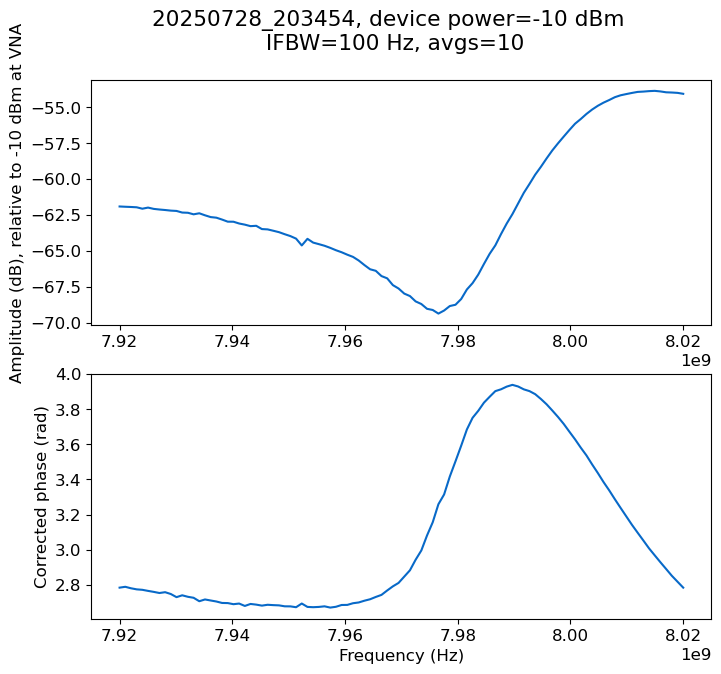

In [84]:
expt_path = base_path
scan_def = {'freq_center':7.97e9, 
            'span':0.1e9,  
            'bandwidth':100, 
            'power':-10, 
            'npoints':100, 
            'averages':10}
#file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
file_name = 'f4'
data=vna_scan.do_vna_scan(VNA, file_name, expt_path, scan_def, 's43')

Calculated line delay: -4.050760380477675e-07


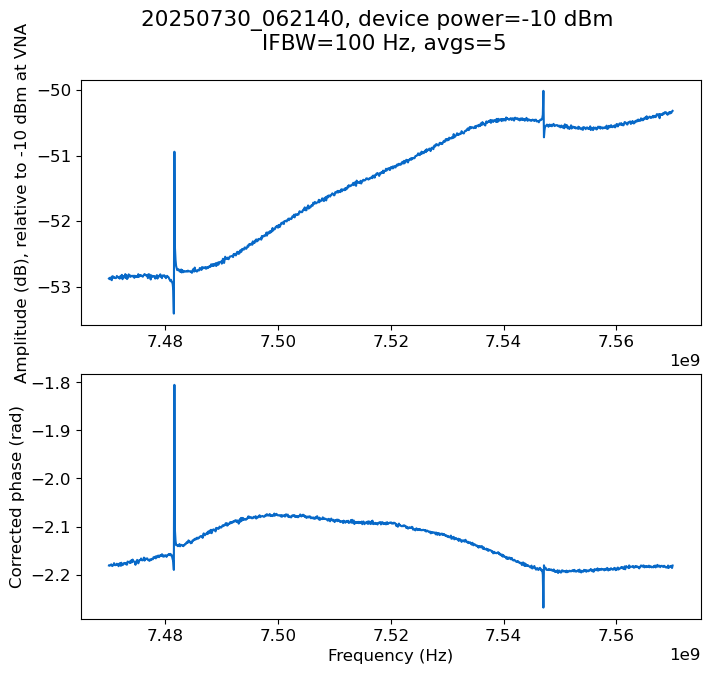

In [40]:
expt_path = base_path
scan_def = {'freq_center':7.52e9, 
            'span':0.1e9,  
            'bandwidth':100, 
            'power':-10, 
            'npoints':1000, 
            'averages':5}
#file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
file_name = 'check1'
data=vna_scan.do_vna_scan(VNA, file_name, expt_path, scan_def, spar)

Calculated line delay: 1.4295633528070143e-08


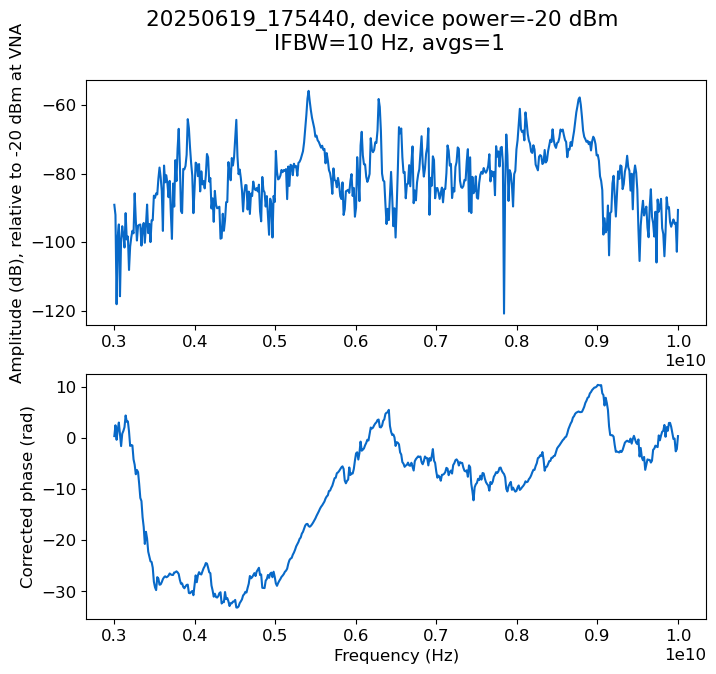

In [259]:
expt_path = base_path
scan_def = {'freq_center':6.5e9, 
            'span':7e9,  
            'bandwidth':10, 
            'power':-20, 
            'npoints':500, 
            'averages':1}
#file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
file_name = 'S41'
data=vna_scan.do_vna_scan(VNA, file_name, expt_path, scan_def, 's41')

Calculated line delay: -3.7483372747773653e-07


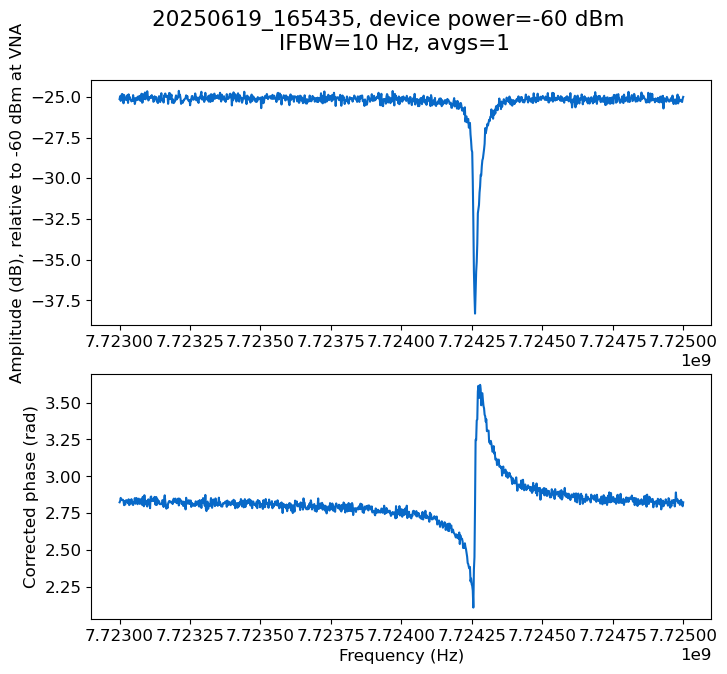

In [233]:
expt_path = base_path
scan_def = {'freq_center':7.72425e9, 
            'span':0.5e6,  
            'bandwidth':10, 
            'power':-60, 
            'npoints':1000, 
            'averages':1}
#file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
file_name = 'waste'
data2=vna_scan.do_vna_scan(VNA, file_name, expt_path, scan_def, 's43')


-60.0
Calculated line delay: -3.6587005147674795e-07


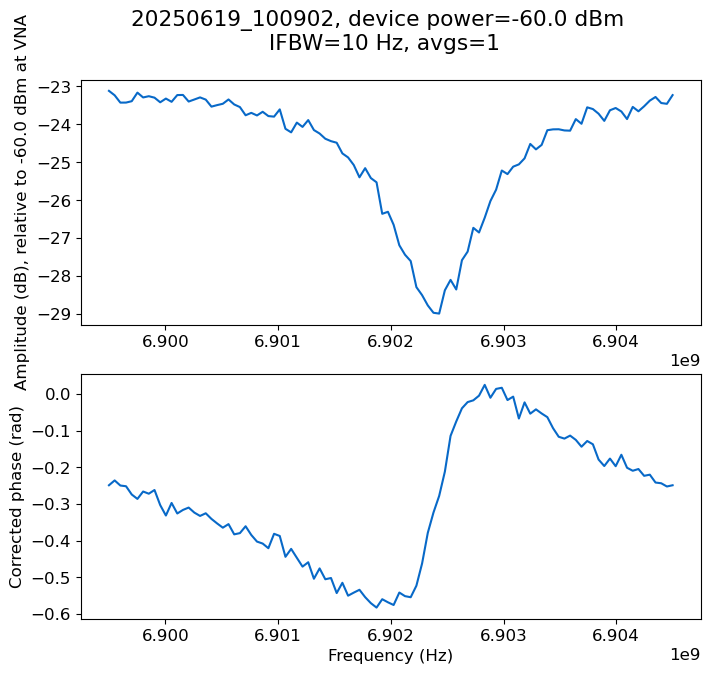

-59.5
Calculated line delay: -3.669391446264224e-07


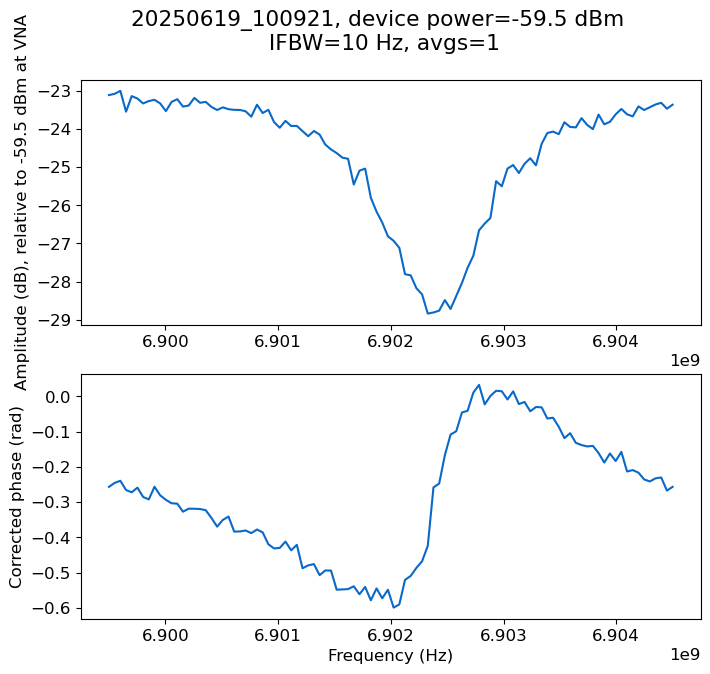

-59.0
Calculated line delay: -3.694845912781622e-07


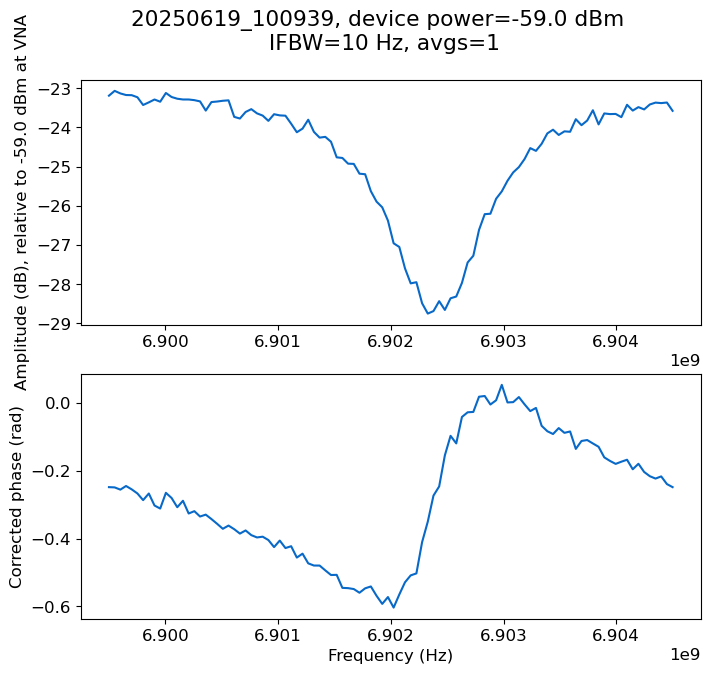

-58.5
Calculated line delay: -3.702146742996135e-07


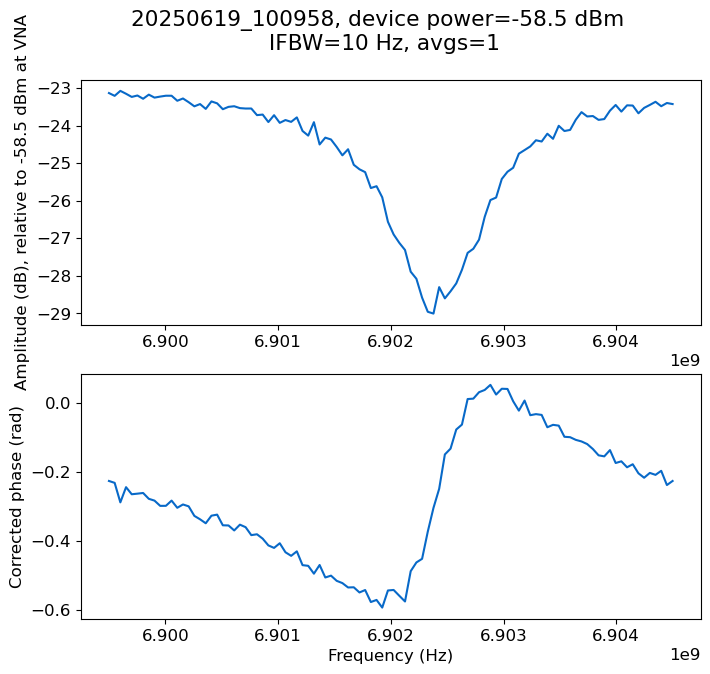

-58.0
Calculated line delay: -3.673445358038707e-07


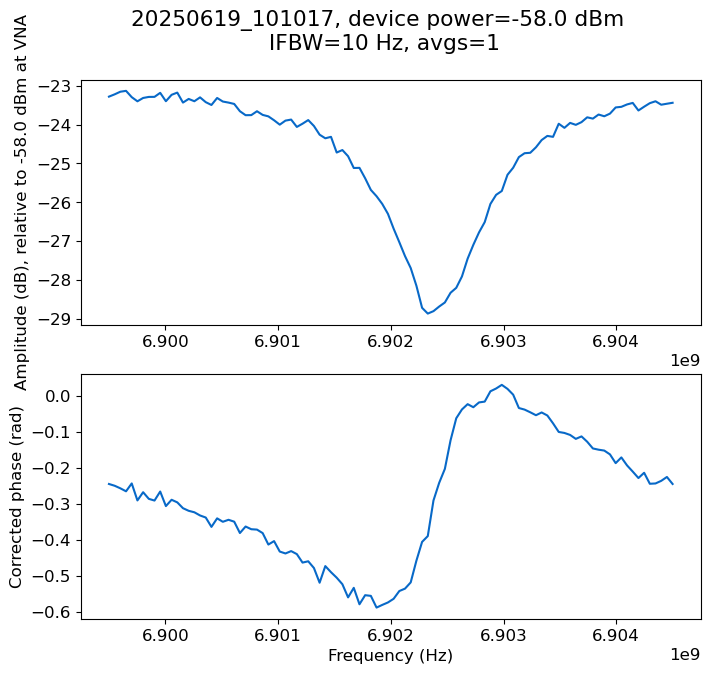

-57.5
Calculated line delay: -3.672839594294203e-07


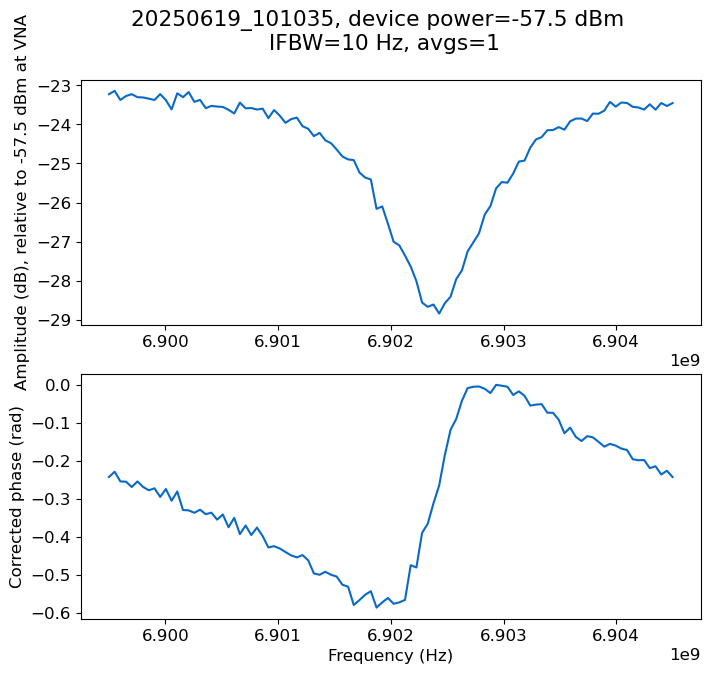

-57.0
Calculated line delay: -3.712483983012751e-07


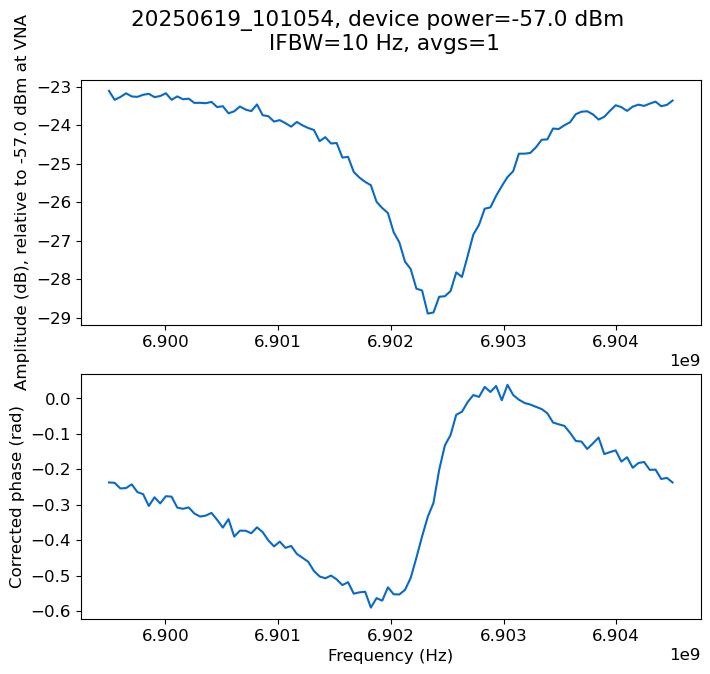

-56.5
Calculated line delay: -3.67958622596817e-07


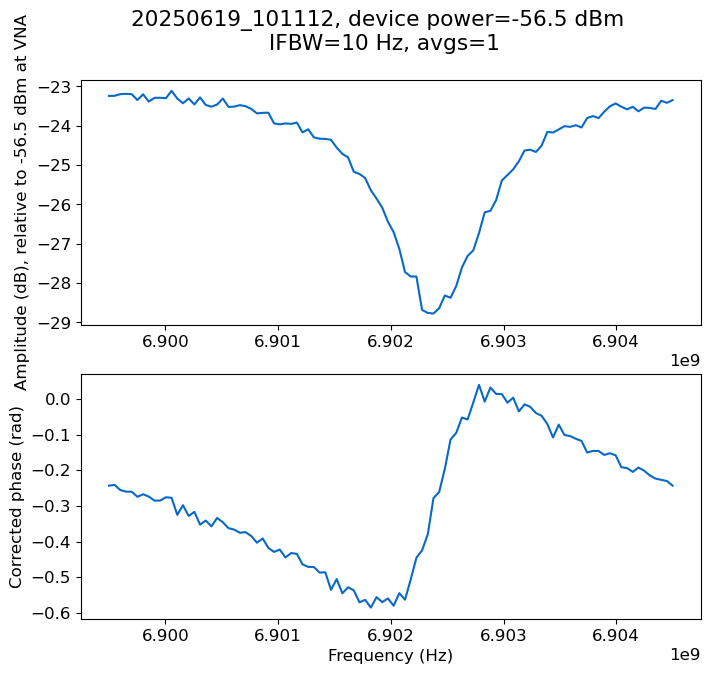

-56.0
Calculated line delay: -3.6684077760954607e-07


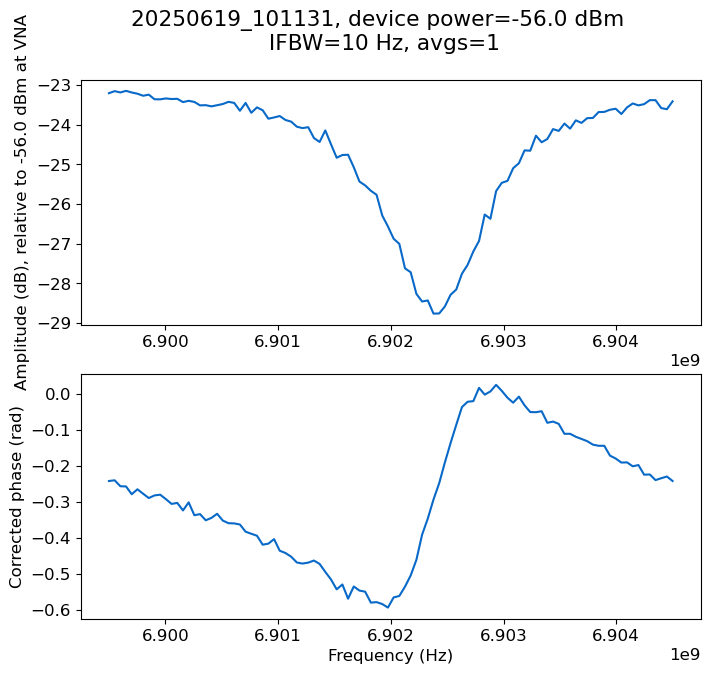

-55.5
Calculated line delay: -3.6579333651887896e-07


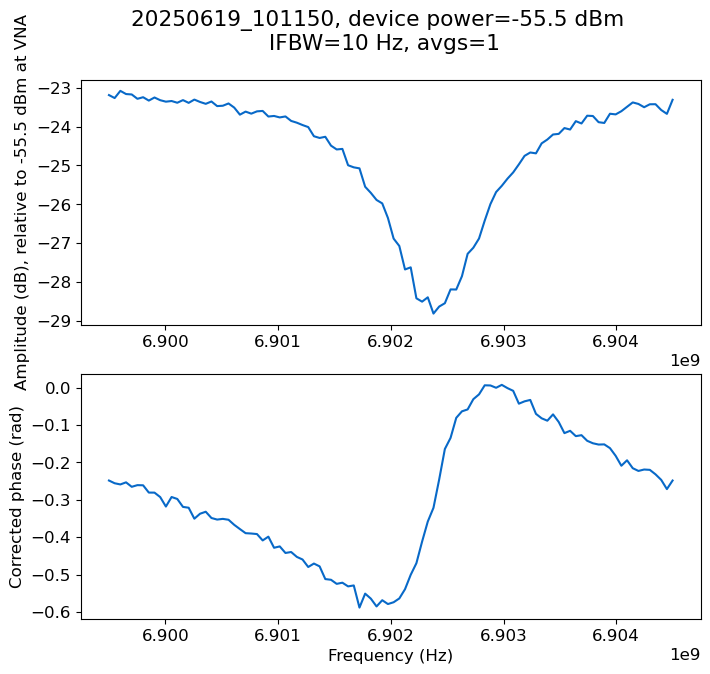

-55.0
Calculated line delay: -3.72370797265507e-07


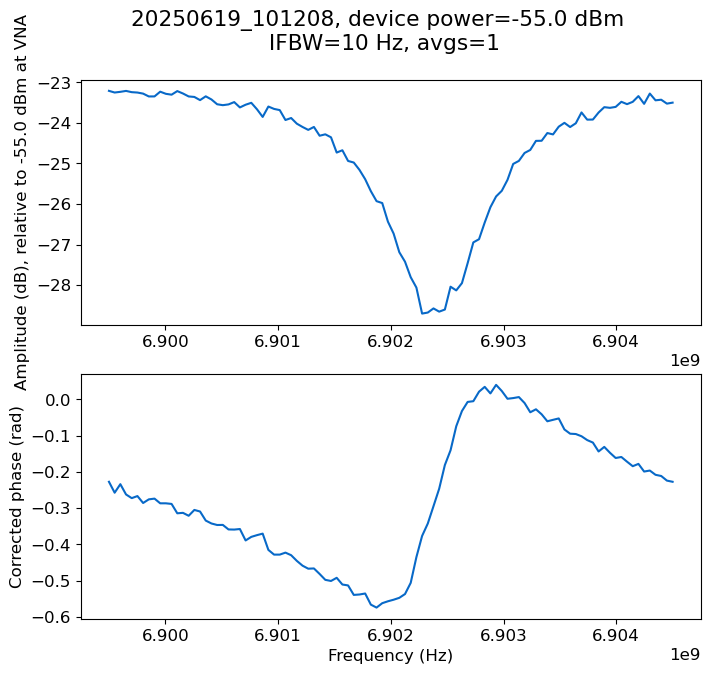

-54.5
Calculated line delay: -3.673767536637722e-07


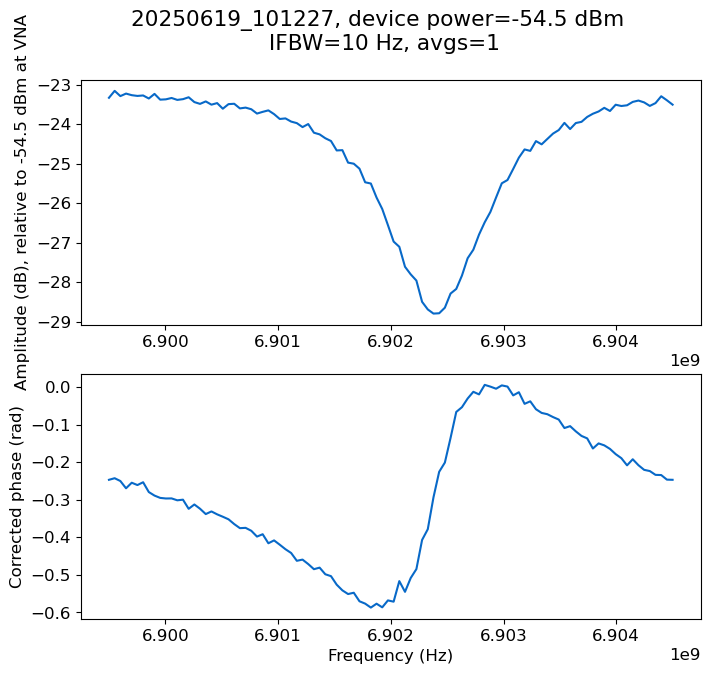

-54.0
Calculated line delay: -3.6763342935832386e-07


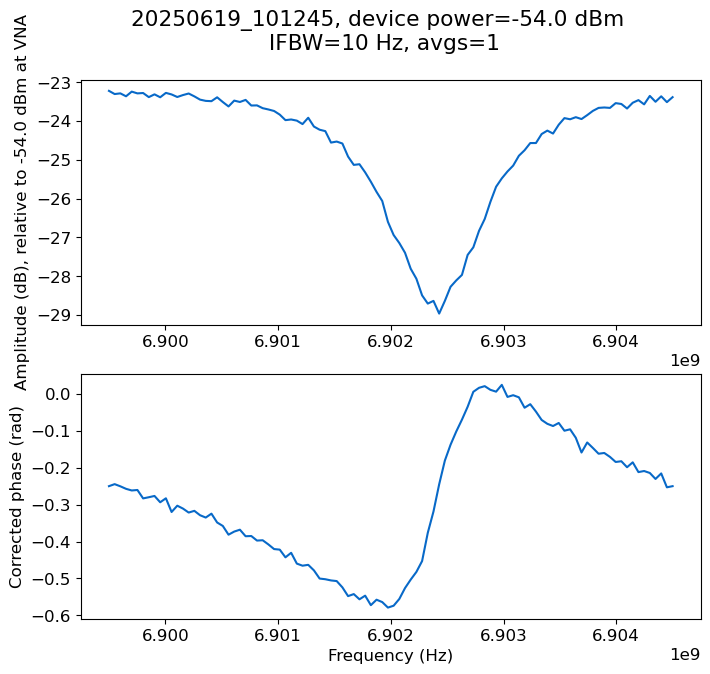

-53.5
Calculated line delay: -3.678754020828411e-07


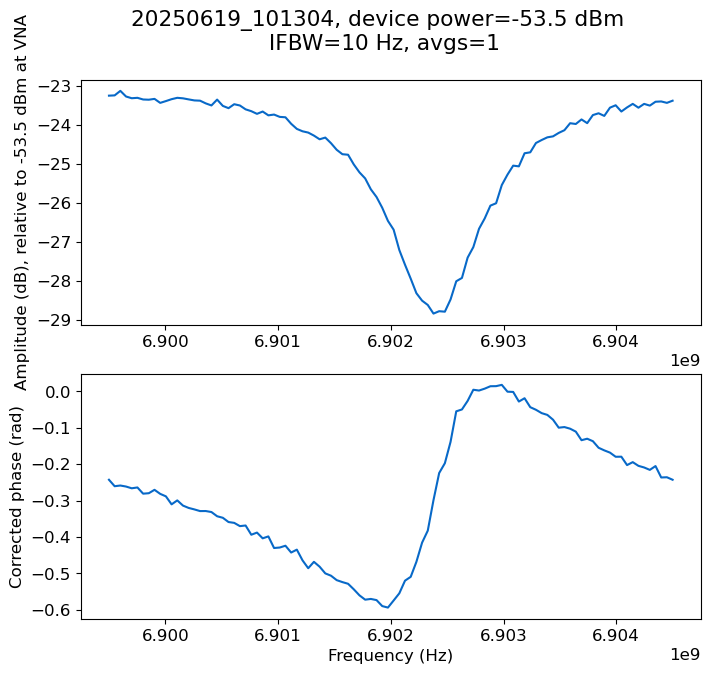

-53.0
Calculated line delay: -3.6905210765417287e-07


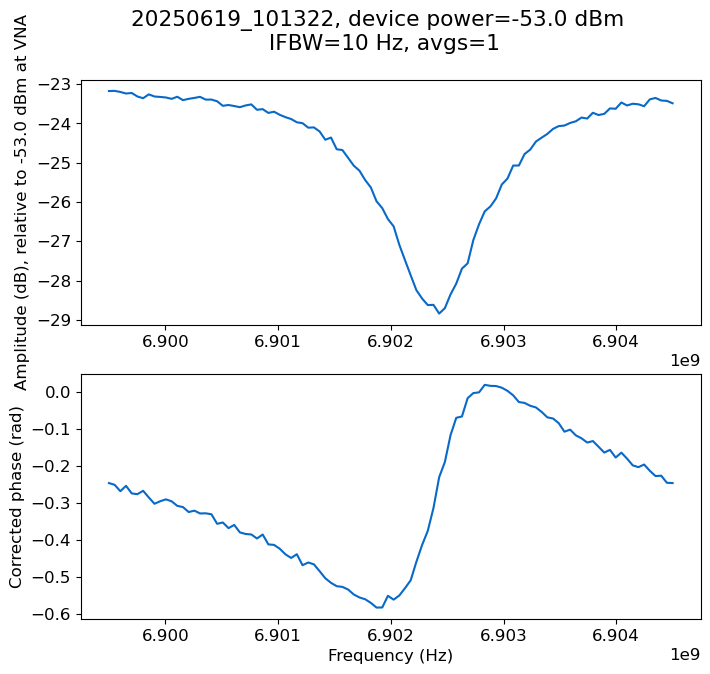

-52.5
Calculated line delay: -3.6703537111553617e-07


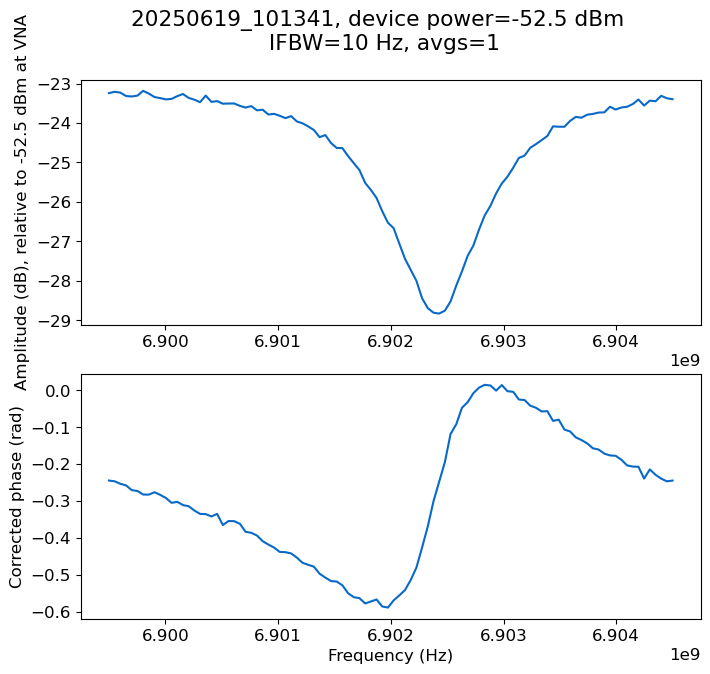

-52.0
Calculated line delay: -3.6326590196465904e-07


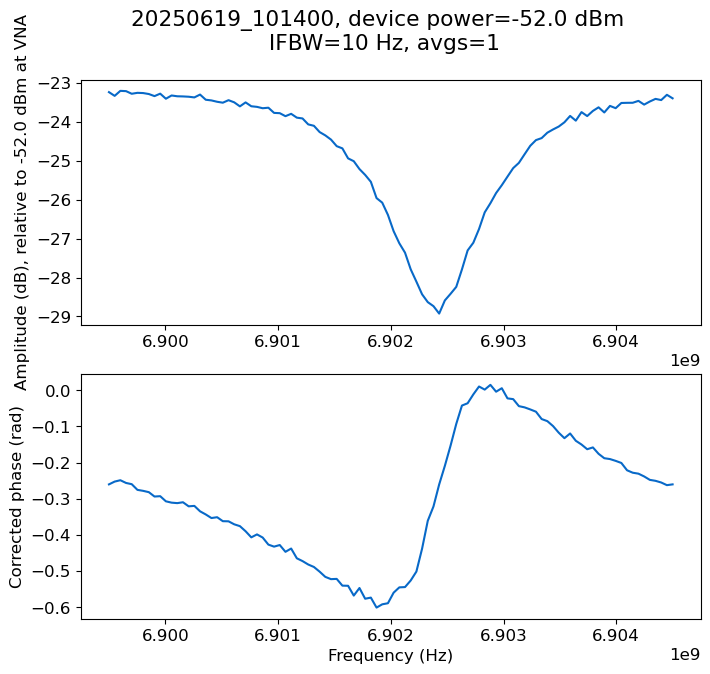

-51.5
Calculated line delay: -3.6731175064157734e-07


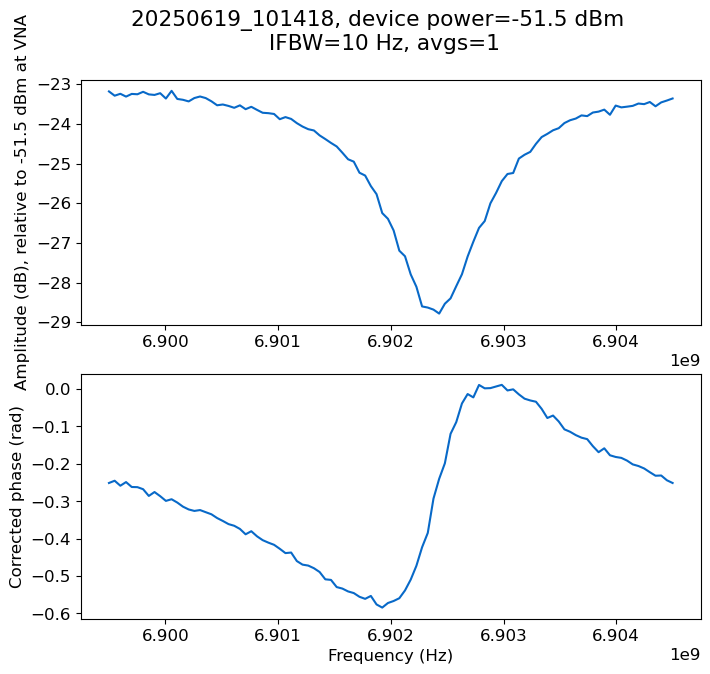

-51.0
Calculated line delay: -3.682711643884013e-07


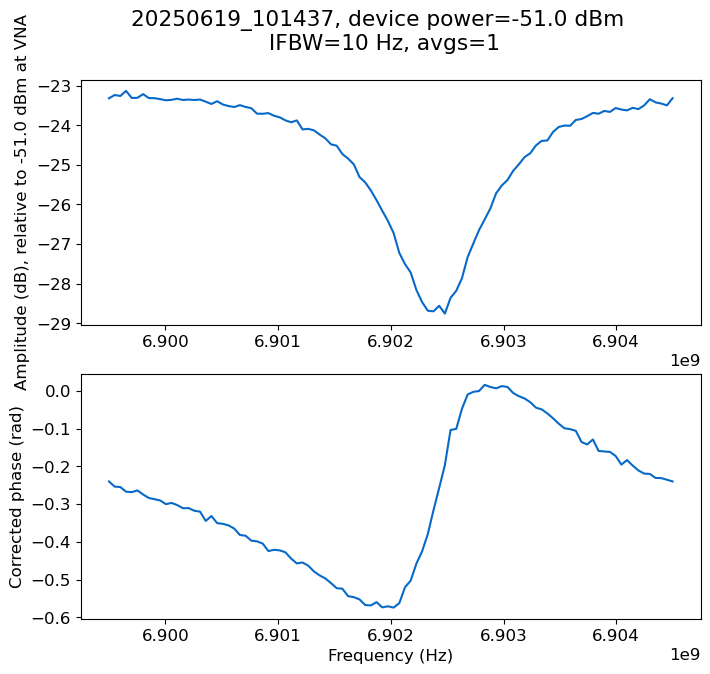

-50.5
Calculated line delay: -3.6952523404351946e-07


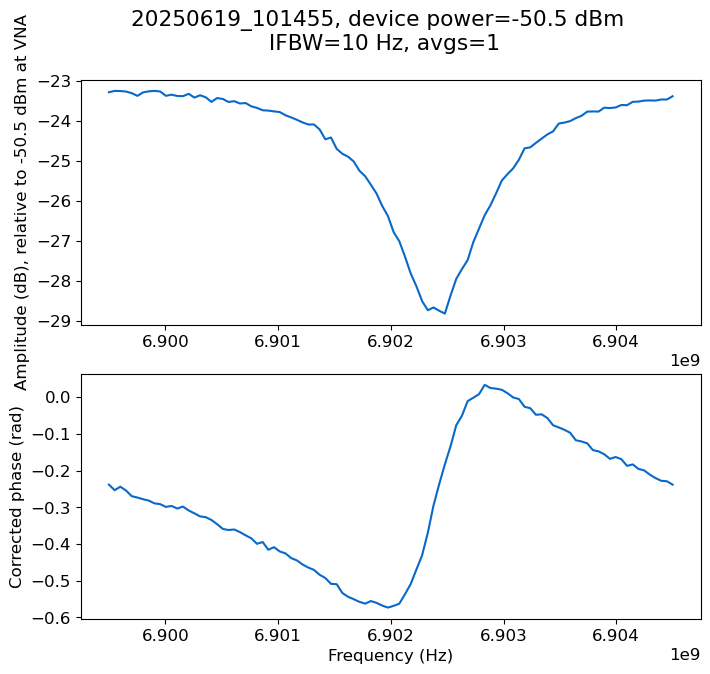

-50.0
Calculated line delay: -3.661304562646789e-07


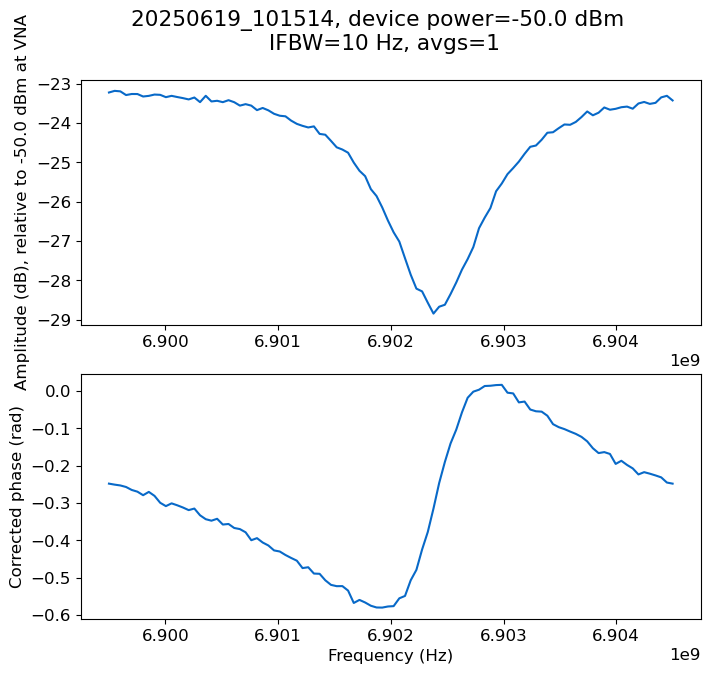

In [103]:
loop_data = []
npoints = 21 
power_vals = np.linspace(-60, -50, npoints)


freq_center = 6.902e9
fpoints=100
span = 5e6
expt_path = base_path
for p in power_vals: 
    print(p)
    scan_def = {'freq_center':freq_center, 
                'span':span,  
                'bandwidth':10, 
                'power':p, 
                'npoints':fpoints, 
                'averages':1}
    #file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
    file_name = 'buffer'
    data=vna_scan.do_vna_scan(VNA, file_name, expt_path, scan_def, 's21')
    loop_data.append(data)


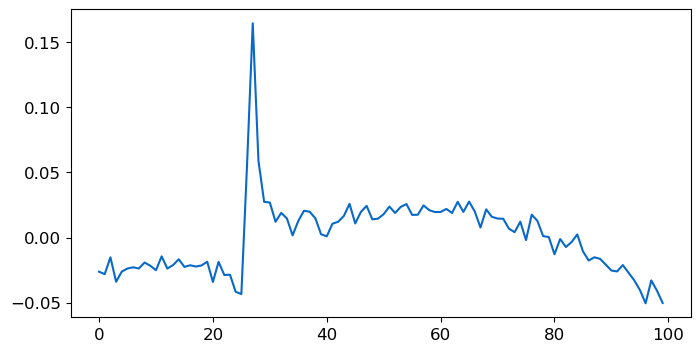

In [49]:
phase_data = np.unwrap(loop_data[0]['phases'])
poly = np.polyfit(loop_data[0]['freqs'],np.unwrap(loop_data[0]['phases']),1)
phase_data - np.polyval(poly,loop_data[0]['freqs'])

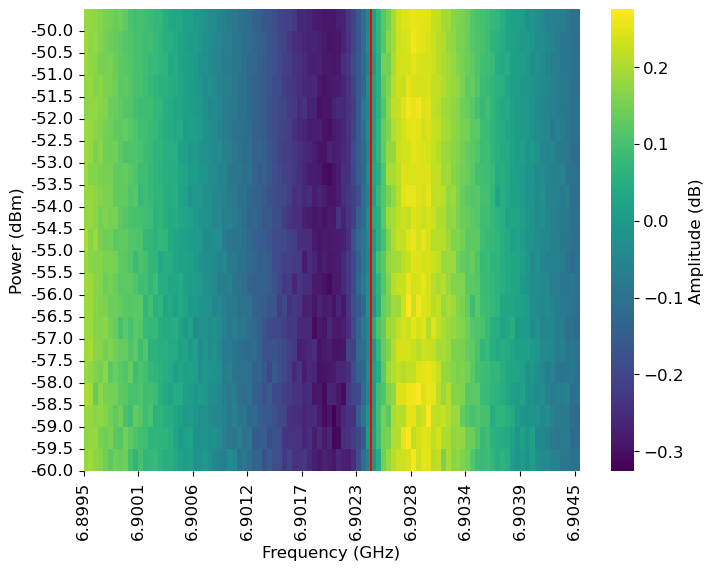

In [109]:
amps_2d = np.array([d['phases'] for d in loop_data])
# print(amps_2d.shape)

amps_2d = []
for d in loop_data:
    phase_data = np.unwrap(d['phases'])
    poly = np.polyfit(d['freqs'],np.unwrap(d['phases']),1)
    phase_data_corrected = phase_data - np.polyval(poly,d['freqs'])
    amps_2d.append(phase_data_corrected)

amps_2d = np.array(amps_2d)


freqs = np.linspace(freq_center-span/2, freq_center+span/2, fpoints)

plt.figure(figsize=(8, 6))

sns.heatmap(amps_2d, xticklabels=np.round(freqs/1e9, 4), yticklabels=np.round(power_vals, 1), cmap='viridis', cbar_kws={'label': 'Amplitude (dB)'})
plt.axvline(58,color='r')
plt.gca().invert_yaxis()
plt.xticks(ticks=np.linspace(0, len(freqs)-1, 10), labels=np.round(np.linspace(freqs[0]/1e9, freqs[-1]/1e9, 10), 4))
power_spacing = 1
plt.yticks(ticks=np.arange(len(power_vals)//power_spacing)*power_spacing, labels=np.round(power_vals[::power_spacing], 1))
plt.xlabel('Frequency (GHz)')
plt.ylabel('Power (dBm)')
plt.show()

In [93]:
waste_loop_data = loop_data

## Check resonances at one power

Calculated line delay: -4.1711520558816326e-07


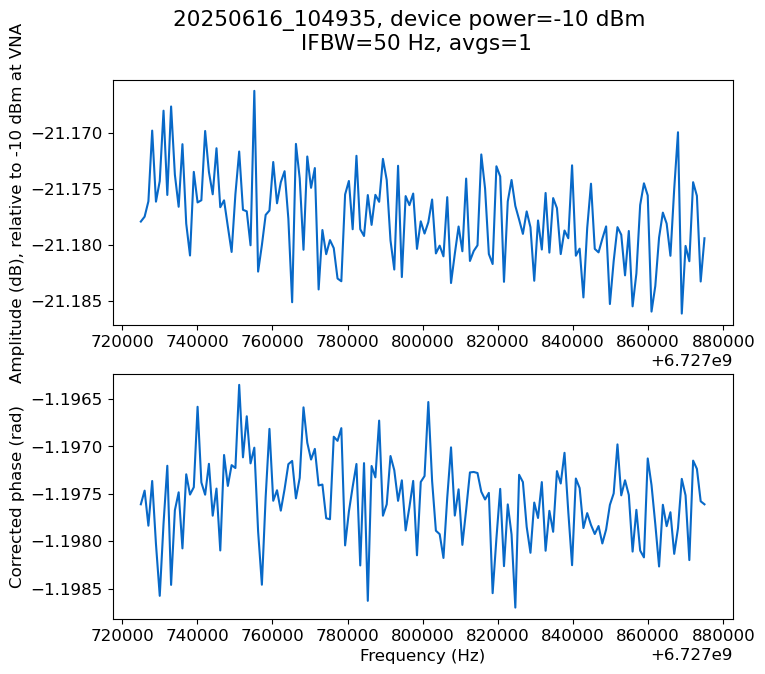

Calculated line delay: -4.1139408808953317e-07


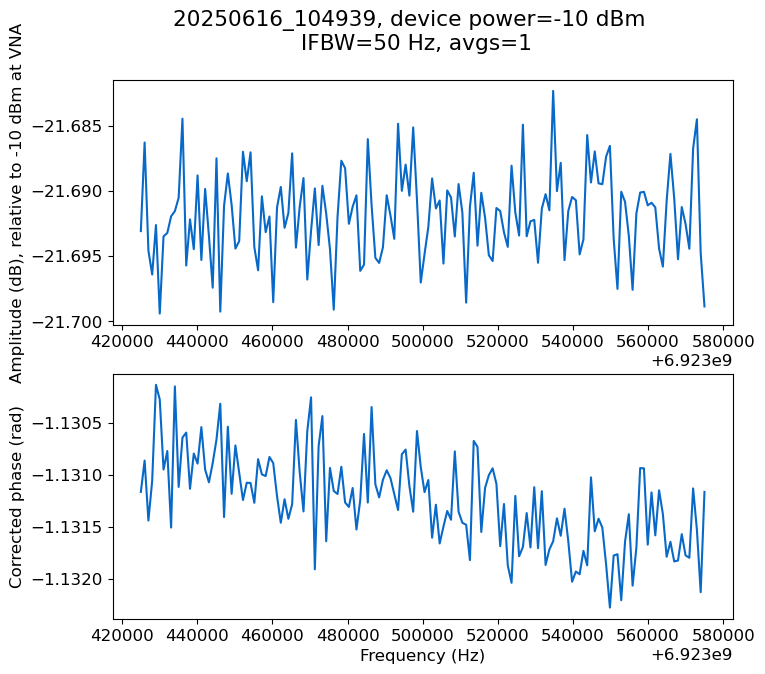

Calculated line delay: -4.1767648774778894e-07


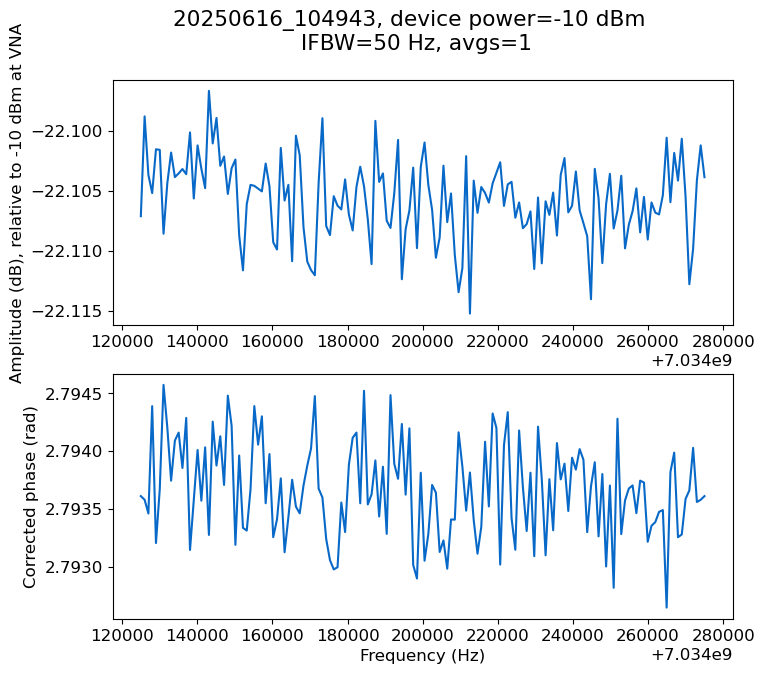

In [89]:
%matplotlib inline
expt_path = base_path
npoints = 150
span=0.15e6
power = -10

freqs = np.array([6.0175e+09, 6.3510e+09, 6.7120e+09, 7.0296e+09, 7.1744e+09, 7.5467e+09])
freqs =np.array([6.7278e+09, 6.9235e+09, 7.0342e+09])
bandwidth=50
avgs=1
for freq_center in freqs:     
    scan_def = {'freq_center':freq_center, 'span':span,  'bandwidth':bandwidth, 'power':power, 'npoints':npoints, 'averages':avgs}
    file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
    vna_scan.do_vna_scan(VNA, file_name, expt_path, scan_def, spar)

# Get the phase to correct with 

Calculated line delay: -8.263375470332096e-07


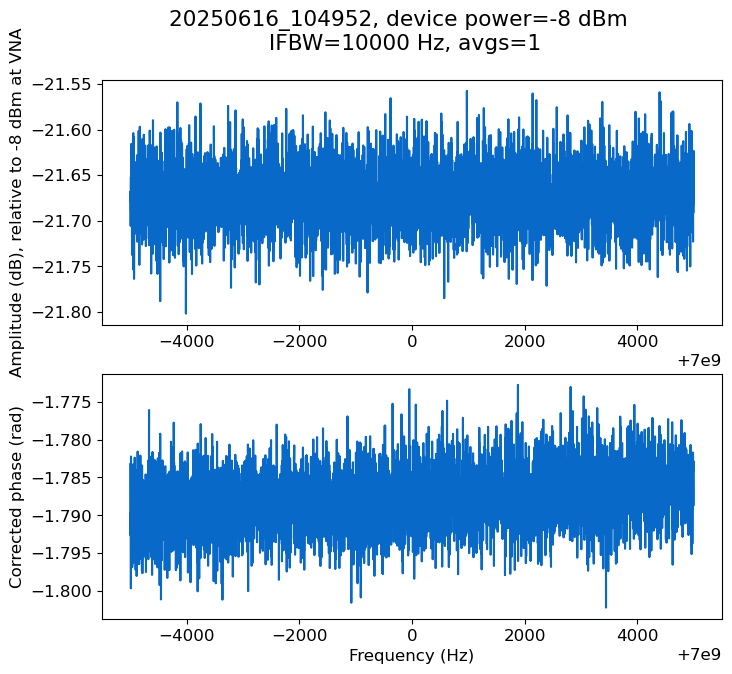

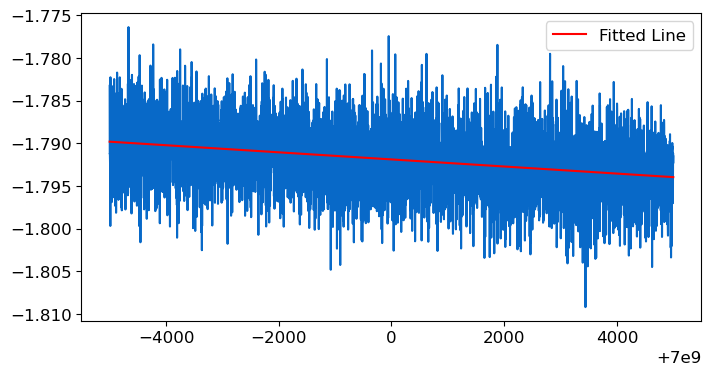

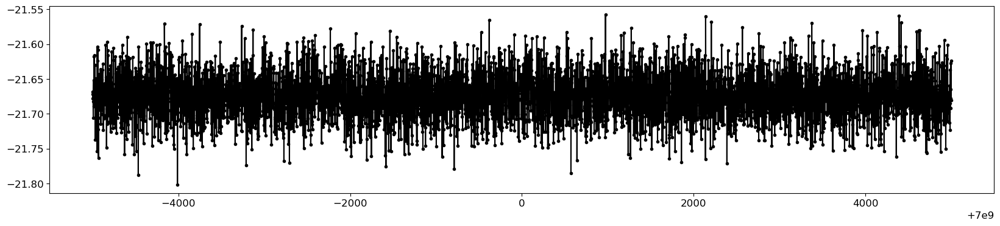

In [90]:
from scipy.stats import linregress

npoints = 5000
span=1e4
power = -8

bandwidth=10000
freq_center = 7e9
avgs=1    
scan_def = {'freq_center':freq_center, 'span':span,  'bandwidth':bandwidth, 'power':power, 'npoints':npoints, 'averages':avgs}
file_name = 'phase_check_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
data=vna_scan.do_vna_scan(VNA, file_name, base_path, scan_def, spar)

plt.figure()
plt.plot(data['freqs'], np.unwrap(data['phases']))

# Fit the data to a line
slope, intercept, r_value, p_value, std_err = linregress(data['freqs'], np.unwrap(data['phases']))

# Plot the fitted line
plt.plot(data['freqs'], slope * data['freqs'] + intercept, label='Fitted Line', color='red')
plt.legend()
plt.show()


plt.figure(figsize=(20, 4))
plt.plot(data['freqs'], data['amps'],'k.-')
#config.update_config(cfg_path, 'readout', qi, 'phase_const', slope)

In [92]:
slope

-4.1545782482711315e-07

In [64]:
spar='s43'

# Run all these cells to do power sweep

## Broad frequency scan looking for resonances 

In [30]:
expt_path = base_path
span=40e6
power = 0
avgs = 3
d=[]
bandwidth=5000
freq_min=5.6e9
freq_max = 8.2e9 
nscans = int(np.ceil((freq_max - freq_min)/span))
for i in range(nscans):
    freq_center = freq_min + i*span
    scan_def = {'freq_center':freq_center, 
                'span':span,  
                'bandwidth':bandwidth, 
                'power':power, 
                'npoints':7500, 
                'averages':avgs}
    file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
    d.append(vna_scan.do_vna_scan(VNA, file_name, expt_path, scan_def, spar, plot=False))

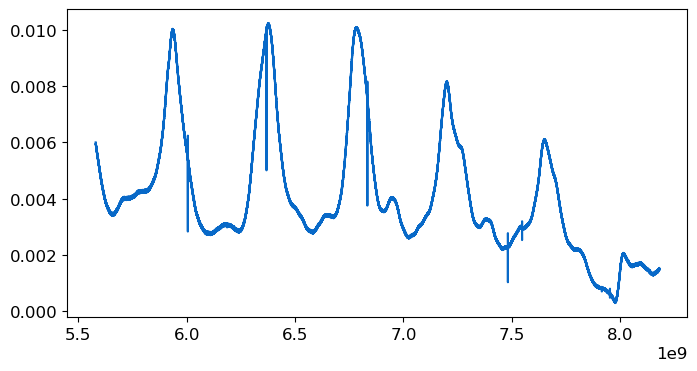

In [31]:
dd = helpers.concat_scans(d)
dd['amps'] = helpers.make_lin(dd['amps'])
plt.figure()
plt.plot(dd['freqs'],dd['amps'])

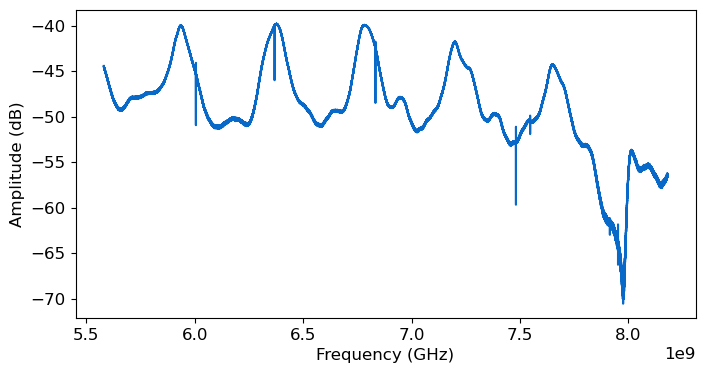

In [32]:
dd_db = helpers.concat_scans(d)
plt.figure()
plt.plot(dd_db['freqs'],dd_db['amps'])
plt.xlabel('Frequency (GHz)')
plt.ylabel('Amplitude (dB)')
plt.savefig(os.path.join(expt_path, 'amp_vs_freq_4.png'))

6


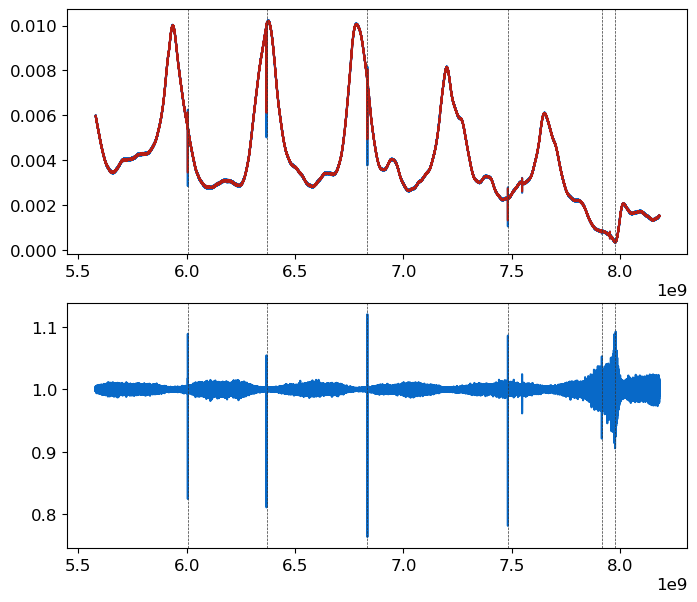

In [35]:
data = helpers.find_peaks(dd, 0.12)
print(len(data['coarse_peaks']))
res_list = data['coarse_peaks']


In [36]:
res_list

array([6.0052e+09, 6.3681e+09, 6.8334e+09, 7.4816e+09, 7.9149e+09,
       7.9759e+09])

In [ ]:
res_list = [6.0041e+09, 6.3699e+09, 6.8344e+09, 7.51e+09, 7.5420e+09, 7.9140e+09,7.9240e+09]

[6.0052e+09 6.3681e+09 6.8334e+09 7.4816e+09]


In [ ]:
[6.0052e+09, 6.3681e+09, 6.8334e+09, 7.4816e+09, 7.5471e+09, 7.9149e+09, 7.9771e+09]

In [28]:
res_list = data['coarse_peaks']
#res_list = data['coarse_peaks'][0:6]

In [ ]:

res_list = np.delete(res_list, 2)

In [29]:
res_list = np.append(res_list, 7.072e9)
res_list = np.append(res_list, 7.54e9)

## Medium width scan checking each resonance 
Saves the minimum value of transmission to res_freqs for narrower scan next. 

Calculated line delay: -4.1078583915876366e-07


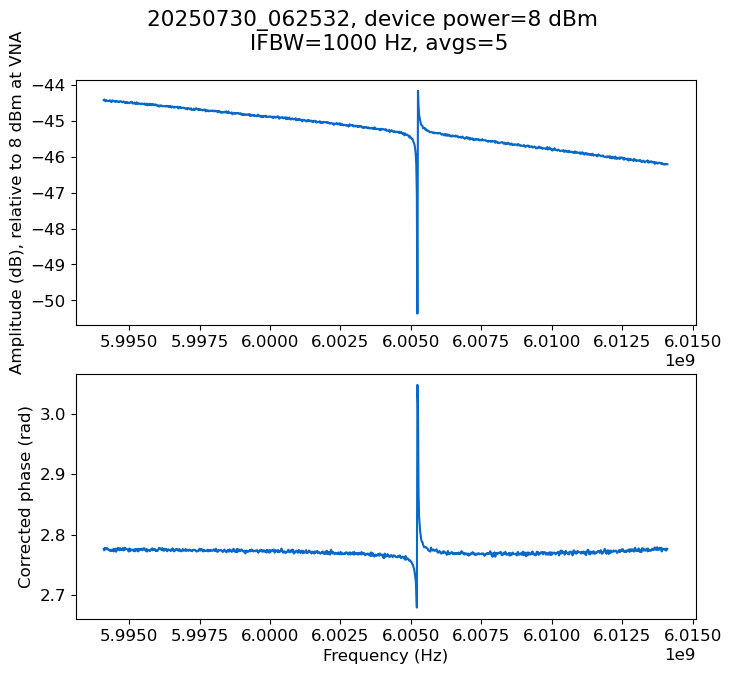

Calculated line delay: -4.242418629696998e-07


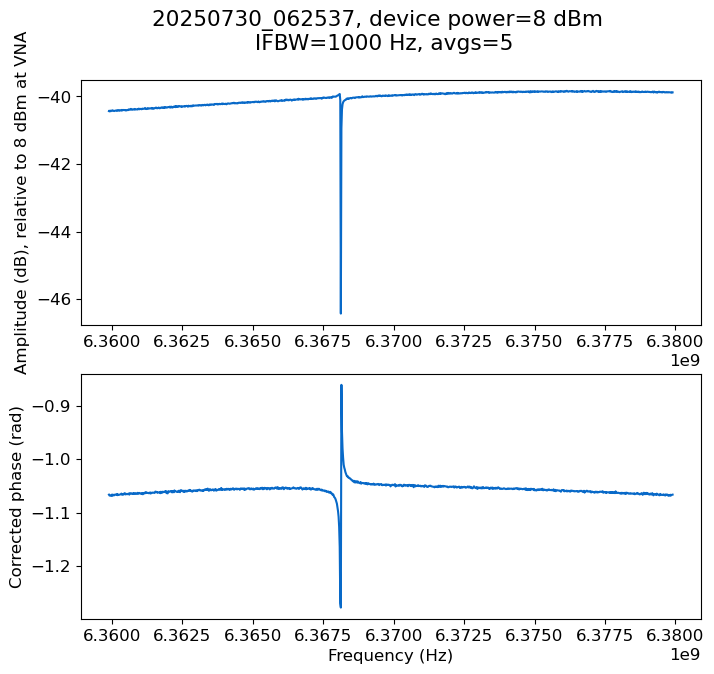

Calculated line delay: -4.176748245096739e-07


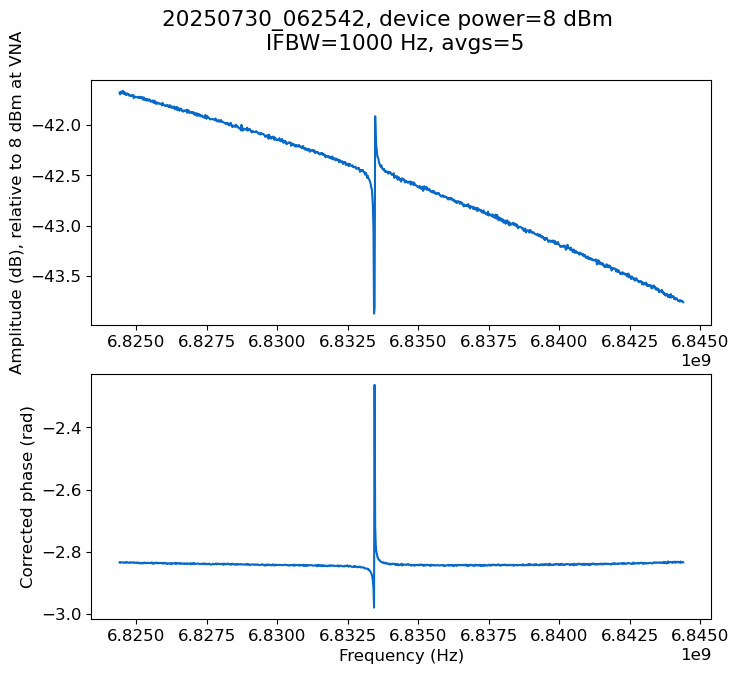

Calculated line delay: -4.0093652738107143e-07


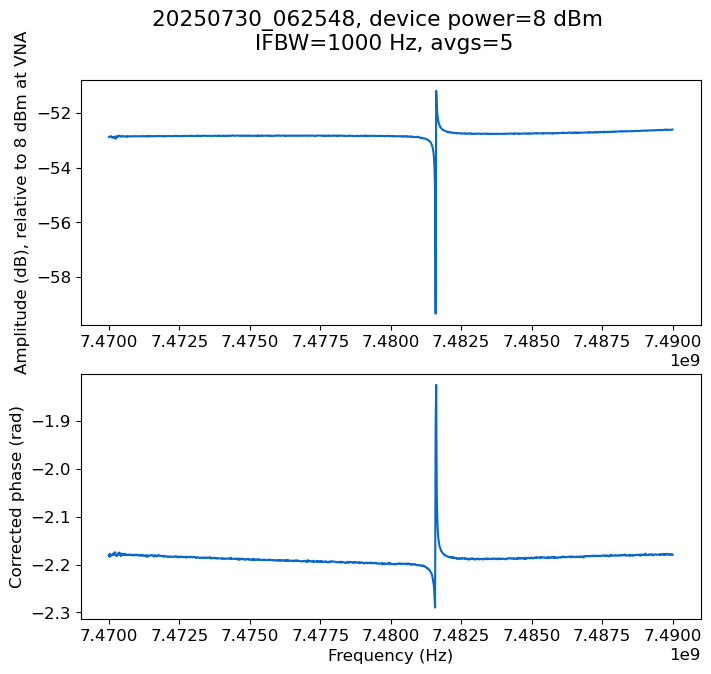

Calculated line delay: -4.0859001784645944e-07


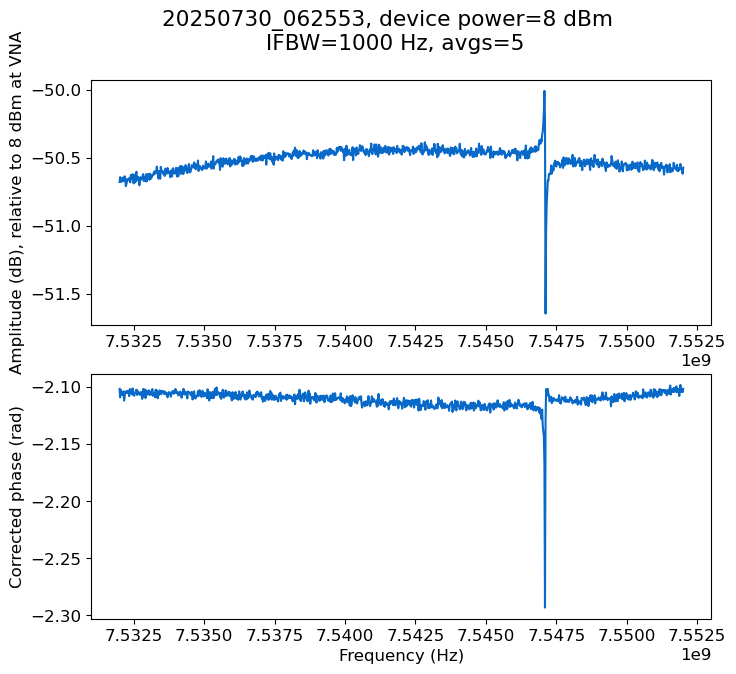

Calculated line delay: -4.0032612837765866e-07


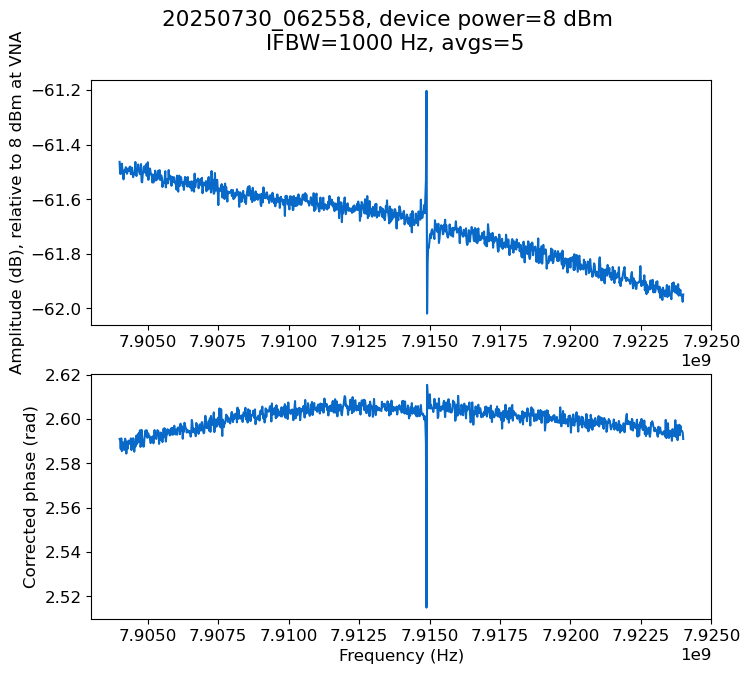

Calculated line delay: -4.026608509118485e-07


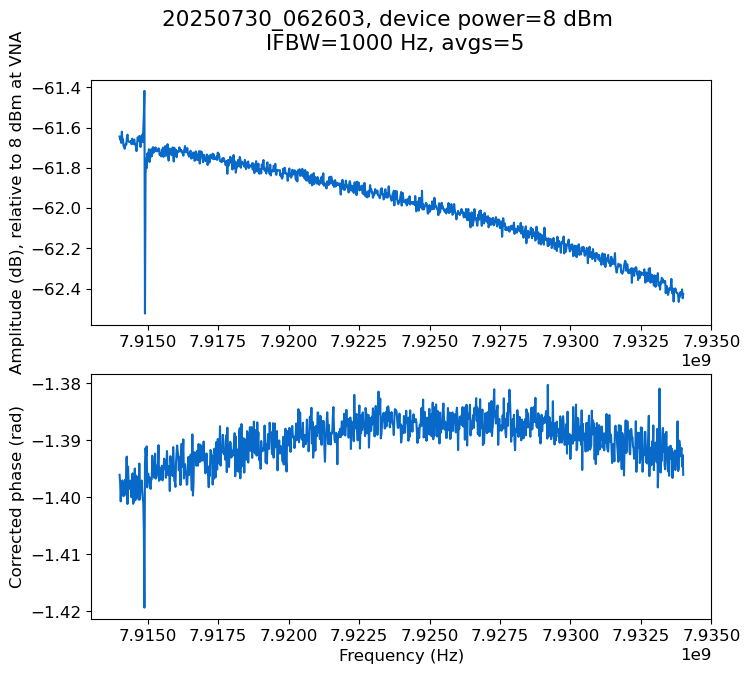

In [42]:
expt_path = base_path
span=20e6
res_freqs =[]
power=0
temp=0.01
#res_list = [6.0052e+09, 6.3681e+09, 6.8334e+09, 7.4816e+09, 7.5471e+09, 7.9149e+09]
res_list = [6.0041e+09, 6.3699e+09, 6.8344e+09, 7.48e+09, 7.5420e+09, 7.9140e+09,7.9240e+09]

#res_list = [6.0019e+09, 6.3237e+09, 6.6835e+09, 6.9680e+09, 7.0085e+09, 7.2388e+09,
# 7.6043e+09, 7.9797e+09]
for freq_center in res_list:
    scan_def = {'freq_center':freq_center, 'span':span,  'bandwidth':1000, 'power':8, 'npoints':1000, 'averages':5}
    file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm_' + str(temp) + 'K'
    data=vna_scan.do_vna_scan(VNA, file_name, expt_path, scan_def, spar)
    res_freqs.append(data['freqs'][np.argmin(data['amps'])])

In [43]:
res_freqs

[6005231131.131131,
 6368128228.228229,
 6833429029.029029,
 7481591591.591592,
 7547115115.115115,
 7914910910.910911,
 7914900900.900901]

In [43]:
res_freqs=[6004131546.5352,
 6369912992.736702,
 6834449597.617353,
 7509237578.023416,
 7541976976.976977,
 7914012205.965133,]

res_freqs=[
 7541976976.976977,
 7914012205.965133,]

## Narrower scan before power sweep

In [ ]:
freq_list =[]
import copy 
scan_def['span']=1e5
scan_def['power']=-10
for res in res_freqs:
    scan_def['freq_center'] = res
    file_name = 'res_' + str(scan_def['freq_center'])[:7] + '_' + str(power)[1:] + 'dbm'
    data=vna_scan.do_vna_scan(VNA, file_name, expt_path, scan_def, spar)
    freq_list.append(data['freqs'][np.argmin(data['amps'])])
res_freqs=copy.deepcopy(freq_list)

In [103]:
res_list=res_list[0:-1]
print(res_list)

[6.0019e+09 6.3237e+09 6.6835e+09 6.9680e+09 7.0085e+09 7.2388e+09
 7.6043e+09 7.9797e+09]


In [41]:
res_list

array([6.0041e+09, 6.3699e+09, 6.8344e+09, 7.4832e+09, 7.5092e+09,
       7.7384e+09, 7.9140e+09, 7.0720e+09, 7.5400e+09])

In [91]:
res_freqs[-1:]

[7914905005.005005]

# Power sweep

Comment saved to C:/_Data/Resonators/20250728-ResSilTa-Aggron-Slab\power_sweep_20250730_063547\comment.txt


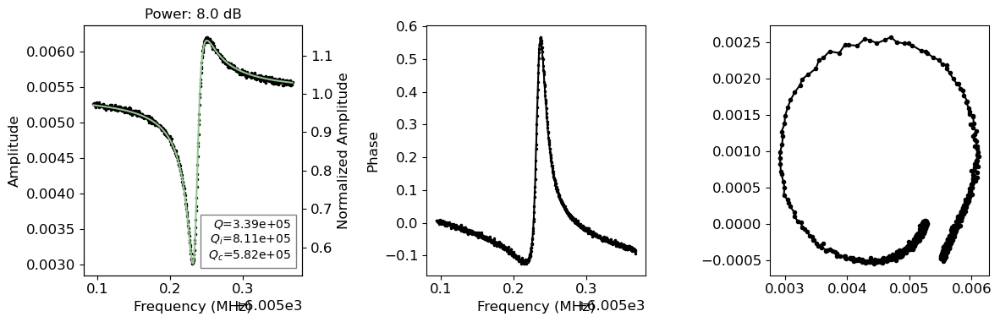

6005236871.706107
Time elapsed: 0.42 min, expected time: 0.20 min


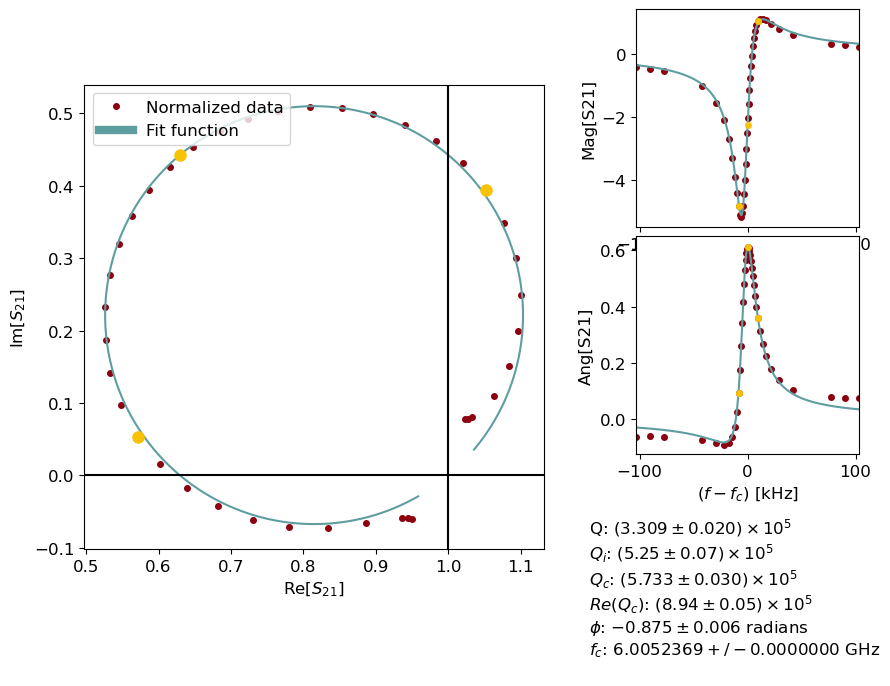

Saved fit results for frequency 6005.237000 MHz, power 8 dBm to CSV
Averaging factor: 0.000
Pin -52.0, N photons: 1.59e+10, navg: 0
Next time: 0.00 min, q_adj: 0.900
6005231012.829406
Time elapsed: 0.42 min, expected time: 0.20 min


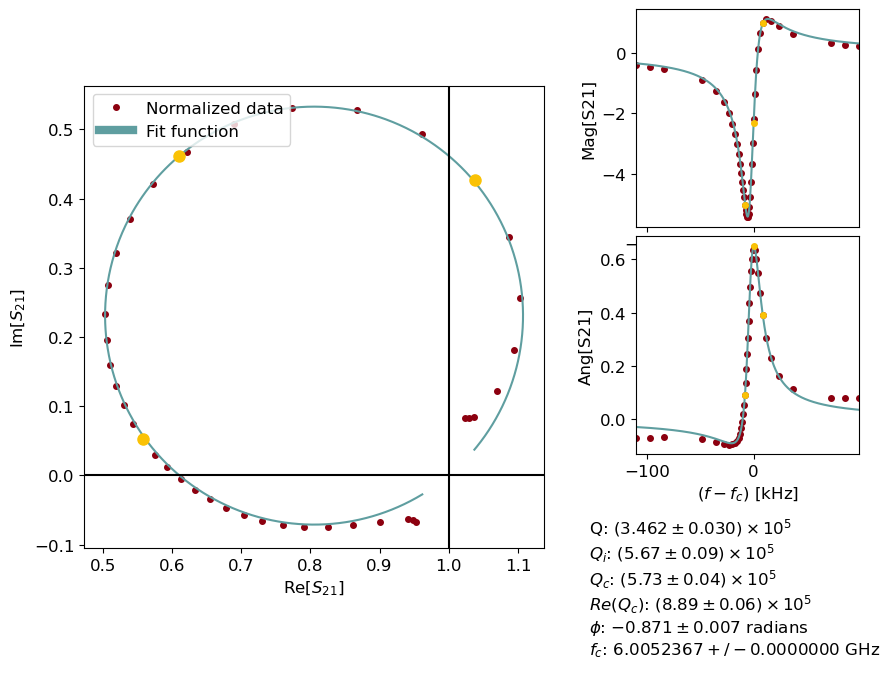

Saved fit results for frequency 6005.237000 MHz, power 4 dBm to CSV
Averaging factor: 0.000
Pin -56.0, N photons: 6.93e+09, navg: 0
Next time: 0.00 min, q_adj: 1.046
6005231356.380839
Time elapsed: 0.42 min, expected time: 0.20 min


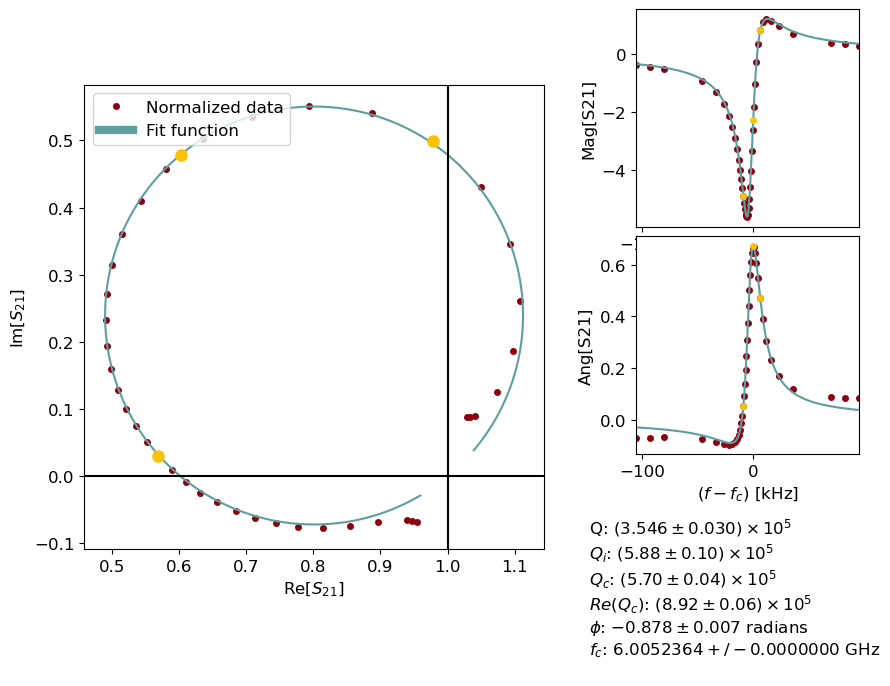

Saved fit results for frequency 6005.237000 MHz, power 0 dBm to CSV
Averaging factor: 0.000
Pin -60.0, N photons: 2.91e+09, navg: 0
Next time: 0.00 min, q_adj: 1.024
6005231027.748342
Time elapsed: 0.42 min, expected time: 0.20 min


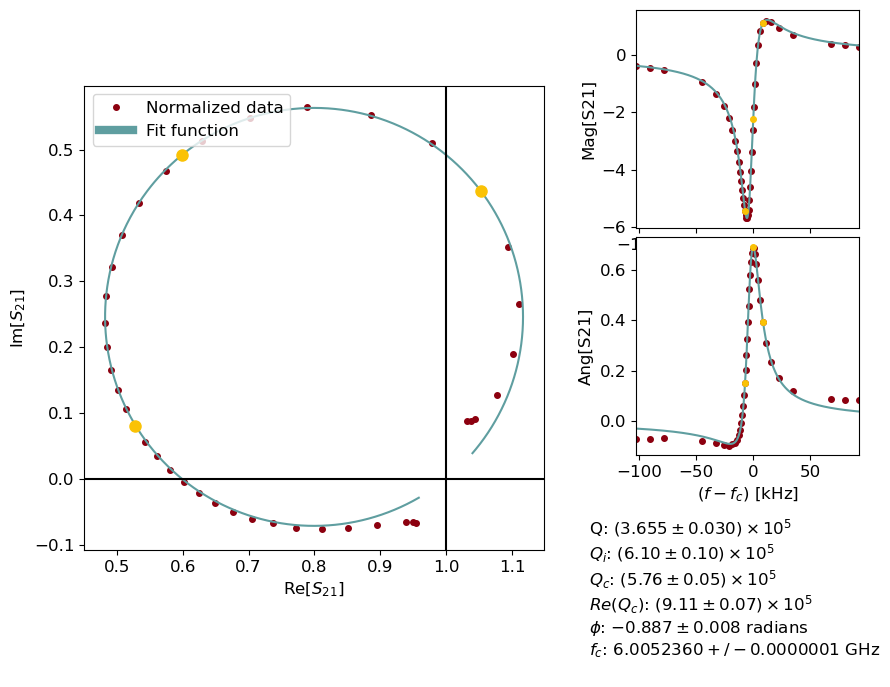

Saved fit results for frequency 6005.236000 MHz, power -4 dBm to CSV
Averaging factor: 0.000
Pin -64.0, N photons: 1.22e+09, navg: 0
Next time: 0.00 min, q_adj: 1.031
6005230707.529654
Time elapsed: 0.42 min, expected time: 0.20 min


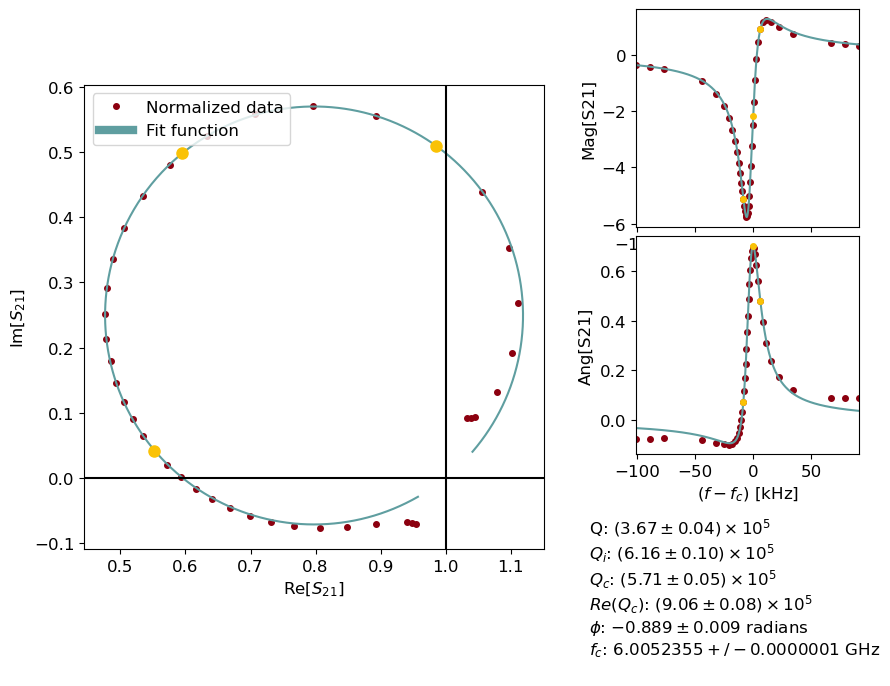

Saved fit results for frequency 6005.236000 MHz, power -8 dBm to CSV
Averaging factor: 0.000
Pin -68.0, N photons: 4.93e+08, navg: 0
Next time: 0.00 min, q_adj: 1.004
6005229759.392792
Time elapsed: 0.27 min, expected time: 0.12 min


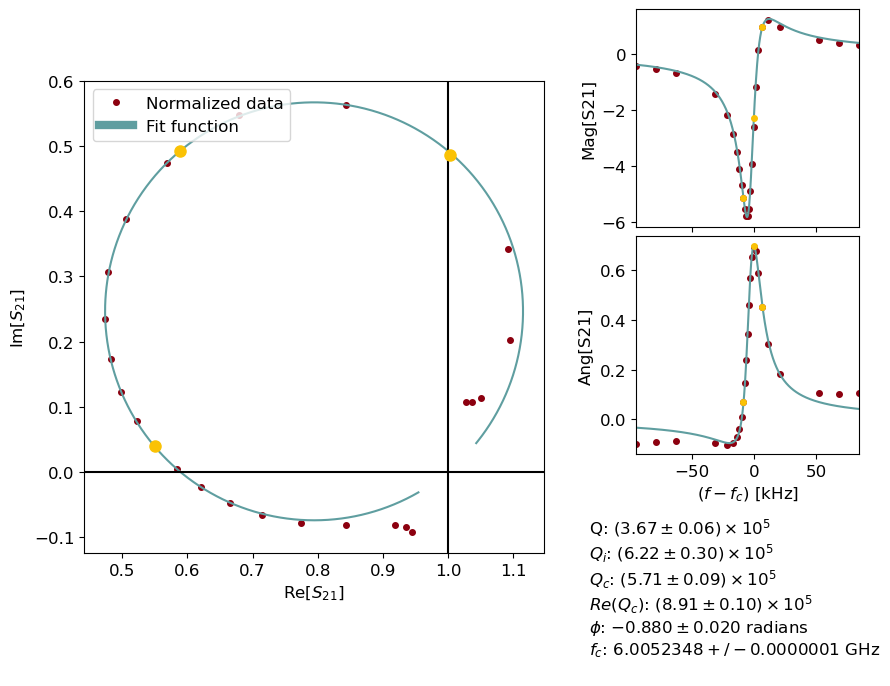

Saved fit results for frequency 6005.235000 MHz, power -12 dBm to CSV
Averaging factor: 0.000
Pin -72.0, N photons: 1.96e+08, navg: 0
Next time: 0.00 min, q_adj: 0.999
6005229759.392792
Time elapsed: 0.27 min, expected time: 0.12 min


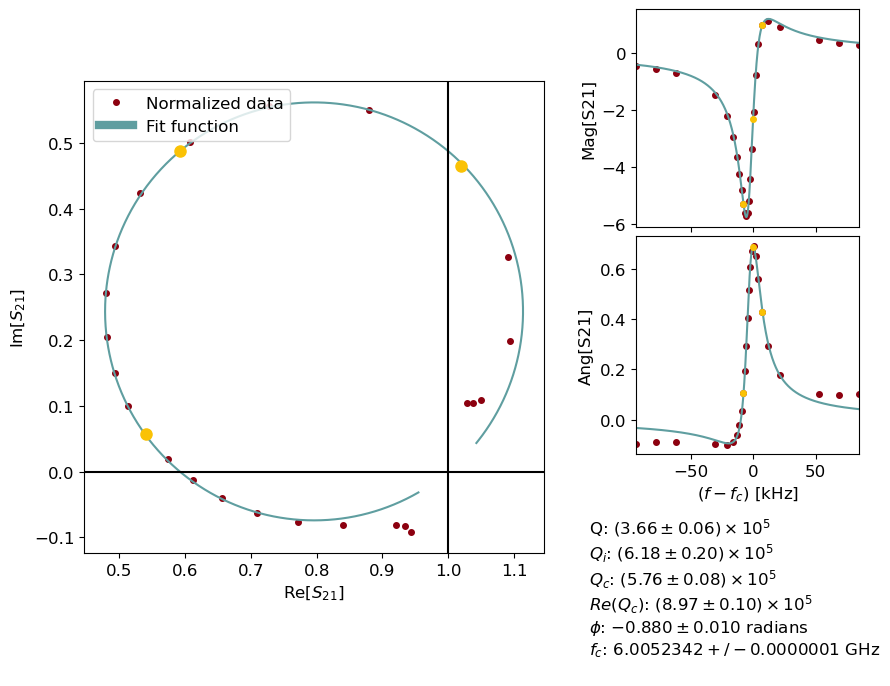

Saved fit results for frequency 6005.234000 MHz, power -16 dBm to CSV
Fit parameters: [661031.5953 598461.9478      0.          0.4025]
Averaging factor: 0.001
Pin -76.0, N photons: 7.71e+07, navg: 0
Next time: 0.00 min, q_adj: 0.999
6005228686.435162
Time elapsed: 0.26 min, expected time: 0.12 min


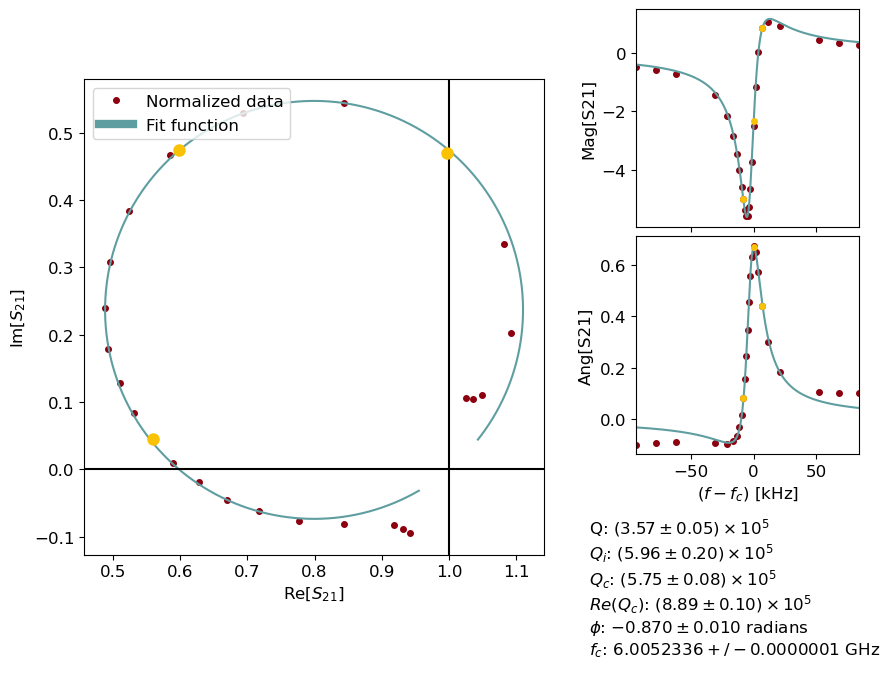

Saved fit results for frequency 6005.234000 MHz, power -20 dBm to CSV
Fit parameters: [664982.9027 597943.3622      0.          0.4091]
Averaging factor: 0.003
Pin -80.0, N photons: 2.93e+07, navg: 0
Next time: 0.00 min, q_adj: 0.975
6005228686.435162
Time elapsed: 0.26 min, expected time: 0.12 min
Qi err: 0.011100127920424394


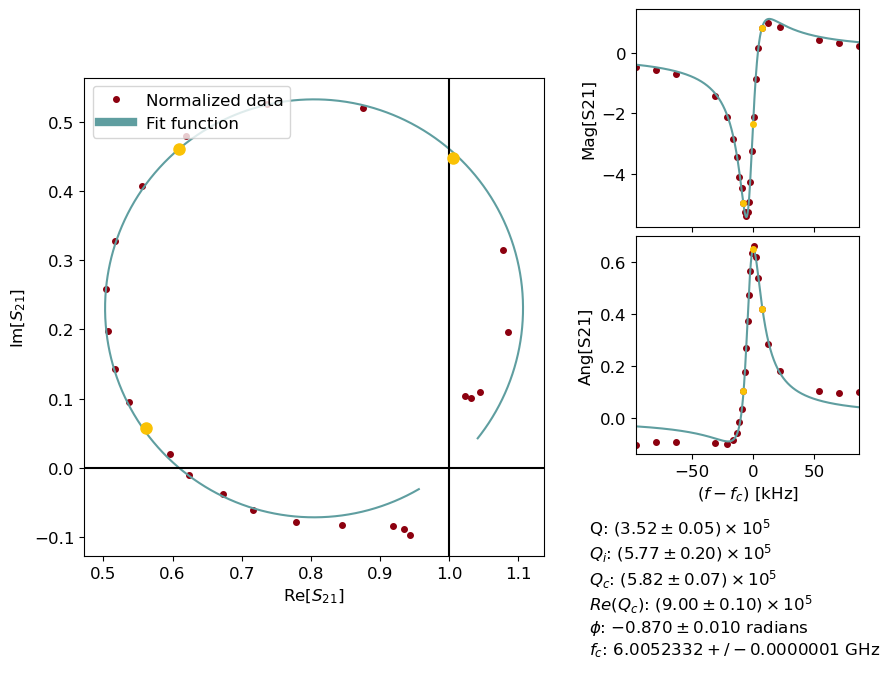

Saved fit results for frequency 6005.233000 MHz, power -24 dBm to CSV
Fit parameters: [667204.662  594190.8493      0.          0.4142]
Averaging factor: 0.007
Pin -84.0, N photons: 1.12e+07, navg: 0
Next time: 0.00 min, q_adj: 0.986
6005227593.160553
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.01383796522274052


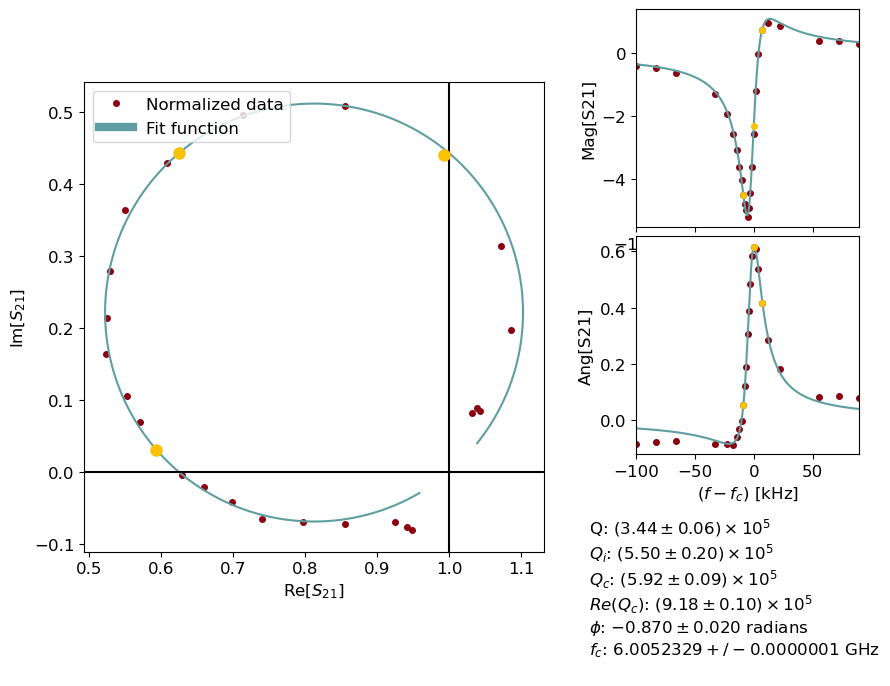

Saved fit results for frequency 6005.233000 MHz, power -28 dBm to CSV
Fit parameters: [     0.0294 592814.8339     44.49        3.3817]
Averaging factor: 0.019
Pin -88.0, N photons: 4.18e+06, navg: 1
Next time: 0.00 min, q_adj: 0.978
6005227593.160553
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.016295193592103793


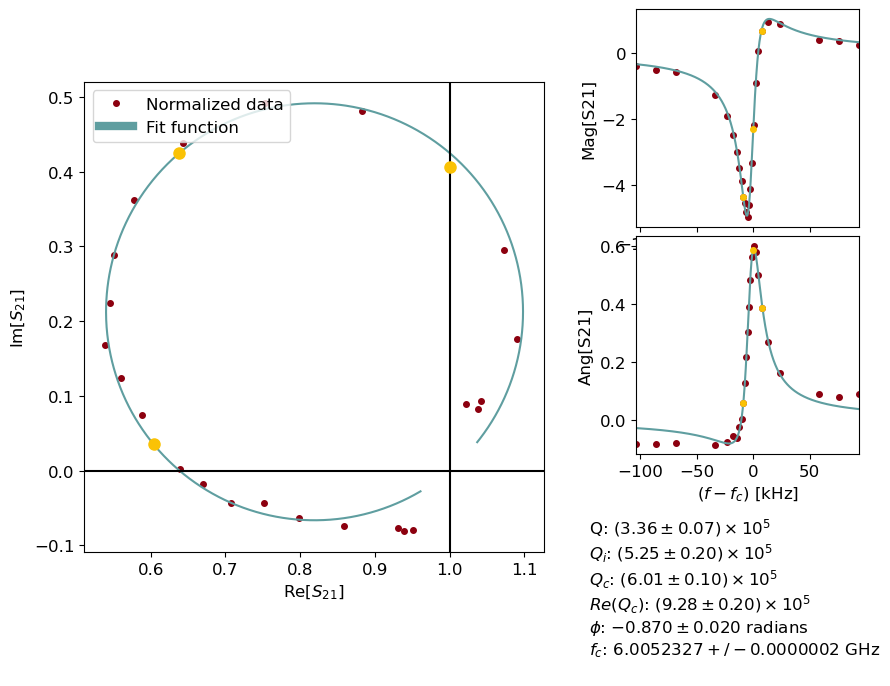

Saved fit results for frequency 6005.233000 MHz, power -32 dBm to CSV
Fit parameters: [   127.1103 592645.5451     40.1093      1.9746]
Averaging factor: 0.051
Pin -92.0, N photons: 1.56e+06, navg: 3
Next time: 0.01 min, q_adj: 0.976
6005227593.160553
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.020622110175113263


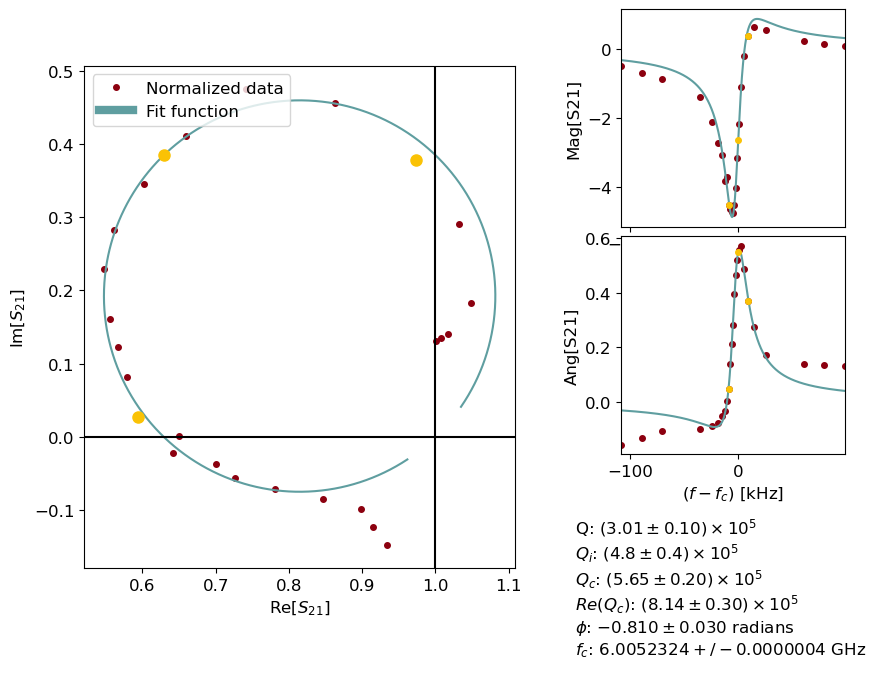

Saved fit results for frequency 6005.233000 MHz, power -36 dBm to CSV
Fit parameters: [  2316.2223 592996.0086     56.6055      1.514 ]
Averaging factor: 0.144
Pin -96.0, N photons: 5.35e+05, navg: 9
Next time: 0.04 min, q_adj: 0.899
6005227593.160553
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.02666792220676038


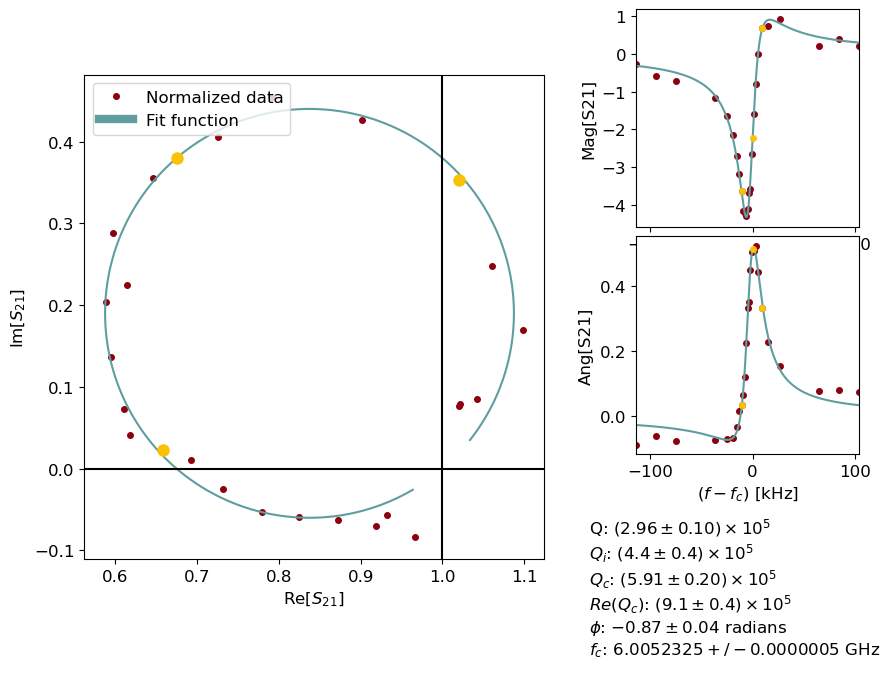

Saved fit results for frequency 6005.233000 MHz, power -40 dBm to CSV
Fit parameters: [1571306.0056  592993.1073  476128.5334       1.7743]
Averaging factor: 0.406
Pin -100.0, N photons: 1.95e+05, navg: 21
Next time: 0.09 min, q_adj: 0.981
6005226289.714267
Time elapsed: 0.26 min, expected time: 0.12 min
Qi err: 0.04993884831635464


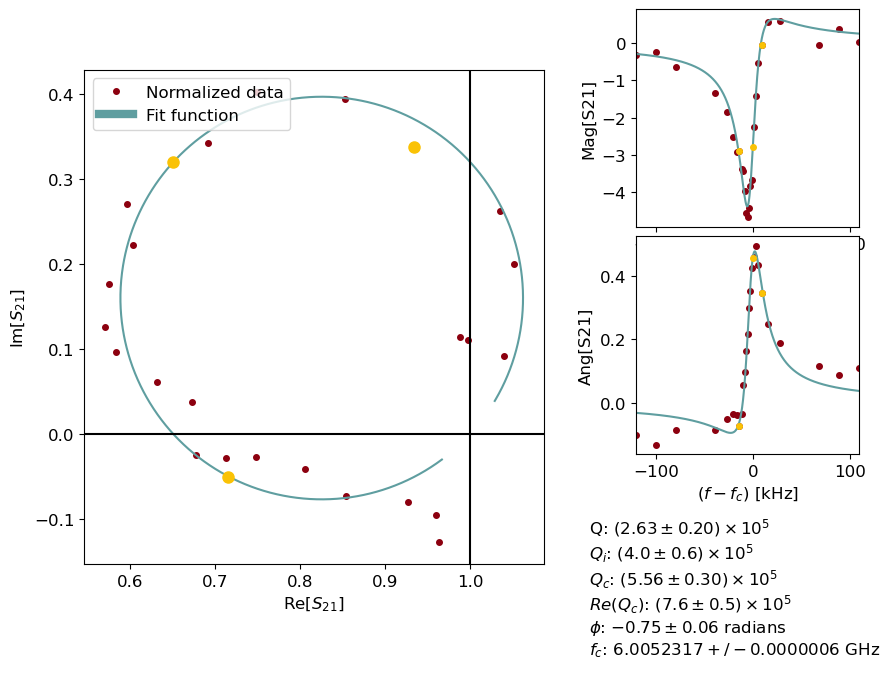

Saved fit results for frequency 6005.233000 MHz, power -44 dBm to CSV
Fit parameters: [1257537.9487  593312.8254  275325.3409       1.5641]
Averaging factor: 1.079
Pin -104.0, N photons: 6.56e+04, navg: 68
Next time: 0.28 min, q_adj: 0.891
6005226289.714267
Time elapsed: 0.41 min, expected time: 0.28 min
Qi err: 0.05162236496781045


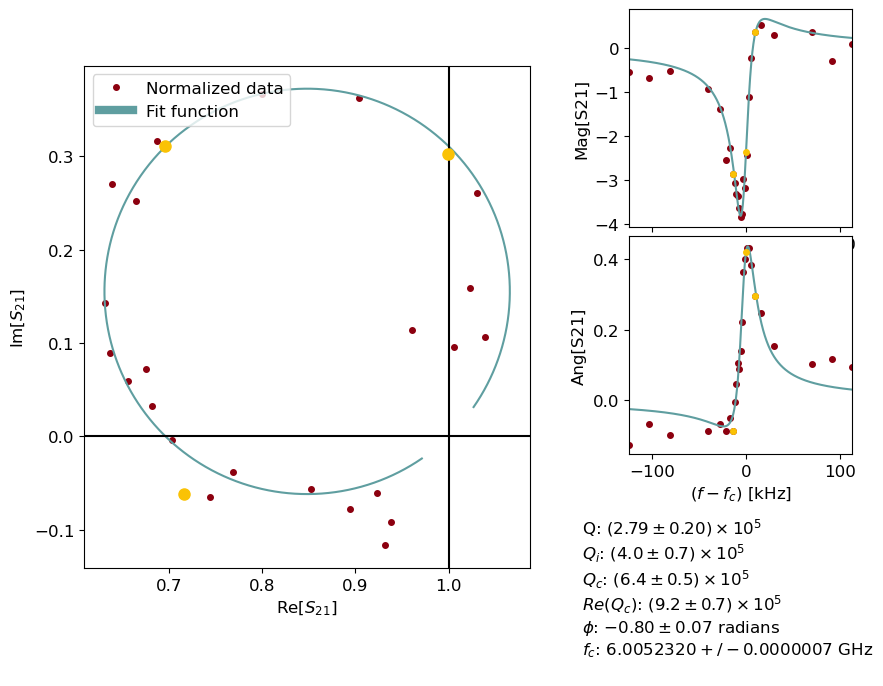

Saved fit results for frequency 6005.233000 MHz, power -48 dBm to CSV
Fit parameters: [1237284.6613  593360.1757  263130.4881       1.5466]
Averaging factor: 3.347
Pin -108.0, N photons: 2.54e+04, navg: 149
Next time: 0.62 min, q_adj: 1.061
6005226289.714267
Time elapsed: 0.73 min, expected time: 0.62 min
Qi err: 0.0551887400728253


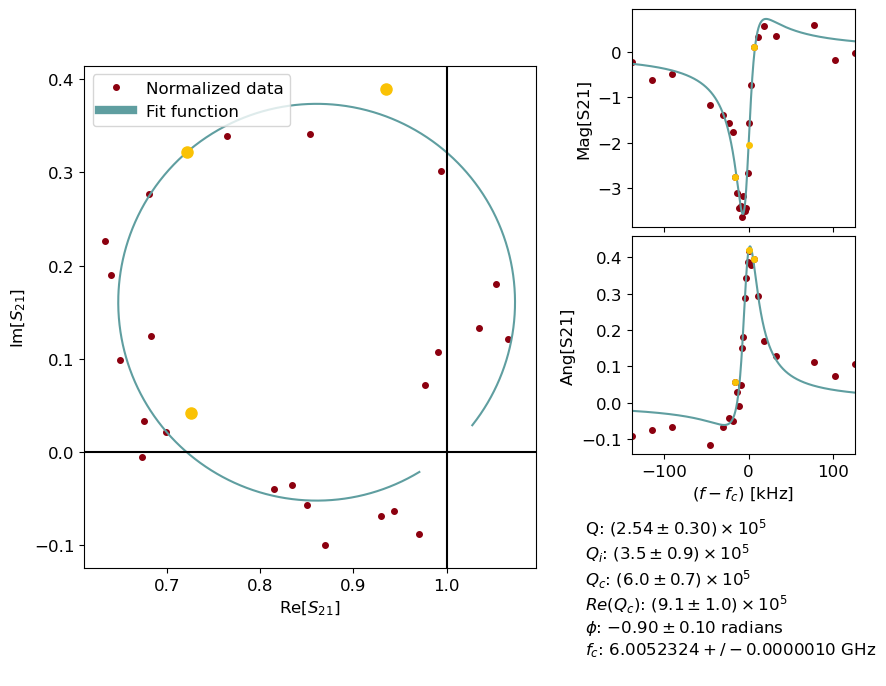

Saved fit results for frequency 6005.233000 MHz, power -52 dBm to CSV
Fit parameters: [1011993.0916  594469.2963  134783.9446       1.2979]
Averaging factor: 8.633
Pin -112.0, N photons: 9.02e+03, navg: 521
Next time: 2.17 min, q_adj: 0.910
6005224709.293414
Time elapsed: 2.17 min, expected time: 2.17 min
Qi err: 0.053502472579392966


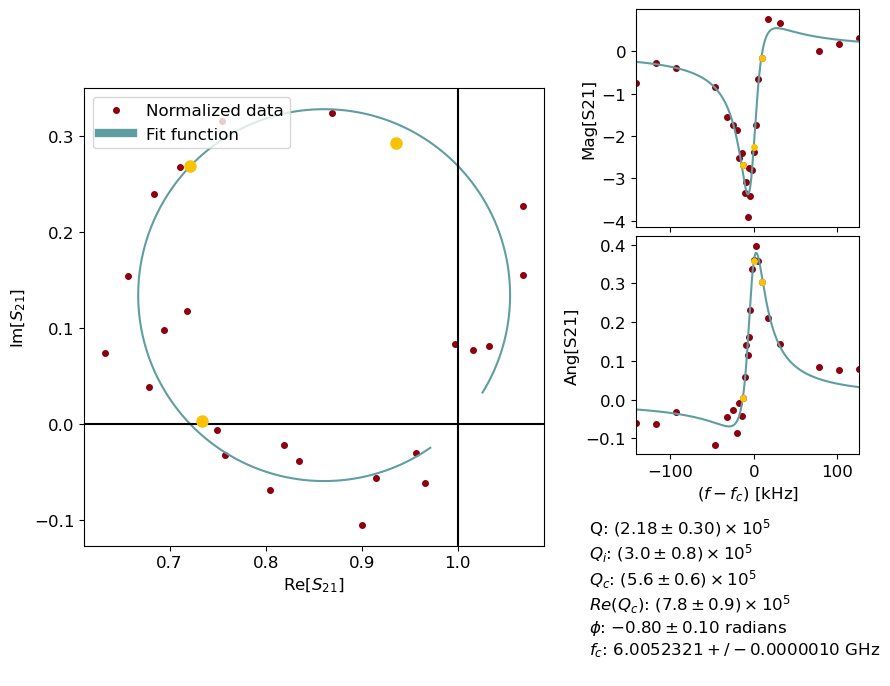

Saved fit results for frequency 6005.234000 MHz, power -56 dBm to CSV
Fit parameters: [662619.7662 597825.9176  22018.784       0.9211]
Averaging factor: 25.649
Pin -116.0, N photons: 2.8e+03, navg: 1745
Next time: 7.27 min, q_adj: 0.857
6005224709.293414
Time elapsed: 6.92 min, expected time: 7.27 min
Qi err: 0.033001093337644144


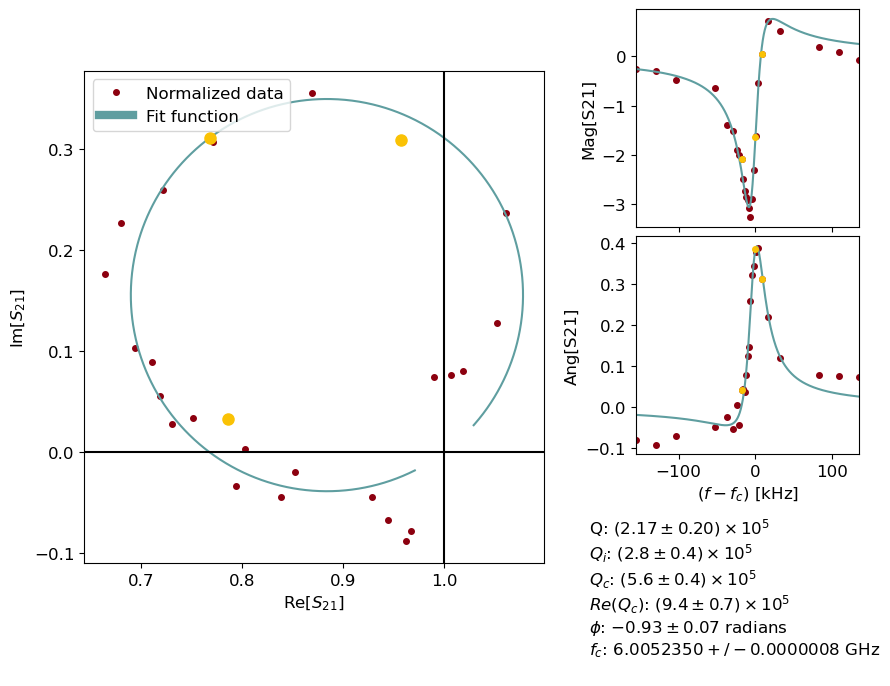

Saved fit results for frequency 6005.235000 MHz, power -60 dBm to CSV
Fit parameters: [532211.7101 599332.1816   8465.3507      0.8257]
Averaging factor: 70.708
Pin -120.0, N photons: 1.11e+03, navg: 3553
Next time: 14.80 min, q_adj: 0.997


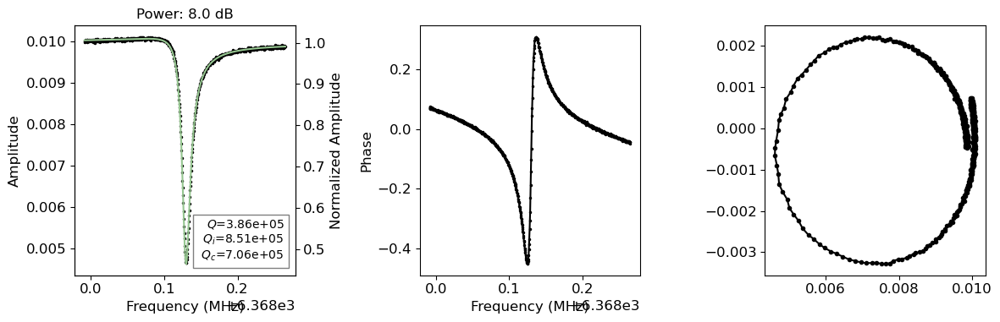

6368128598.7109375
Time elapsed: 0.42 min, expected time: 0.20 min


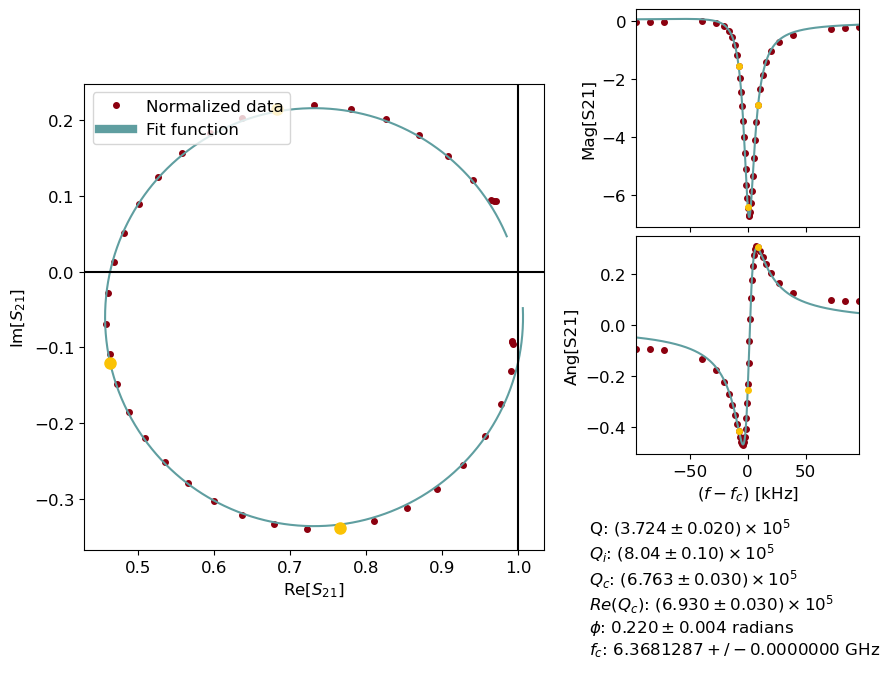

Saved fit results for frequency 6368.129000 MHz, power 8 dBm to CSV
Averaging factor: 0.000
Pin -52.0, N photons: 7.78e+09, navg: 0
Next time: 0.00 min, q_adj: 0.900
6368130194.968012
Time elapsed: 0.42 min, expected time: 0.20 min


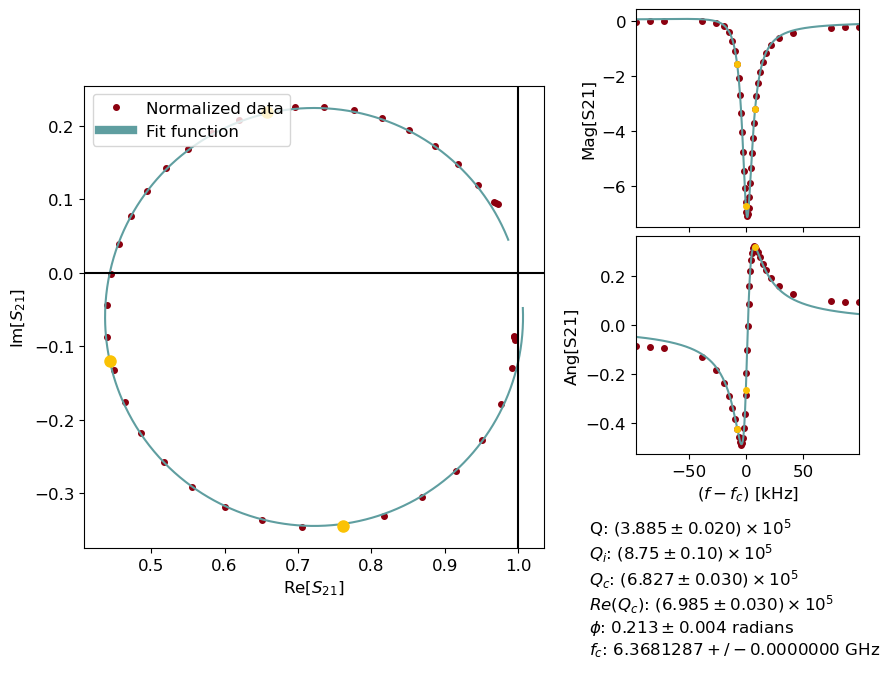

Saved fit results for frequency 6368.129000 MHz, power 4 dBm to CSV
Averaging factor: 0.000
Pin -56.0, N photons: 3.34e+09, navg: 0
Next time: 0.00 min, q_adj: 1.043
6368129876.667852
Time elapsed: 0.42 min, expected time: 0.20 min


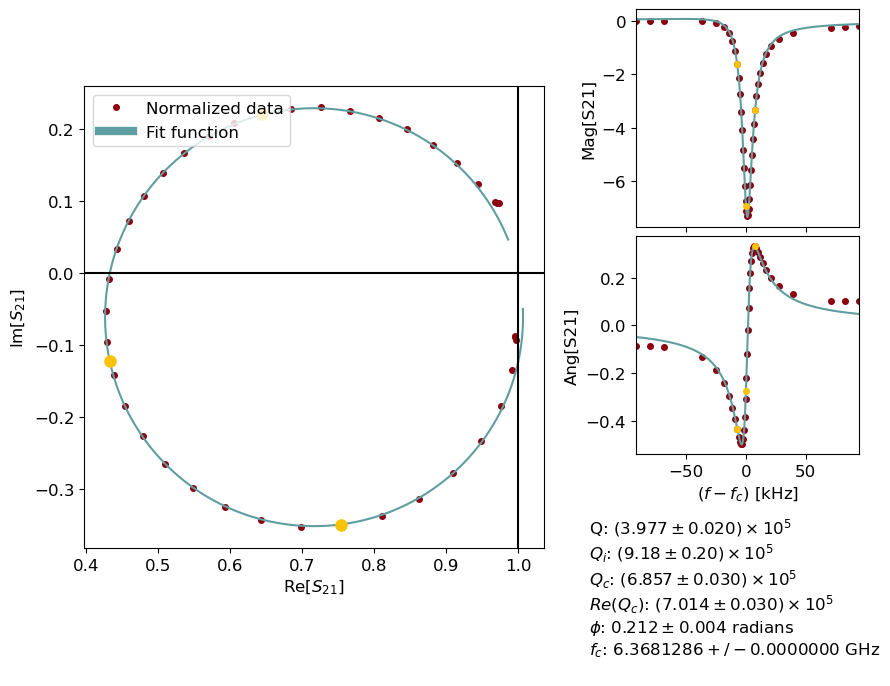

Saved fit results for frequency 6368.129000 MHz, power 0 dBm to CSV
Averaging factor: 0.000
Pin -60.0, N photons: 1.39e+09, navg: 0
Next time: 0.00 min, q_adj: 1.024
6368129570.458704
Time elapsed: 0.42 min, expected time: 0.20 min


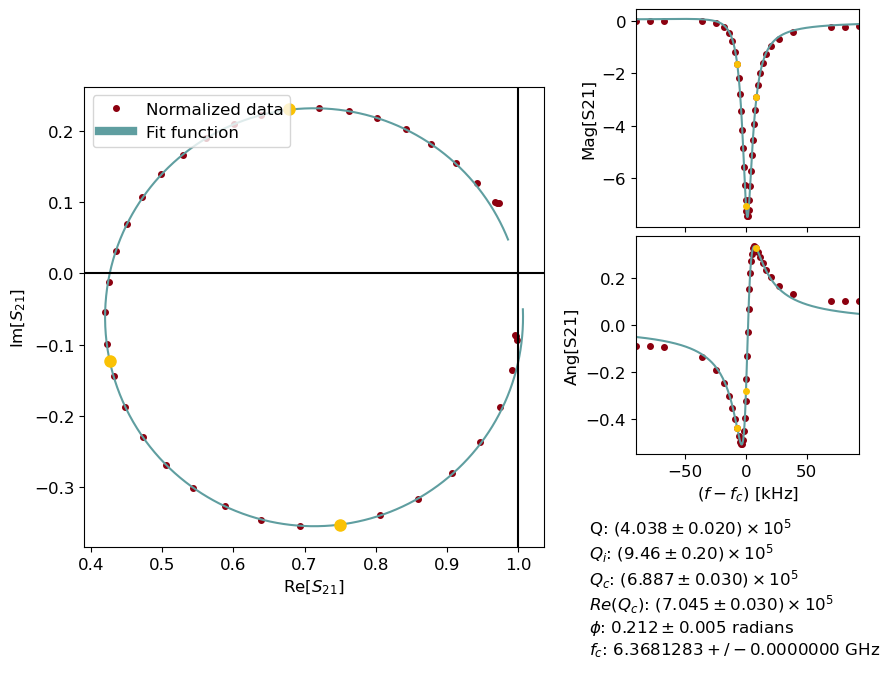

Saved fit results for frequency 6368.128000 MHz, power -4 dBm to CSV
Averaging factor: 0.000
Pin -64.0, N photons: 5.67e+08, navg: 0
Next time: 0.00 min, q_adj: 1.015
6368129270.798124
Time elapsed: 0.42 min, expected time: 0.20 min


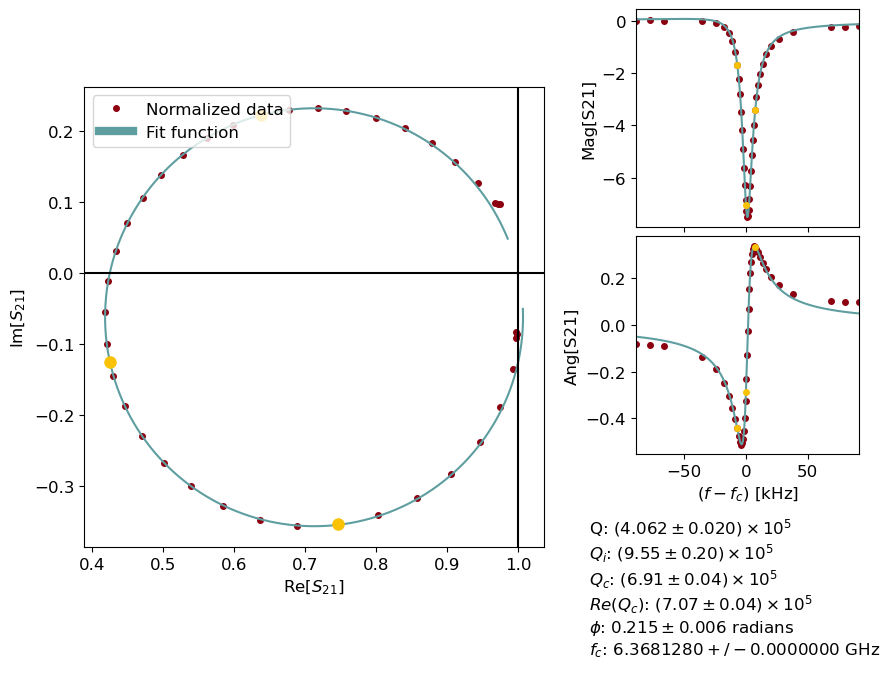

Saved fit results for frequency 6368.128000 MHz, power -8 dBm to CSV
Averaging factor: 0.000
Pin -68.0, N photons: 2.28e+08, navg: 0
Next time: 0.00 min, q_adj: 1.006
6368128974.924558
Time elapsed: 0.27 min, expected time: 0.12 min


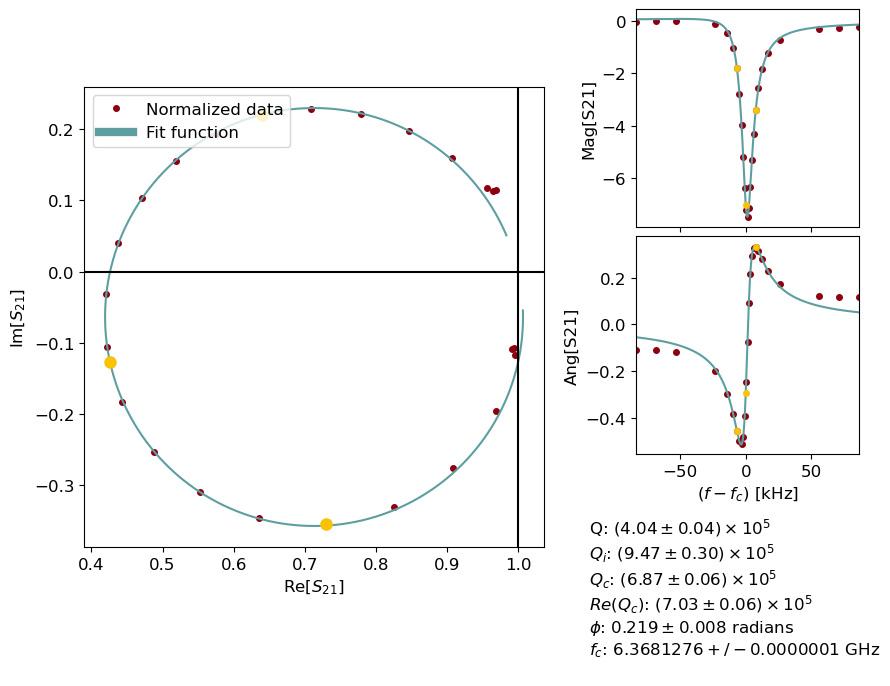

Saved fit results for frequency 6368.128000 MHz, power -12 dBm to CSV
Averaging factor: 0.001
Pin -72.0, N photons: 9e+07, navg: 0
Next time: 0.00 min, q_adj: 0.993
6368128974.924558
Time elapsed: 0.27 min, expected time: 0.12 min


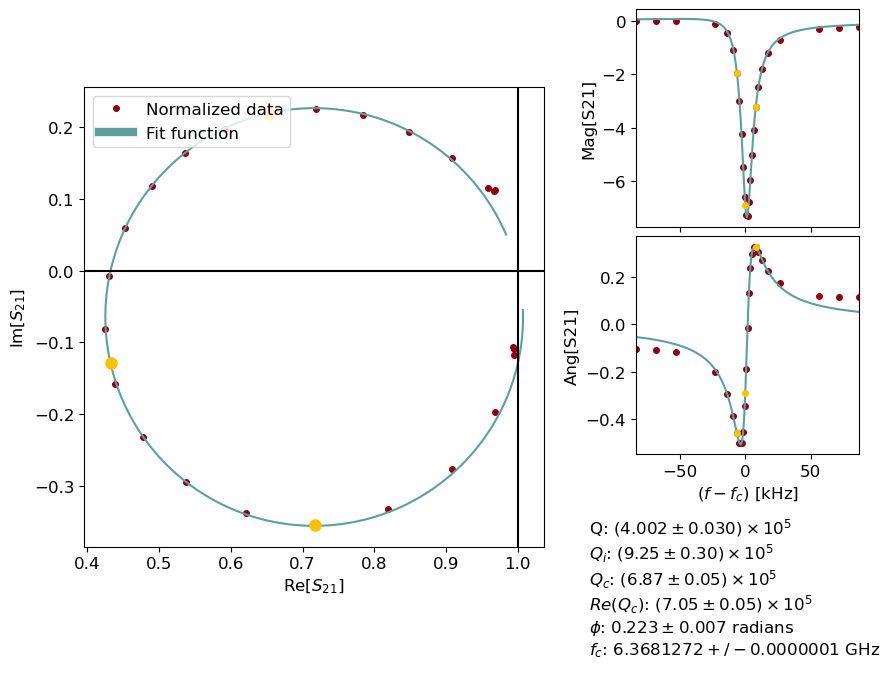

Saved fit results for frequency 6368.127000 MHz, power -16 dBm to CSV
Fit parameters: [1007516.4387  917481.1383       0.           0.4039]
Averaging factor: 0.002
Pin -76.0, N photons: 3.52e+07, navg: 0
Next time: 0.00 min, q_adj: 0.992
6368128974.924558
Time elapsed: 0.27 min, expected time: 0.12 min


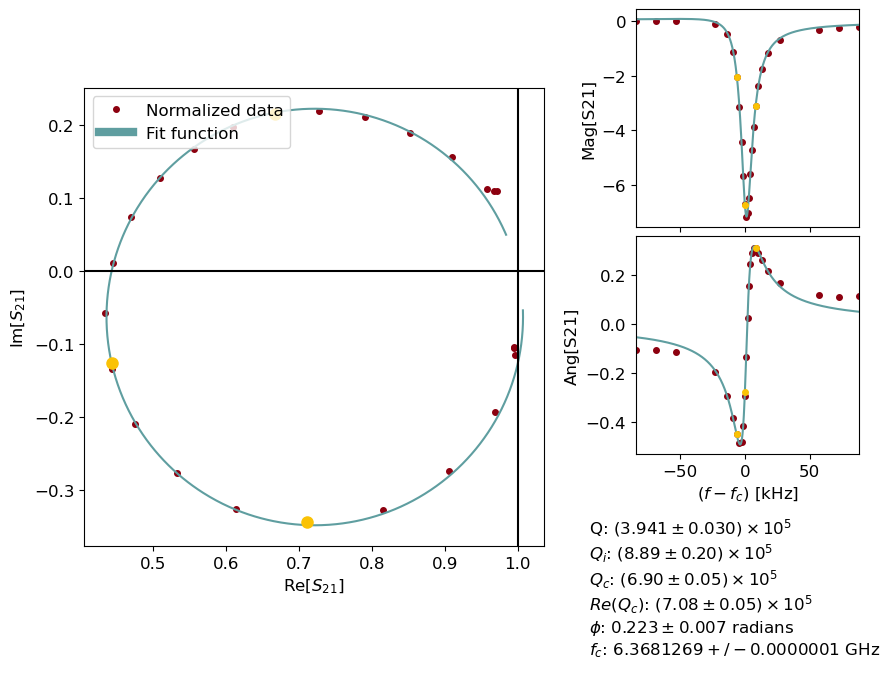

Saved fit results for frequency 6368.127000 MHz, power -20 dBm to CSV
Fit parameters: [1005001.0138  912254.3253       0.           0.4089]
Averaging factor: 0.006
Pin -80.0, N photons: 1.35e+07, navg: 0
Next time: 0.00 min, q_adj: 0.985
6368127941.446553
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.004098179256922534


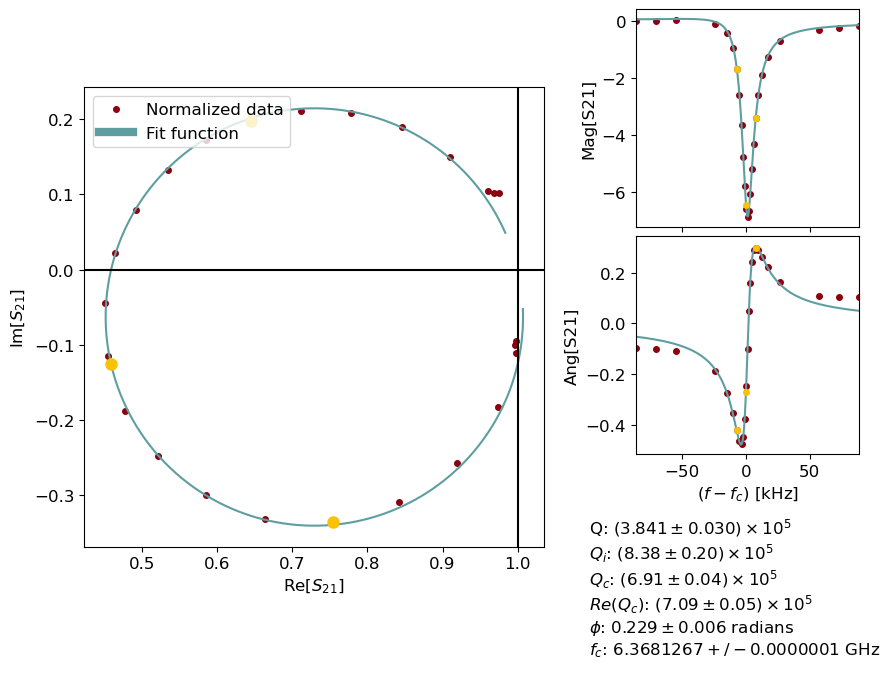

Saved fit results for frequency 6368.127000 MHz, power -24 dBm to CSV
Fit parameters: [     0.0017 909703.7053     60.5574      3.9789]
Averaging factor: 0.016
Pin -84.0, N photons: 5.12e+06, navg: 1
Next time: 0.00 min, q_adj: 0.975
6368127941.446553
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.004340346131046403


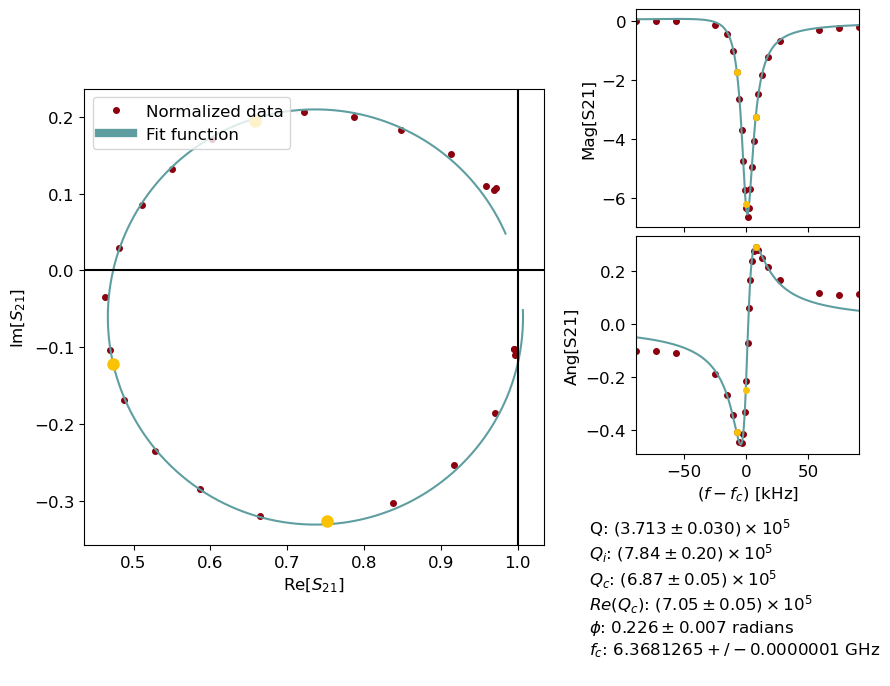

Saved fit results for frequency 6368.127000 MHz, power -28 dBm to CSV
Fit parameters: [    65.9274 909719.4183     53.8821      2.1583]
Averaging factor: 0.043
Pin -88.0, N photons: 1.91e+06, navg: 2
Next time: 0.01 min, q_adj: 0.967
6368127941.446553
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.005800479369025731


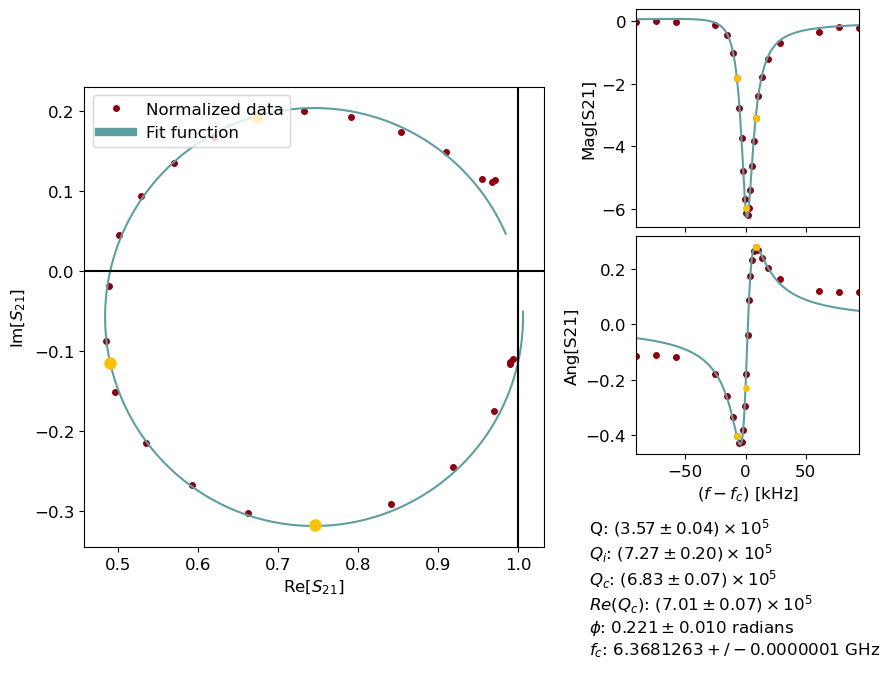

Saved fit results for frequency 6368.126000 MHz, power -32 dBm to CSV
Fit parameters: [  2185.8372 910766.4552     46.4622      1.52  ]
Averaging factor: 0.117
Pin -92.0, N photons: 7.07e+05, navg: 6
Next time: 0.03 min, q_adj: 0.961
6368127941.446553
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.0072936202623927315


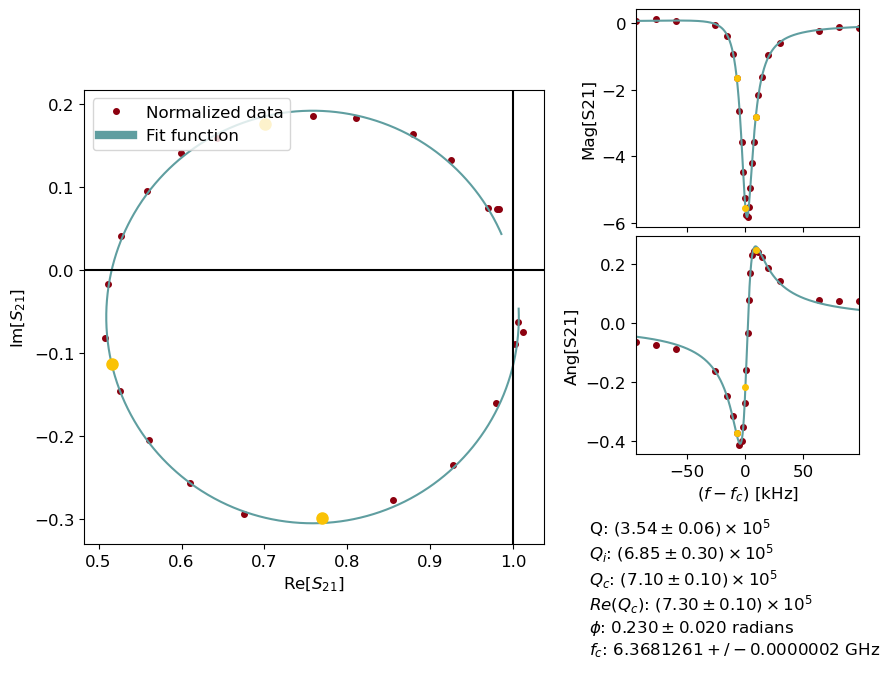

Saved fit results for frequency 6368.126000 MHz, power -36 dBm to CSV
Fit parameters: [2866811.1834  910475.4894 1173083.9521       2.1344]
Averaging factor: 0.320
Pin -96.0, N photons: 2.66e+05, navg: 16
Next time: 0.07 min, q_adj: 0.991
6368127941.446553
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.012261620747411118


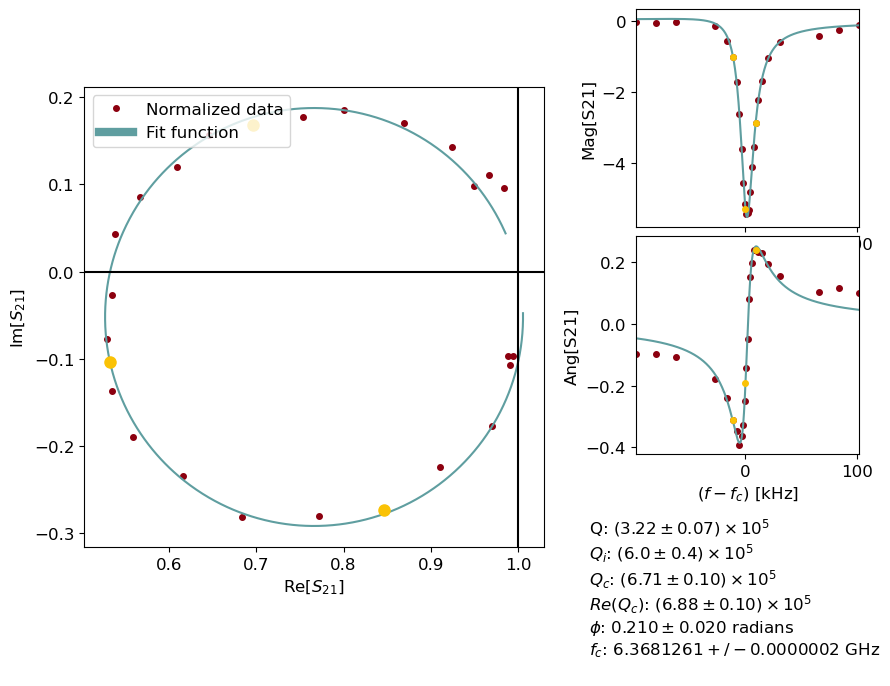

Saved fit results for frequency 6368.126000 MHz, power -40 dBm to CSV
Fit parameters: [1817744.4503  911853.6664  340636.6896       1.4853]
Averaging factor: 0.874
Pin -100.0, N photons: 9.28e+04, navg: 53
Next time: 0.22 min, q_adj: 0.911
6368126739.073522
Time elapsed: 0.36 min, expected time: 0.22 min
Qi err: 0.014702033628775285


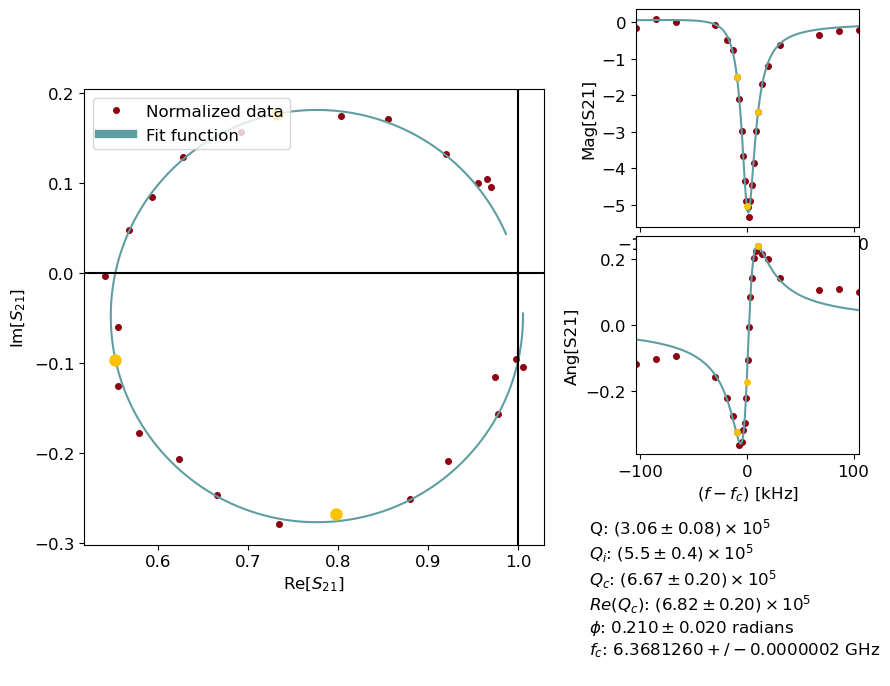

Saved fit results for frequency 6368.126000 MHz, power -44 dBm to CSV
Fit parameters: [1388268.5325  912960.7259  152643.3262       1.274 ]
Averaging factor: 2.413
Pin -104.0, N photons: 3.35e+04, navg: 134
Next time: 0.56 min, q_adj: 0.950
6368127993.382305
Time elapsed: 0.67 min, expected time: 0.56 min
Qi err: 0.015337004660241725


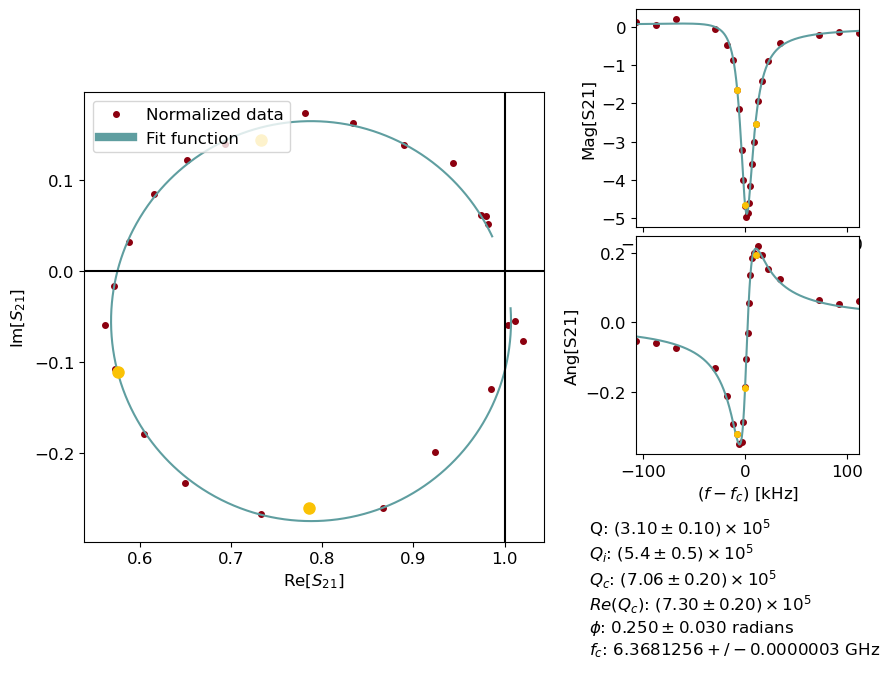

Saved fit results for frequency 6368.126000 MHz, power -48 dBm to CSV
Fit parameters: [1315278.753   913346.7685  128060.5615       1.2337]
Averaging factor: 6.449
Pin -108.0, N photons: 1.3e+04, navg: 313
Next time: 1.30 min, q_adj: 1.015
6368126678.585915
Time elapsed: 1.36 min, expected time: 1.30 min
Qi err: 0.014082517868603019


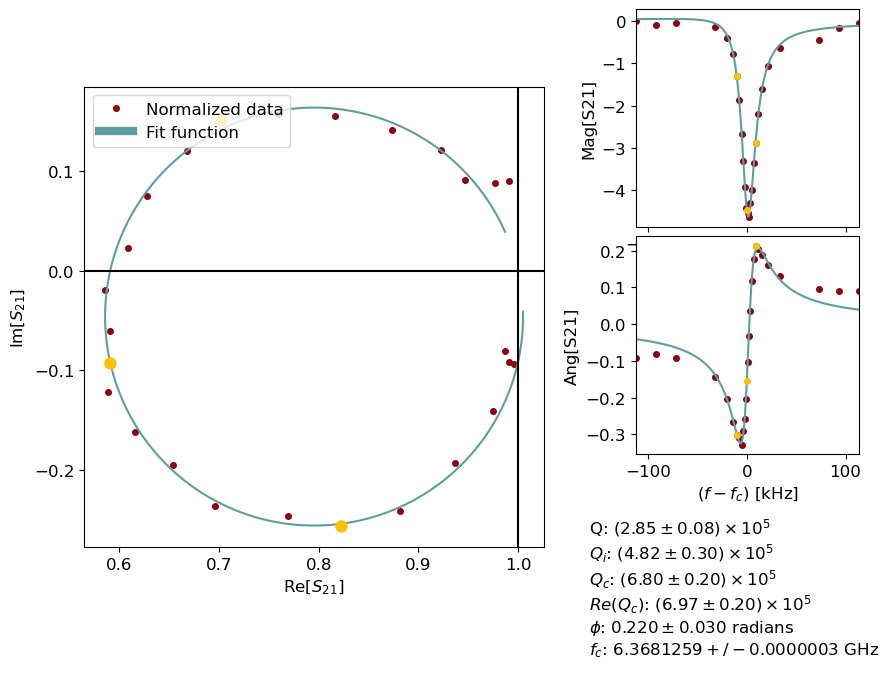

Saved fit results for frequency 6368.126000 MHz, power -52 dBm to CSV
Fit parameters: [1125812.4011  915238.3113   72315.4391       1.1054]
Averaging factor: 18.214
Pin -112.0, N photons: 4.54e+03, navg: 1078
Next time: 4.49 min, q_adj: 0.919
6368128034.887756
Time elapsed: 4.33 min, expected time: 4.49 min
Qi err: 0.013407840413795797


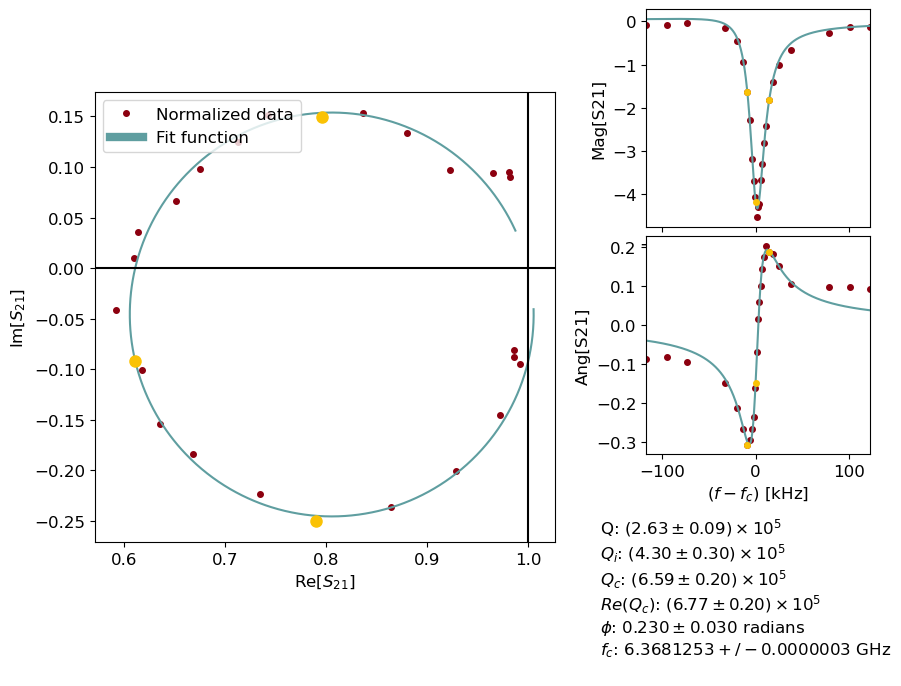

Saved fit results for frequency 6368.126000 MHz, power -56 dBm to CSV
Fit parameters: [919048.4941 918959.3023  30537.7609      0.9502]
Averaging factor: 50.298
Pin -116.0, N photons: 1.59e+03, navg: 2951
Next time: 12.30 min, q_adj: 0.923
6368126596.735776
Time elapsed: 11.59 min, expected time: 12.30 min
Qi err: 0.01243961699316281


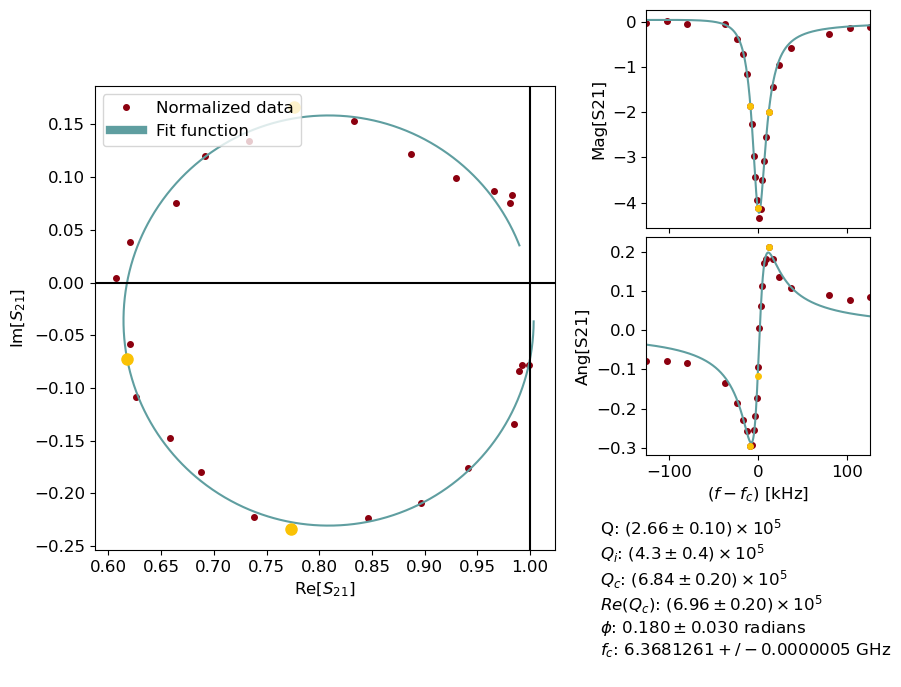

Saved fit results for frequency 6368.126000 MHz, power -60 dBm to CSV
Fit parameters: [851703.206  920659.8901  21444.4617      0.8991]
Averaging factor: 133.288
Pin -120.0, N photons: 623, navg: 6520
Next time: 27.17 min, q_adj: 1.011
Stopping frequency 6.36813 GHz


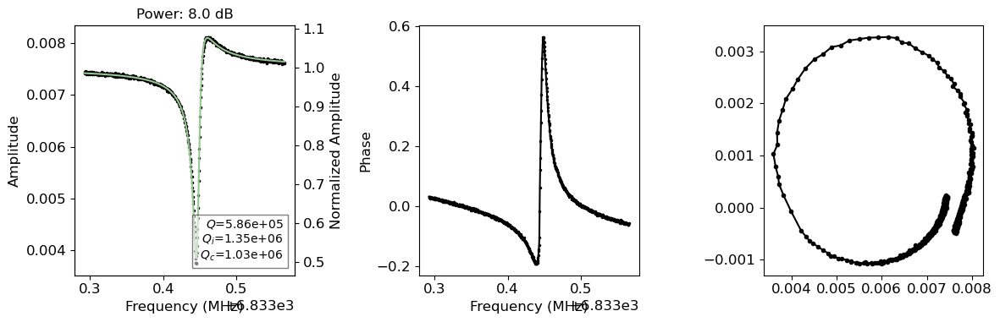

6833447796.489488
Time elapsed: 0.42 min, expected time: 0.20 min


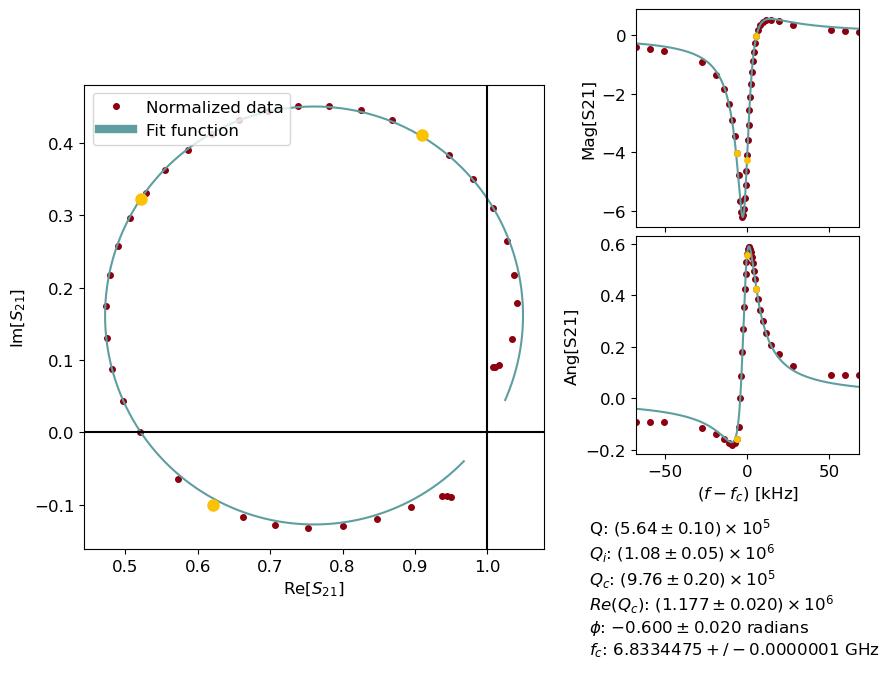

Saved fit results for frequency 6833.448000 MHz, power 8 dBm to CSV
Averaging factor: 0.000
Pin -52.0, N photons: 4.55e+09, navg: 0
Next time: 0.00 min, q_adj: 0.900
6833444583.296844
Time elapsed: 0.42 min, expected time: 0.20 min


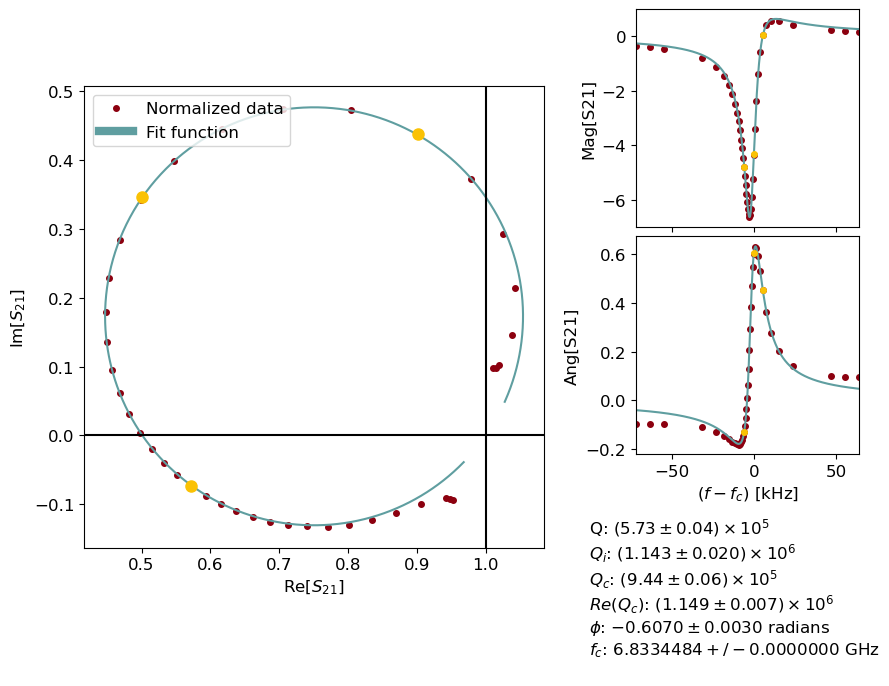

Saved fit results for frequency 6833.449000 MHz, power 4 dBm to CSV
Averaging factor: 0.000
Pin -56.0, N photons: 1.94e+09, navg: 0
Next time: 0.00 min, q_adj: 1.017
6833445709.90227
Time elapsed: 0.42 min, expected time: 0.20 min


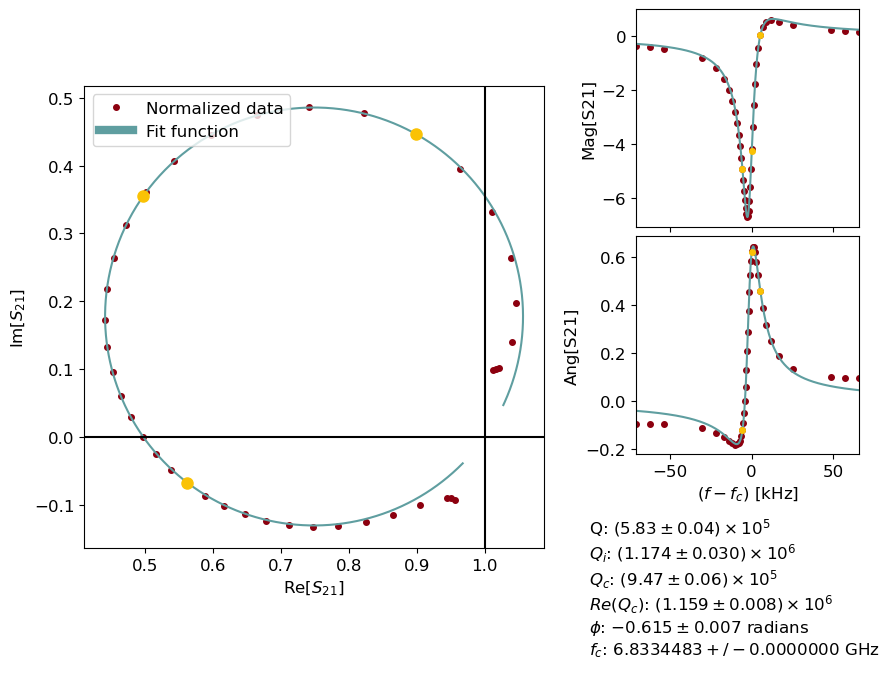

Saved fit results for frequency 6833.448000 MHz, power 0 dBm to CSV
Averaging factor: 0.000
Pin -60.0, N photons: 7.96e+08, navg: 0
Next time: 0.00 min, q_adj: 1.018
6833445485.95886
Time elapsed: 0.42 min, expected time: 0.20 min


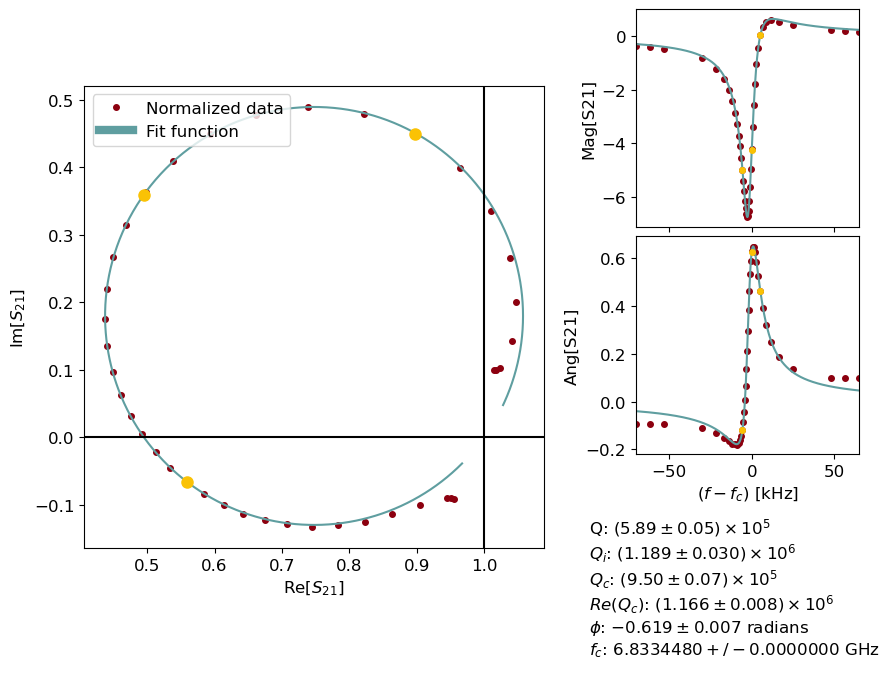

Saved fit results for frequency 6833.448000 MHz, power -4 dBm to CSV
Averaging factor: 0.000
Pin -64.0, N photons: 3.22e+08, navg: 0
Next time: 0.00 min, q_adj: 1.009
6833445265.001718
Time elapsed: 0.42 min, expected time: 0.20 min


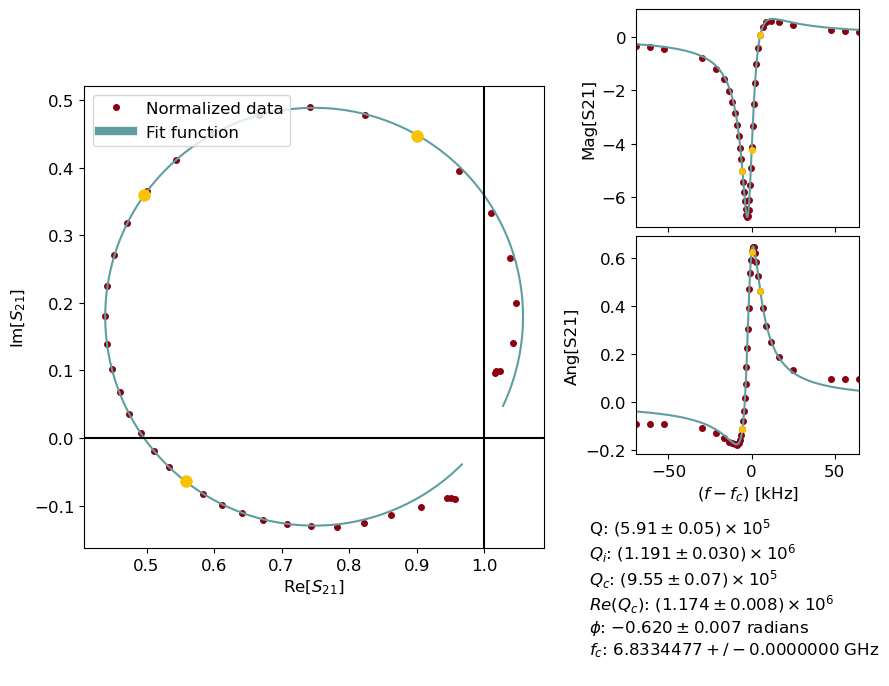

Saved fit results for frequency 6833.448000 MHz, power -8 dBm to CSV
Averaging factor: 0.001
Pin -68.0, N photons: 1.28e+08, navg: 0
Next time: 0.00 min, q_adj: 1.004
6833445045.582142
Time elapsed: 0.27 min, expected time: 0.12 min


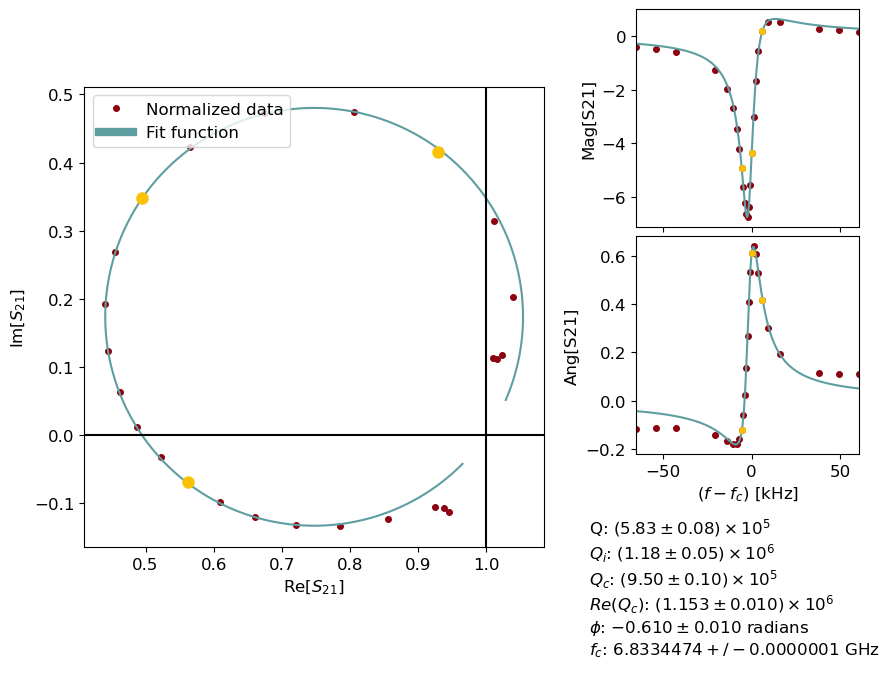

Saved fit results for frequency 6833.448000 MHz, power -12 dBm to CSV
Averaging factor: 0.002
Pin -72.0, N photons: 5e+07, navg: 0
Next time: 0.00 min, q_adj: 0.986
6833445045.582142
Time elapsed: 0.27 min, expected time: 0.12 min


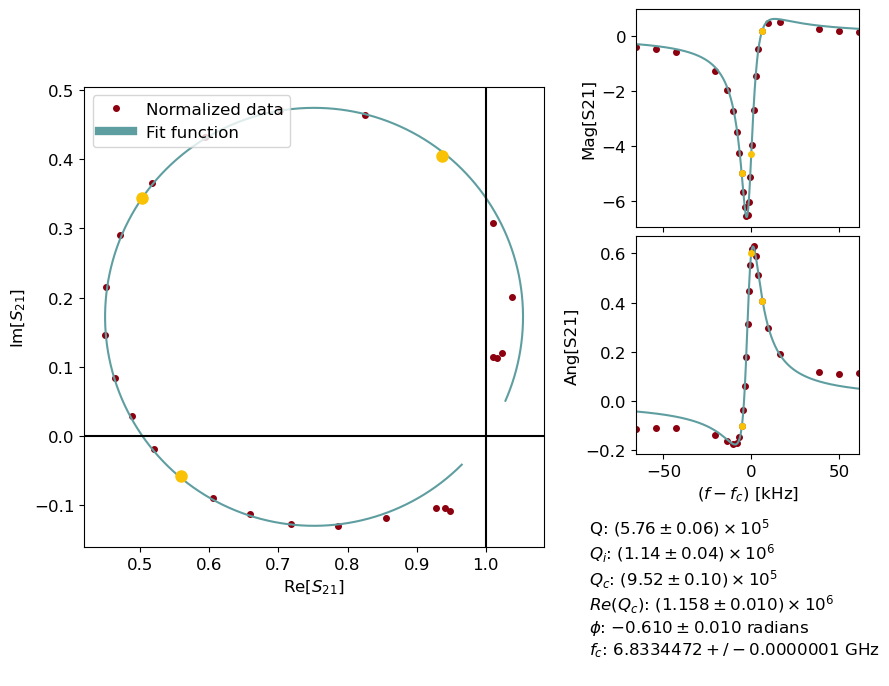

Saved fit results for frequency 6833.447000 MHz, power -16 dBm to CSV
Fit parameters: [1365217.3165 1160887.1585       0.           0.4215]
Averaging factor: 0.005
Pin -76.0, N photons: 1.94e+07, navg: 0
Next time: 0.00 min, q_adj: 0.988
6833444282.814811
Time elapsed: 0.27 min, expected time: 0.12 min


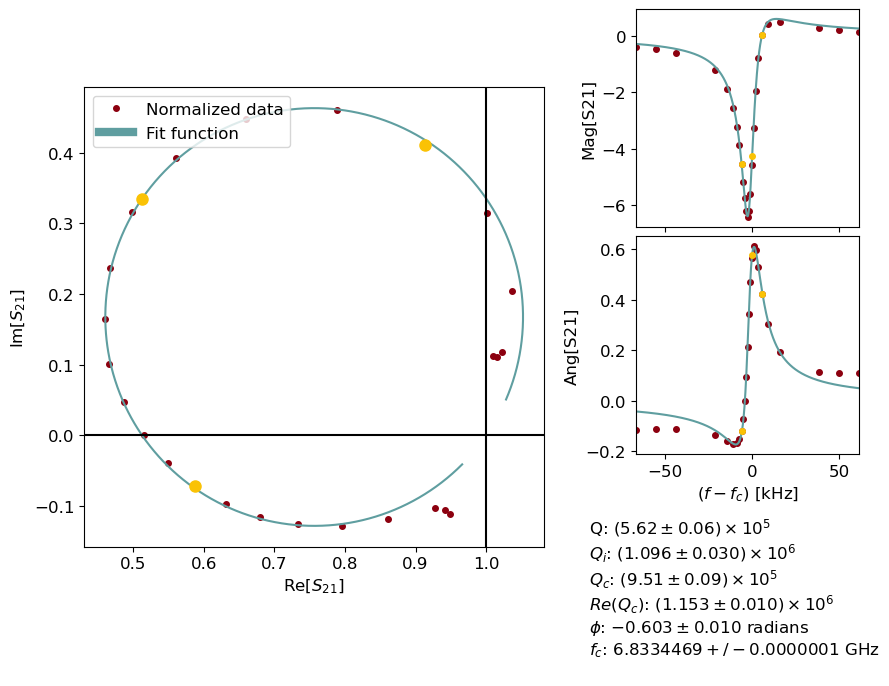

Saved fit results for frequency 6833.447000 MHz, power -20 dBm to CSV
Fit parameters: [      0.     1158782.1467      28.7671       4.5088]
Averaging factor: 0.013
Pin -80.0, N photons: 7.37e+06, navg: 1
Next time: 0.00 min, q_adj: 0.976
6833444282.814811
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.005984226176597026


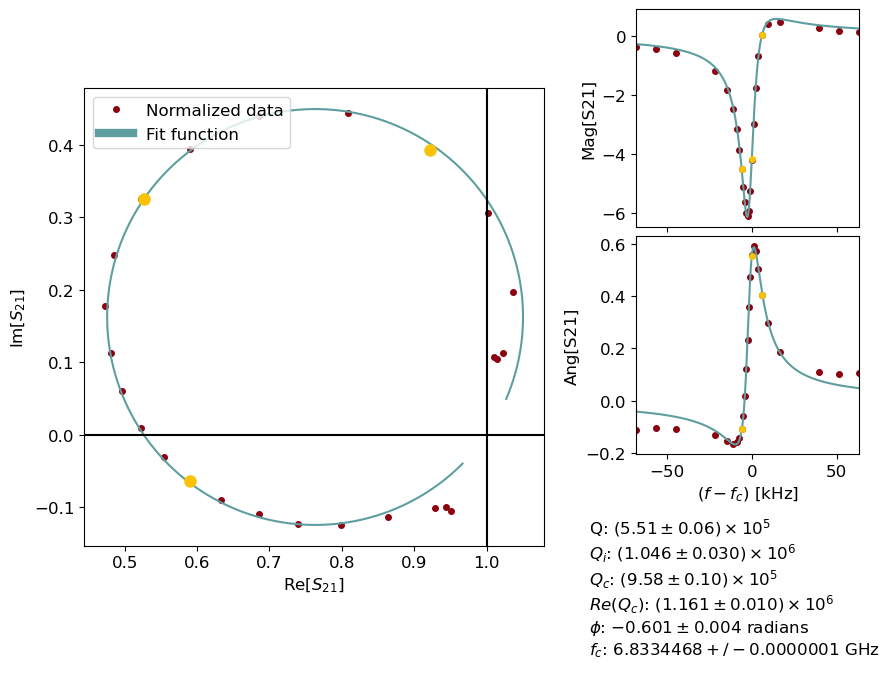

Saved fit results for frequency 6833.447000 MHz, power -24 dBm to CSV
Fit parameters: [     49.3758 1158928.7544      39.6341       2.194 ]
Averaging factor: 0.035
Pin -84.0, N photons: 2.79e+06, navg: 2
Next time: 0.01 min, q_adj: 0.980
6833444282.814811
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.00601836079929561


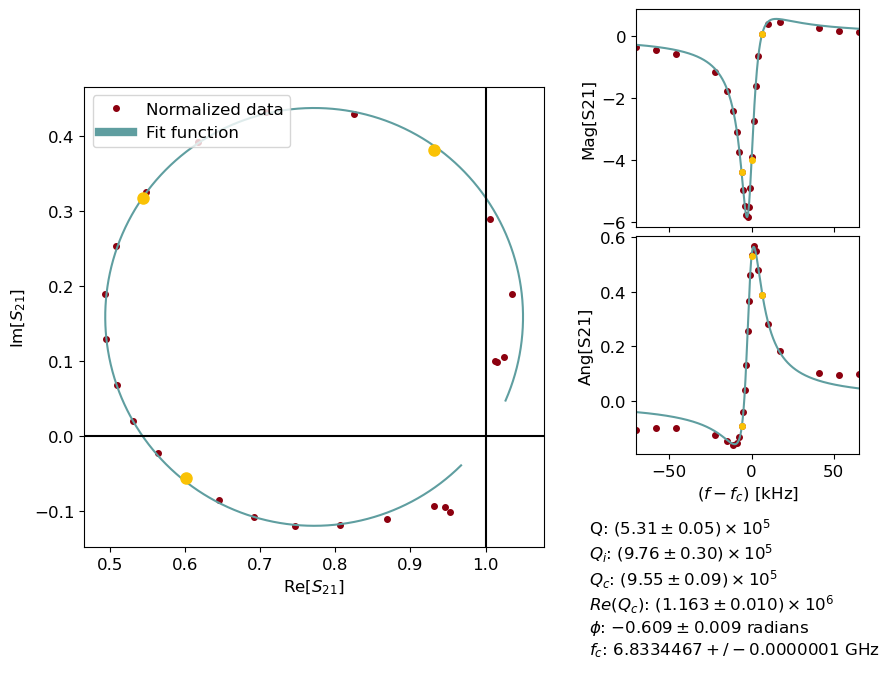

Saved fit results for frequency 6833.447000 MHz, power -28 dBm to CSV
Fit parameters: [   1986.8105 1160401.2006      38.8372       1.5665]
Averaging factor: 0.094
Pin -88.0, N photons: 1.04e+06, navg: 5
Next time: 0.02 min, q_adj: 0.964
6833444282.814811
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.008392739576603234


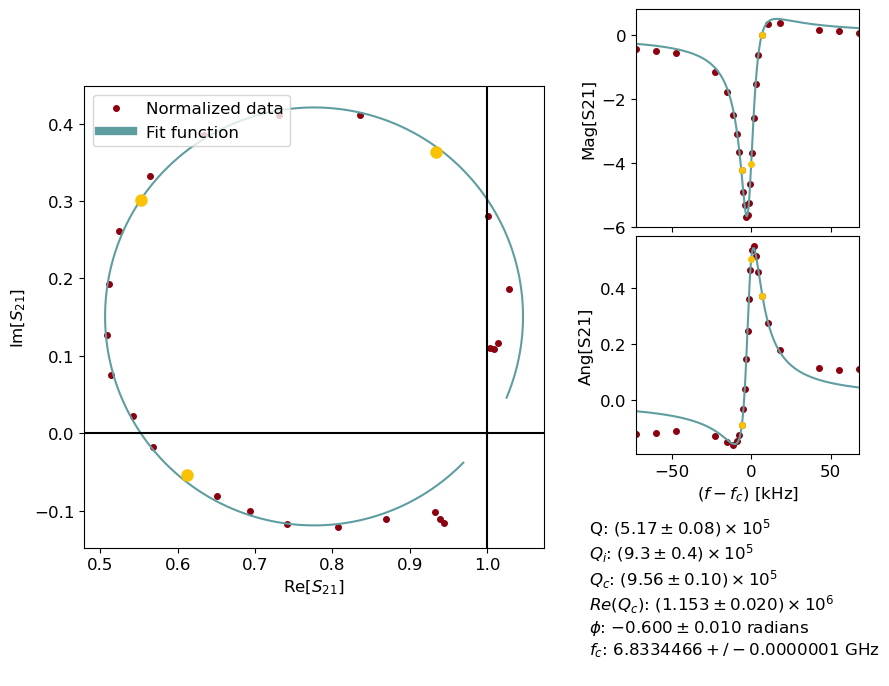

Saved fit results for frequency 6833.447000 MHz, power -32 dBm to CSV
Fit parameters: [4820178.7421 1159696.0561 1457277.9559       2.1157]
Averaging factor: 0.254
Pin -92.0, N photons: 3.9e+05, navg: 13
Next time: 0.05 min, q_adj: 0.973
6833443440.731311
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: 0.015764430371280568


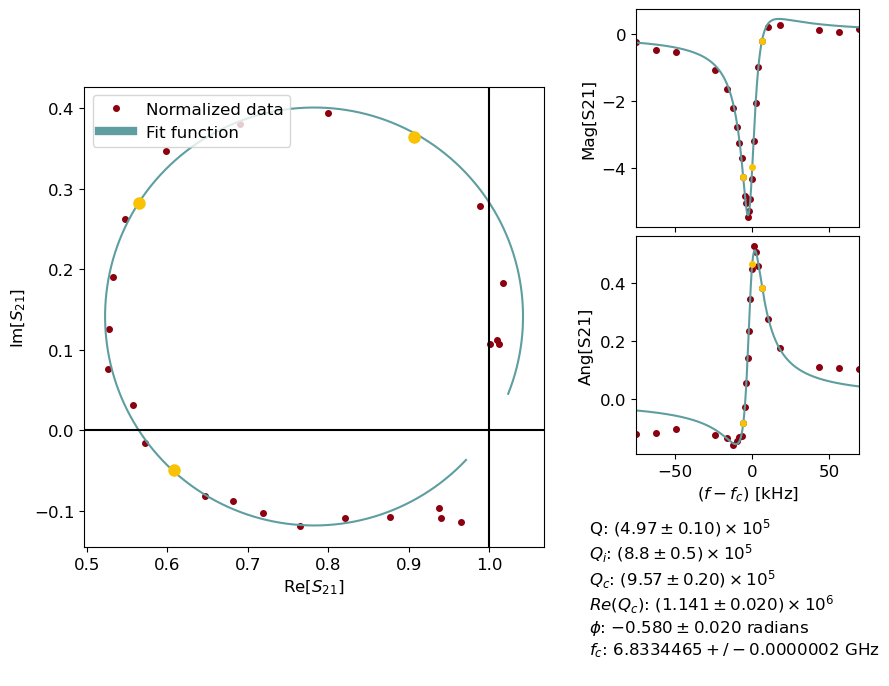

Saved fit results for frequency 6833.447000 MHz, power -36 dBm to CSV
Fit parameters: [3817728.1441 1160990.804   799423.752        1.6982]
Averaging factor: 0.691
Pin -96.0, N photons: 1.44e+05, navg: 37
Next time: 0.15 min, q_adj: 0.963
6833443440.731311
Time elapsed: 0.29 min, expected time: 0.15 min
Qi err: 0.015575908454101846


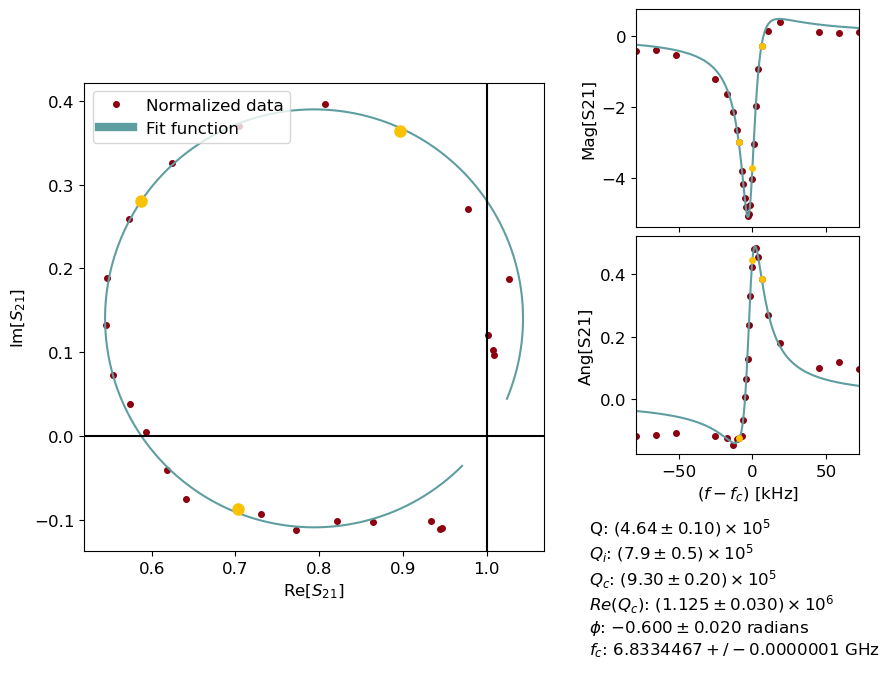

Saved fit results for frequency 6833.447000 MHz, power -40 dBm to CSV
Fit parameters: [2342679.6748 1165255.0399  165113.2769       1.1538]
Averaging factor: 1.921
Pin -100.0, N photons: 5.13e+04, navg: 110
Next time: 0.46 min, q_adj: 0.933
6833443440.731311
Time elapsed: 0.58 min, expected time: 0.46 min
Qi err: 0.014675247564876022


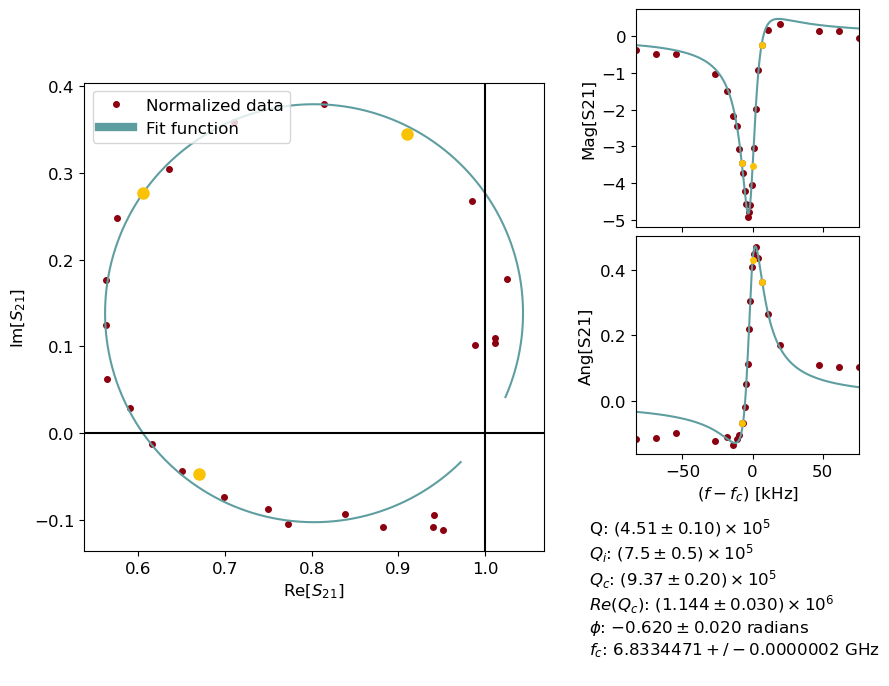

Saved fit results for frequency 6833.447000 MHz, power -44 dBm to CSV
Fit parameters: [1944418.3739 1167128.6158   86611.9587       1.042 ]
Averaging factor: 5.129
Pin -104.0, N photons: 1.92e+04, navg: 271
Next time: 1.13 min, q_adj: 0.974
6833443440.731311
Time elapsed: 1.20 min, expected time: 1.13 min
Qi err: 0.016305763606095643


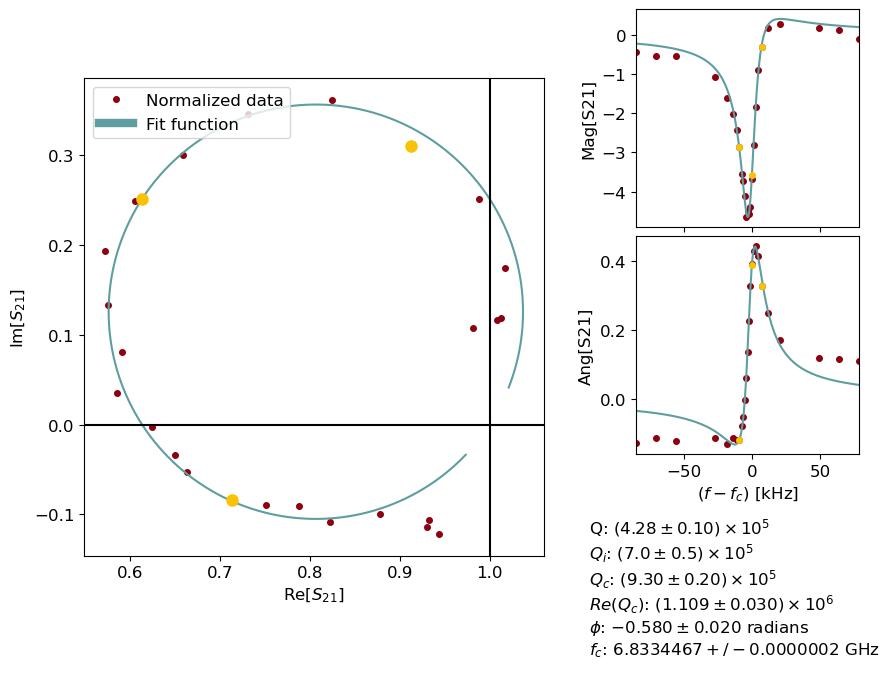

Saved fit results for frequency 6833.447000 MHz, power -48 dBm to CSV
Fit parameters: [1698024.767  1169284.5591   51622.144        0.9619]
Averaging factor: 14.144
Pin -108.0, N photons: 6.94e+03, navg: 785
Next time: 3.27 min, q_adj: 0.949
6833442456.6173115
Time elapsed: 3.20 min, expected time: 3.27 min
Qi err: 0.016489282776055488


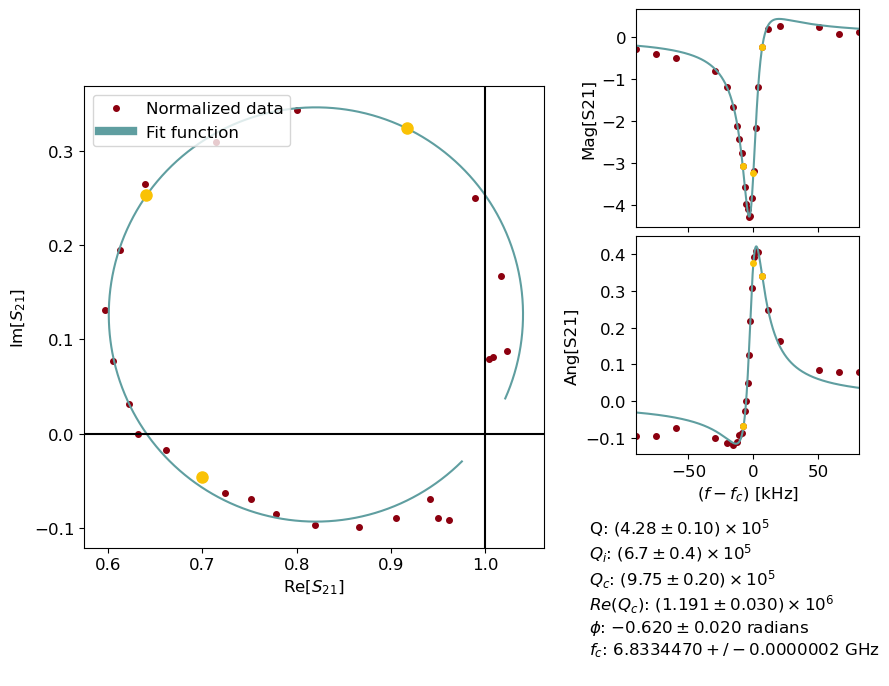

Saved fit results for frequency 6833.447000 MHz, power -52 dBm to CSV
Fit parameters: [1558528.3045 1171274.9492   35992.015        0.9087]
Averaging factor: 38.791
Pin -112.0, N photons: 2.63e+03, navg: 1946
Next time: 8.11 min, q_adj: 0.998
6833443487.777112
Time elapsed: 7.70 min, expected time: 8.11 min
Qi err: 0.012365007036680916


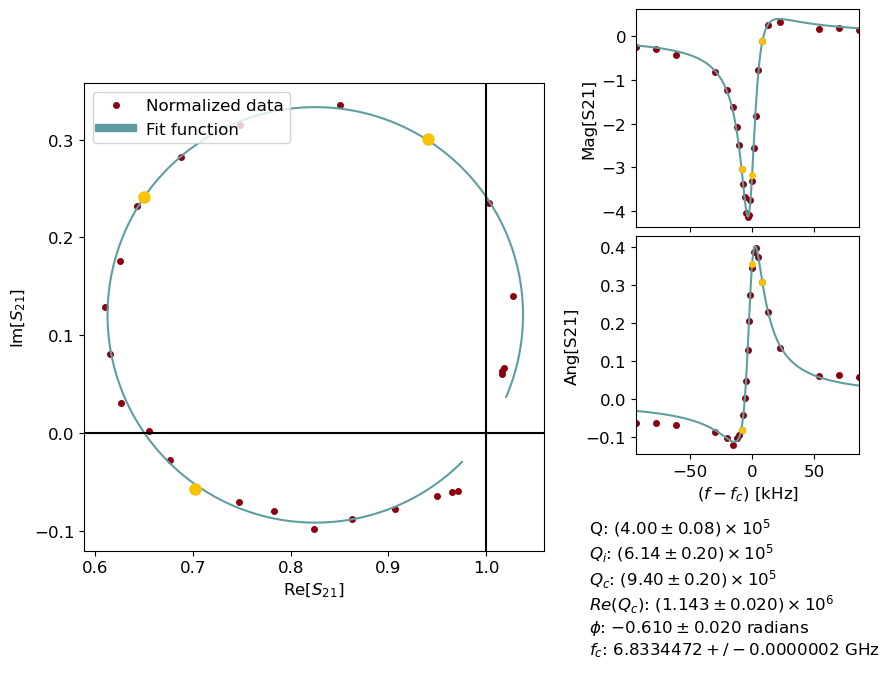

Saved fit results for frequency 6833.447000 MHz, power -56 dBm to CSV
Fit parameters: [1361267.1606 1175688.082    19118.7243       0.8225]
Averaging factor: 102.226
Pin -116.0, N photons: 945, navg: 5862
Next time: 24.43 min, q_adj: 0.934
6833443487.777112
Time elapsed: 22.90 min, expected time: 24.43 min
Qi err: 0.011368198117703671


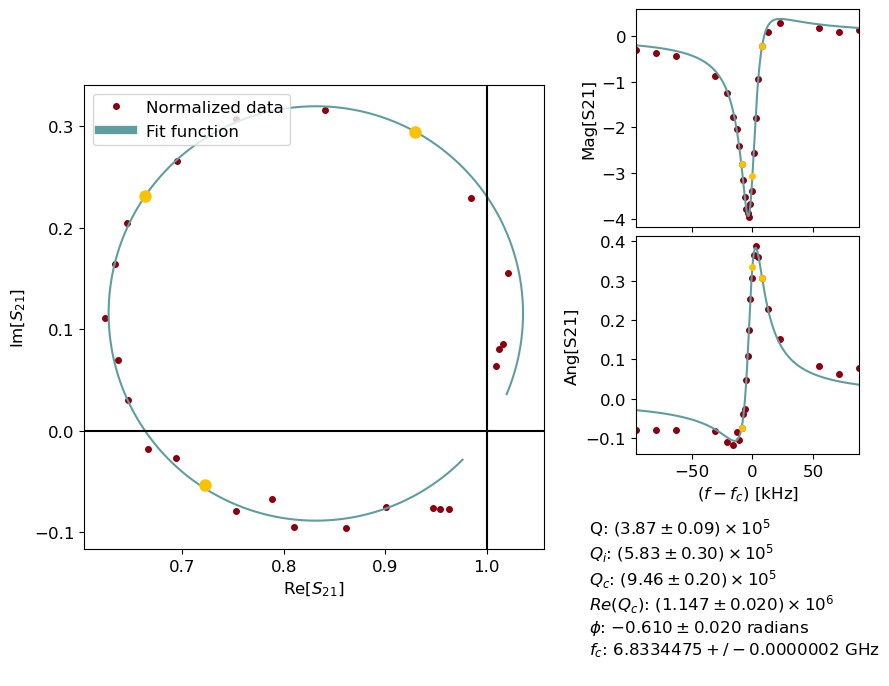

Saved fit results for frequency 6833.448000 MHz, power -60 dBm to CSV
Fit parameters: [1217221.2826 1180380.6203   10735.6232       0.7552]
Averaging factor: 284.948
Pin -120.0, N photons: 350, navg: 15230
Next time: 63.46 min, q_adj: 0.967
Stopping frequency 6.83344 GHz


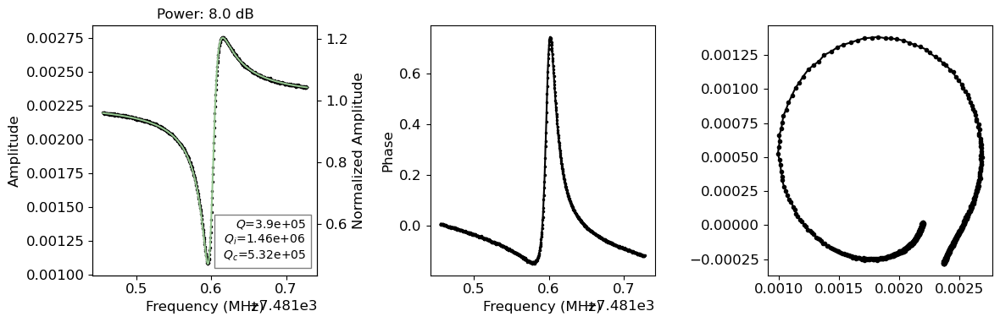

7481602770.993205
Time elapsed: 0.42 min, expected time: 0.20 min


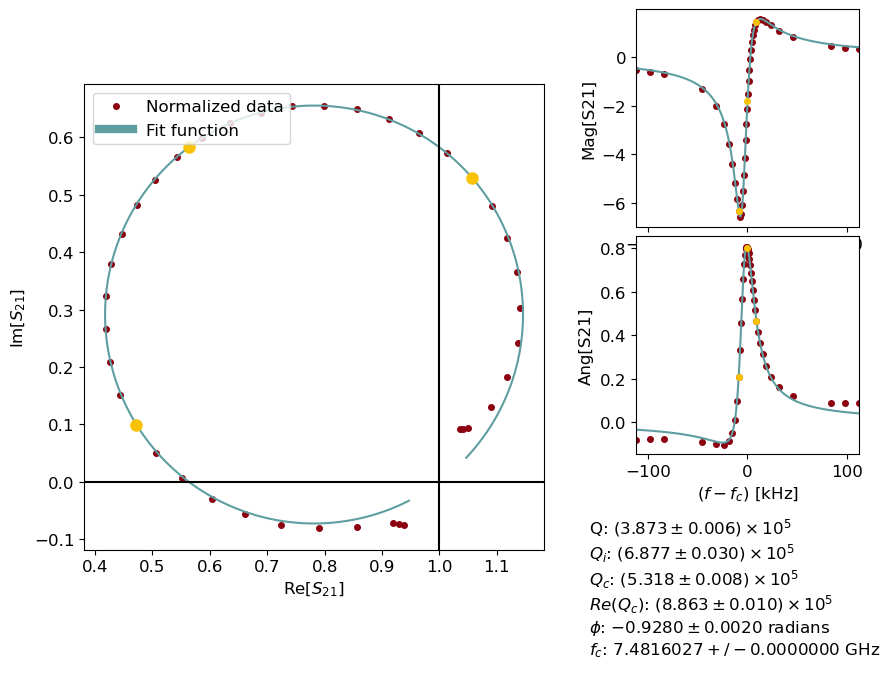

Saved fit results for frequency 7481.603000 MHz, power 8 dBm to CSV
Averaging factor: 0.000
Pin -52.0, N photons: 9.97e+08, navg: 0
Next time: 0.00 min, q_adj: 0.900
7481595227.666077
Time elapsed: 0.42 min, expected time: 0.20 min


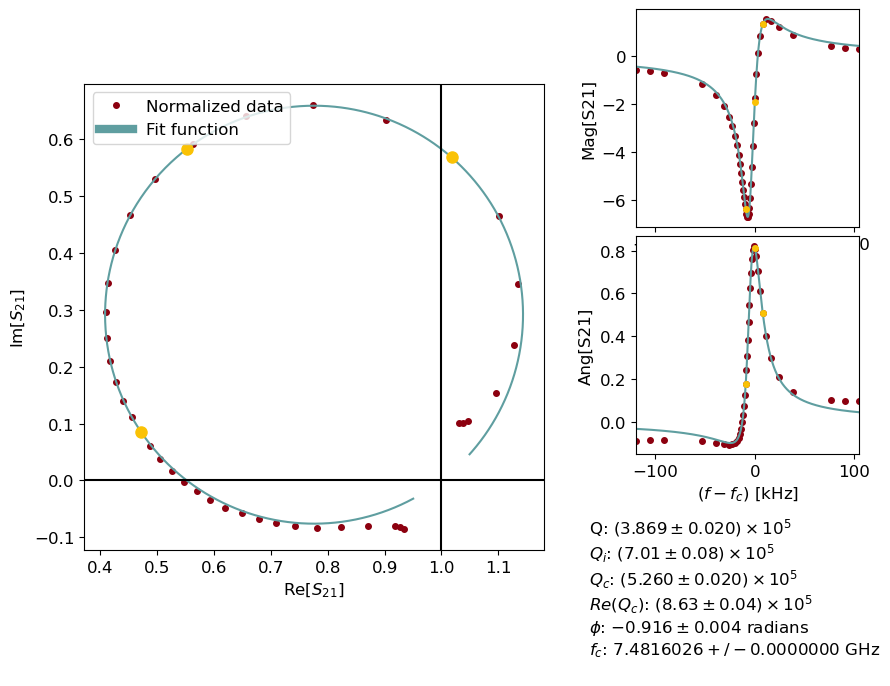

Saved fit results for frequency 7481.603000 MHz, power 4 dBm to CSV
Averaging factor: 0.000
Pin -56.0, N photons: 4e+08, navg: 0
Next time: 0.00 min, q_adj: 0.999
7481595594.599391
Time elapsed: 0.42 min, expected time: 0.20 min


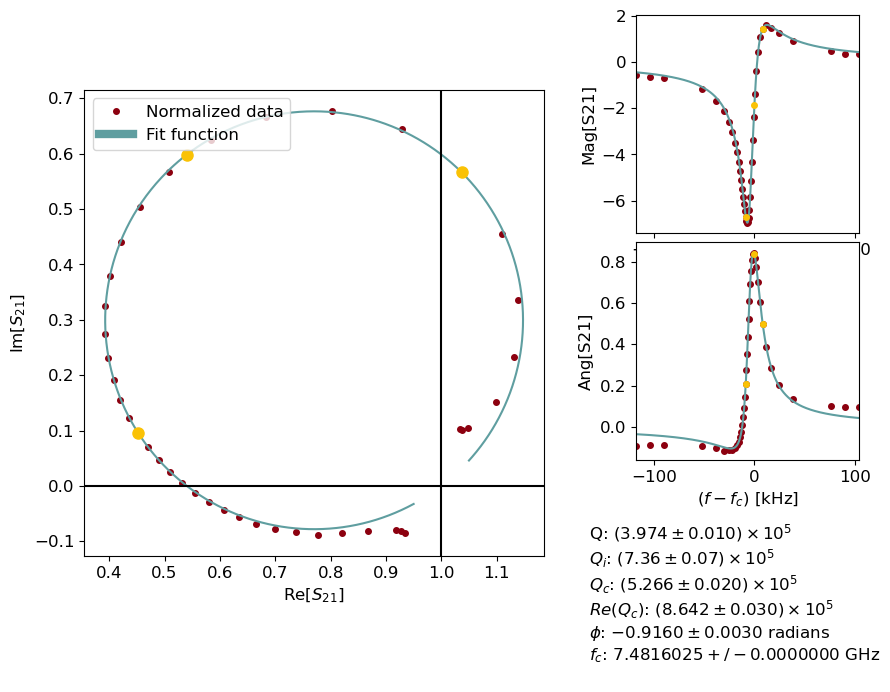

Saved fit results for frequency 7481.603000 MHz, power 0 dBm to CSV
Averaging factor: 0.000
Pin -60.0, N photons: 1.68e+08, navg: 0
Next time: 0.00 min, q_adj: 1.027
7481595230.357324
Time elapsed: 0.42 min, expected time: 0.20 min


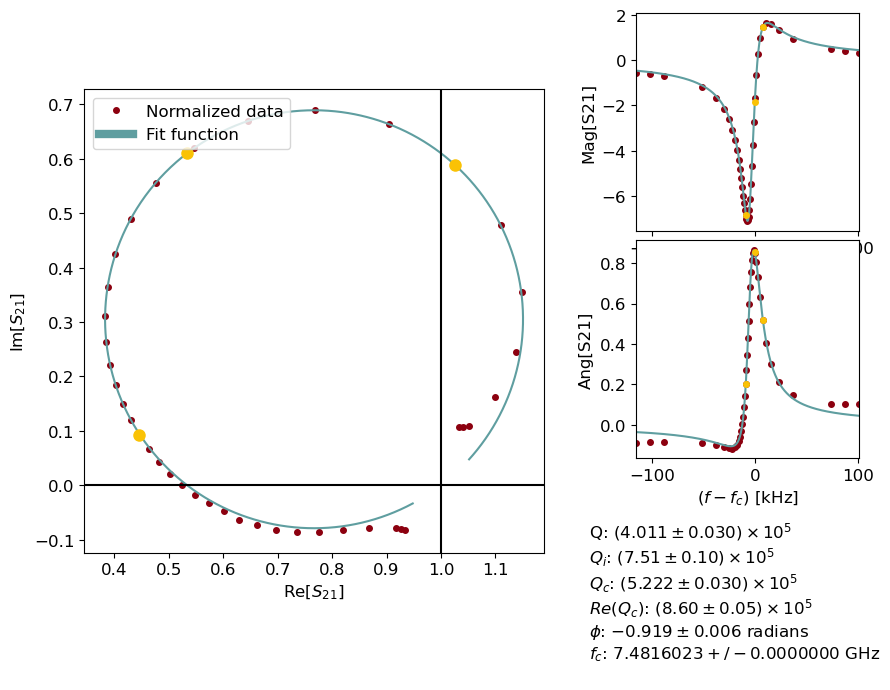

Saved fit results for frequency 7481.602000 MHz, power -4 dBm to CSV
Averaging factor: 0.001
Pin -64.0, N photons: 6.87e+07, navg: 0
Next time: 0.00 min, q_adj: 1.009
7481594875.614024
Time elapsed: 0.42 min, expected time: 0.20 min


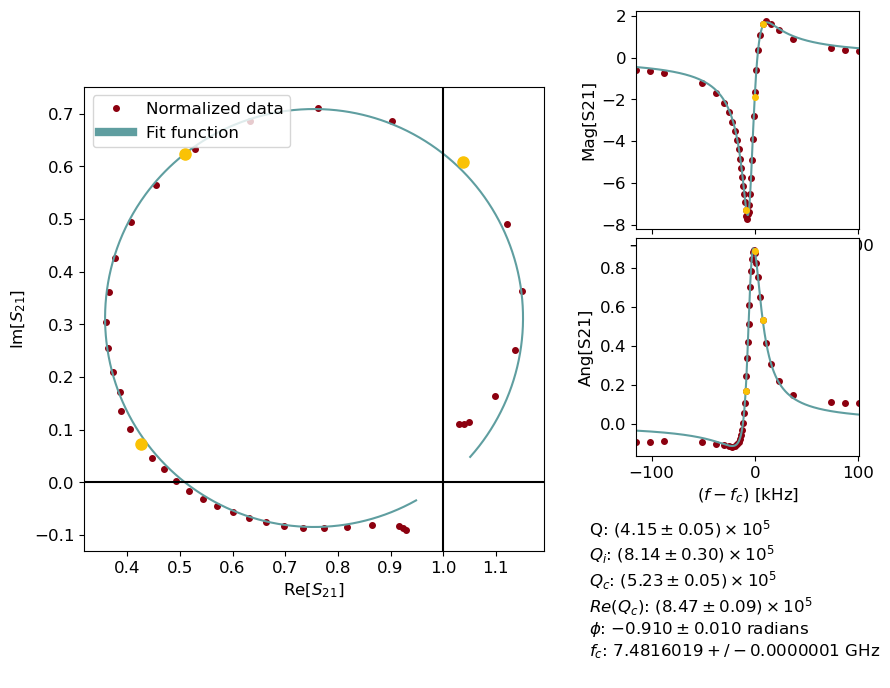

Saved fit results for frequency 7481.602000 MHz, power -8 dBm to CSV
Averaging factor: 0.001
Pin -68.0, N photons: 2.93e+07, navg: 0
Next time: 0.00 min, q_adj: 1.035
7481594522.114298
Time elapsed: 0.27 min, expected time: 0.12 min


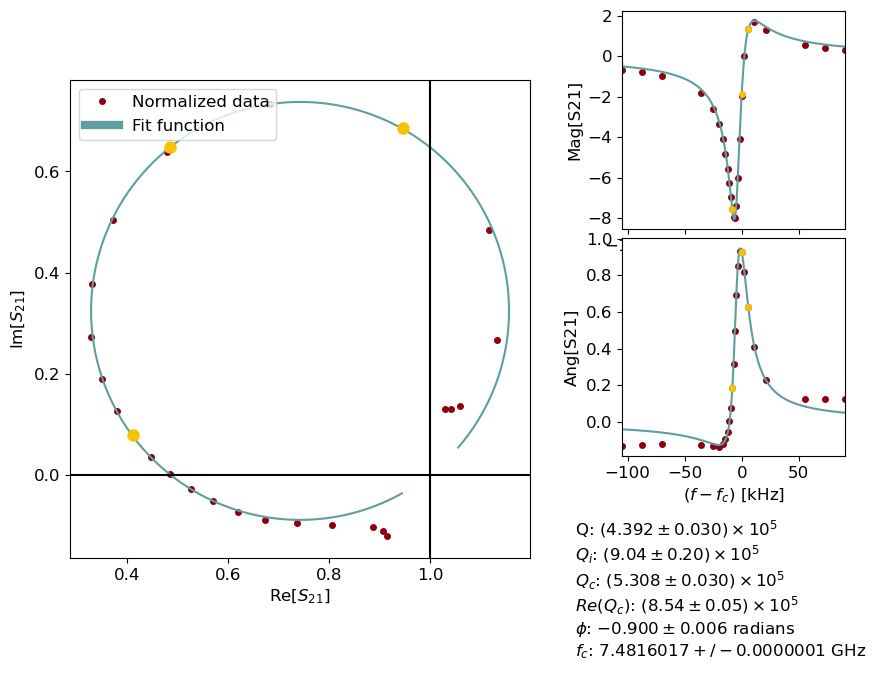

Saved fit results for frequency 7481.602000 MHz, power -12 dBm to CSV
Averaging factor: 0.003
Pin -72.0, N photons: 1.28e+07, navg: 0
Next time: 0.00 min, q_adj: 1.058
7481595695.793142
Time elapsed: 0.27 min, expected time: 0.12 min


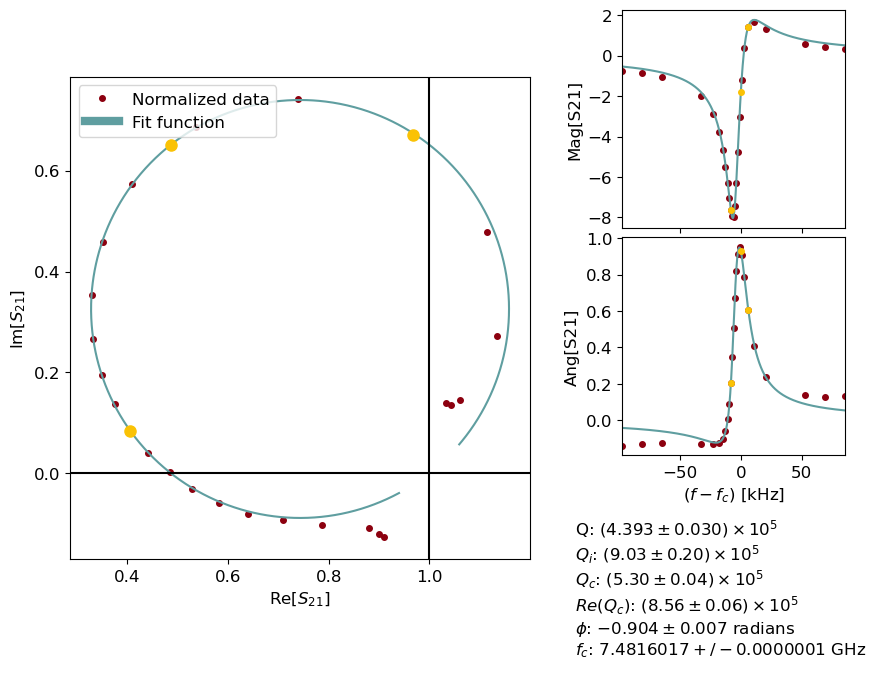

Saved fit results for frequency 7481.602000 MHz, power -16 dBm to CSV
Fit parameters: [797195.7248 799982.9579      0.          0.3646]
Averaging factor: 0.009
Pin -76.0, N photons: 5.13e+06, navg: 0
Next time: 0.00 min, q_adj: 1.000
7481595695.793142
Time elapsed: 0.27 min, expected time: 0.12 min


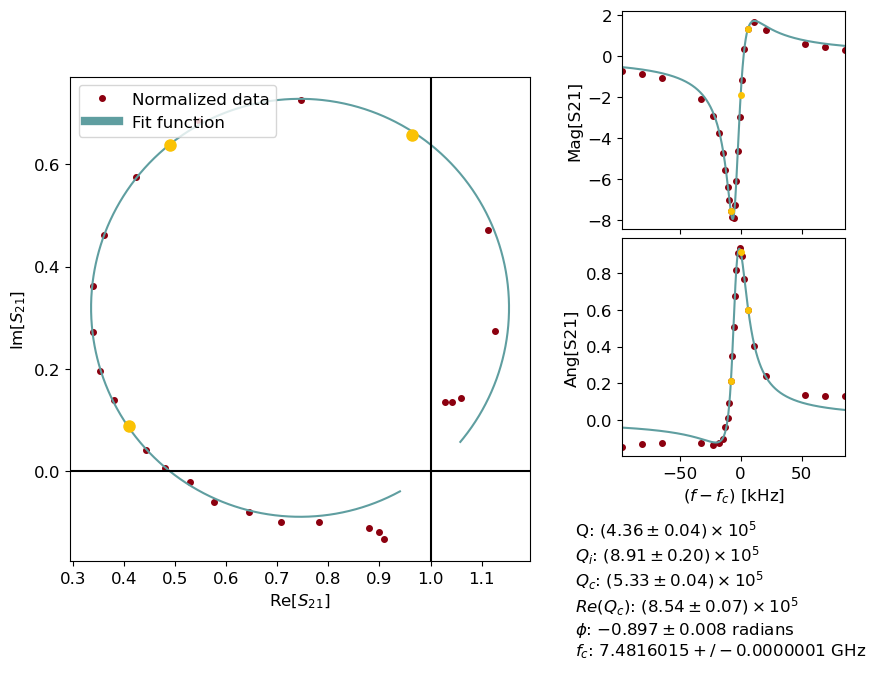

Saved fit results for frequency 7481.602000 MHz, power -20 dBm to CSV
Fit parameters: [888428.4462 817066.7105      0.          0.3838]
Averaging factor: 0.022
Pin -80.0, N photons: 2e+06, navg: 1
Next time: 0.00 min, q_adj: 0.992
7481595695.793142
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: -inf


c:\Users\slab\anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


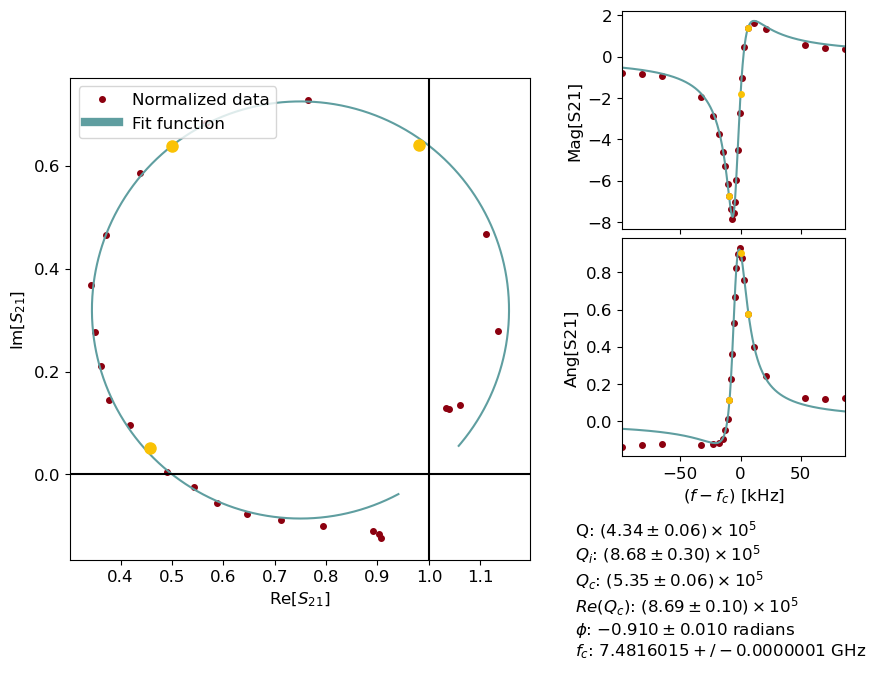

Saved fit results for frequency 7481.602000 MHz, power -24 dBm to CSV
Fit parameters: [883886.3719 825050.8649      0.          0.3968]
Averaging factor: 0.038
Pin -84.0, N photons: 7.86e+05, navg: 2
Next time: 0.01 min, q_adj: 0.996
7481594584.780002
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: -inf


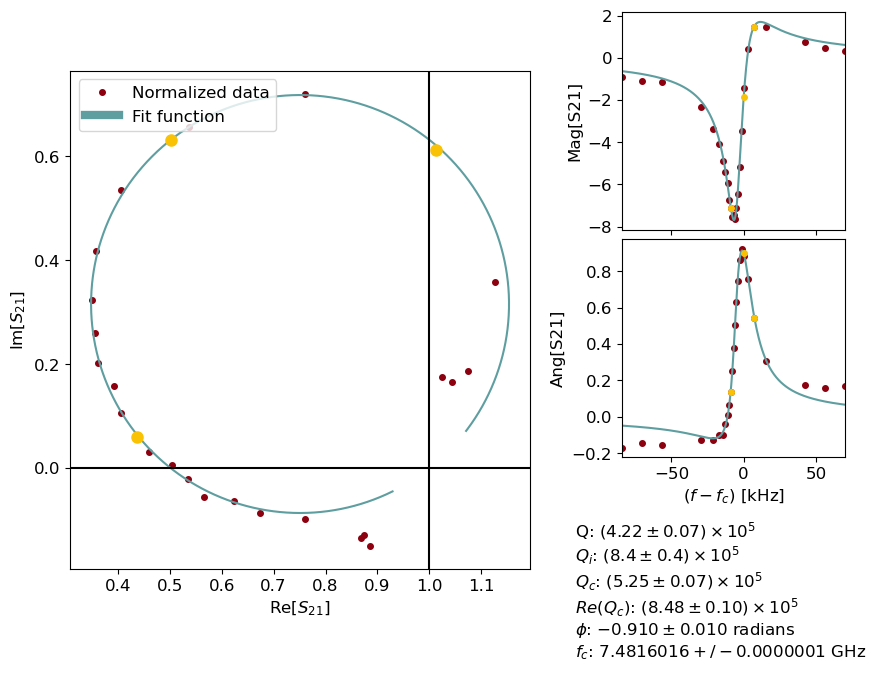

Saved fit results for frequency 7481.598000 MHz, power -28 dBm to CSV
Fit parameters: [881034.4136 826758.376       0.          0.4059]
Averaging factor: 0.097
Pin -88.0, N photons: 3.02e+05, navg: 5
Next time: 0.02 min, q_adj: 0.973
7481595512.577375
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: -inf


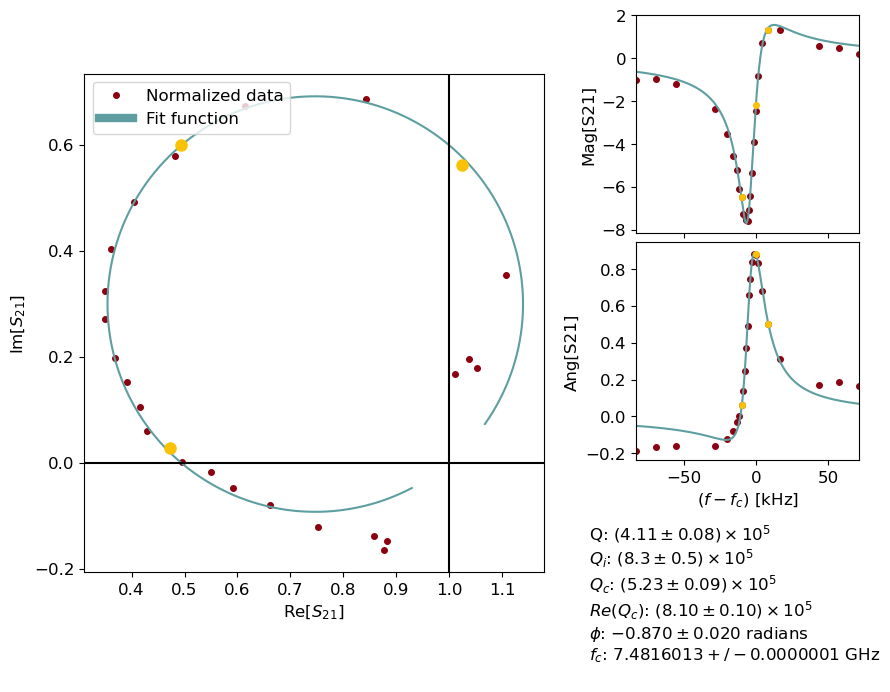

Saved fit results for frequency 7481.598000 MHz, power -32 dBm to CSV
Fit parameters: [870989.7821 826645.3807      0.          0.4106]
Averaging factor: 0.243
Pin -92.0, N photons: 1.14e+05, navg: 13
Next time: 0.05 min, q_adj: 0.972
7481595512.577375
Time elapsed: 0.27 min, expected time: 0.12 min
Qi err: -inf


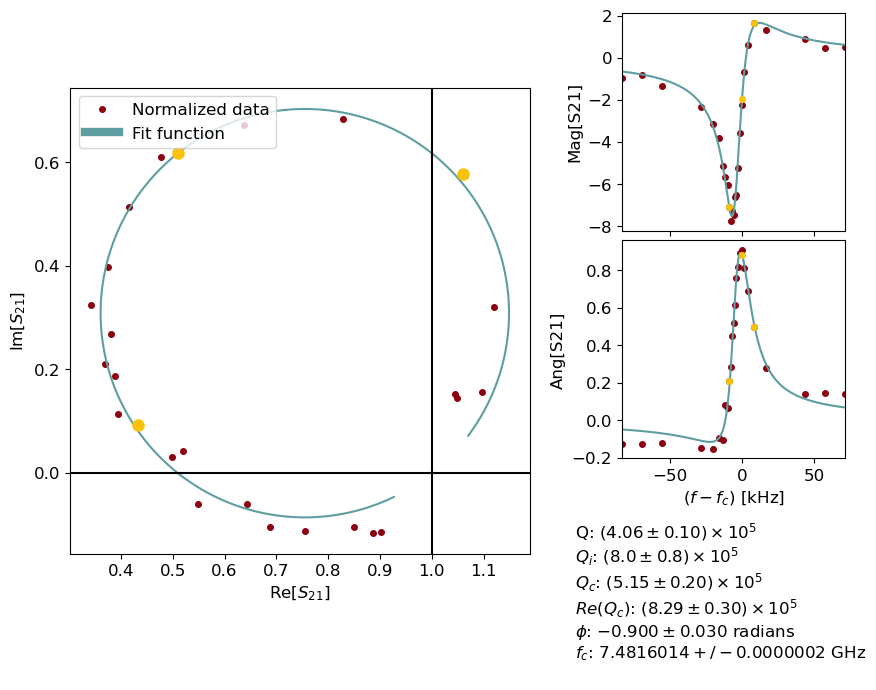

Saved fit results for frequency 7481.596000 MHz, power -36 dBm to CSV
Fit parameters: [853960.0029 821281.8416      0.          0.4115]
Averaging factor: 0.610
Pin -96.0, N photons: 4.51e+04, navg: 31
Next time: 0.13 min, q_adj: 0.990
7481593617.035318
Time elapsed: 0.27 min, expected time: 0.13 min
Qi err: -inf


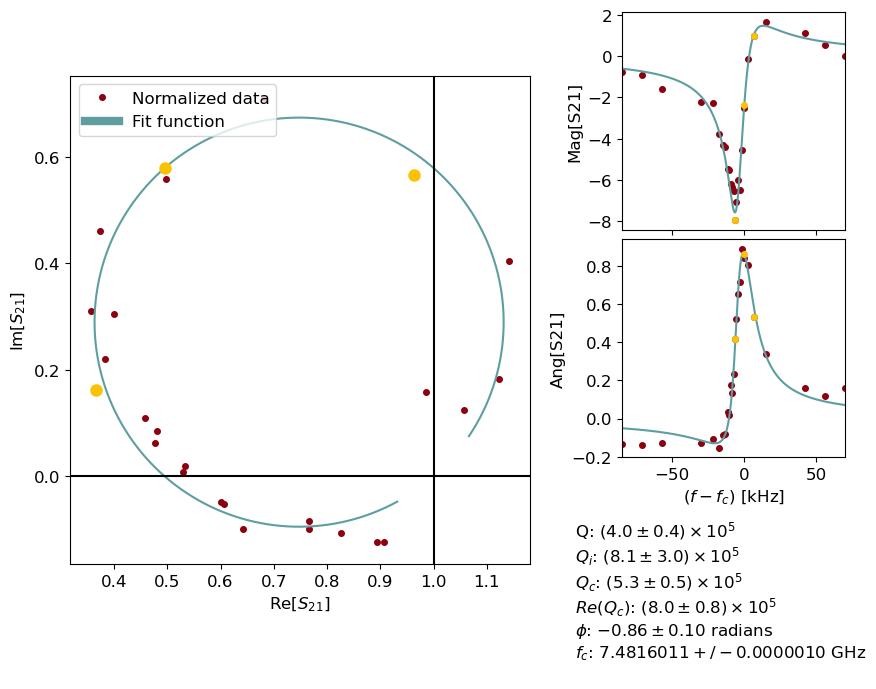

Saved fit results for frequency 7481.596000 MHz, power -40 dBm to CSV
Fit parameters: [855721.0667 821391.4539      0.          0.4191]
Averaging factor: 1.532
Pin -100.0, N photons: 1.74e+04, navg: 77
Next time: 0.32 min, q_adj: 0.997
7481594544.831913
Time elapsed: 0.45 min, expected time: 0.32 min
Qi err: -inf


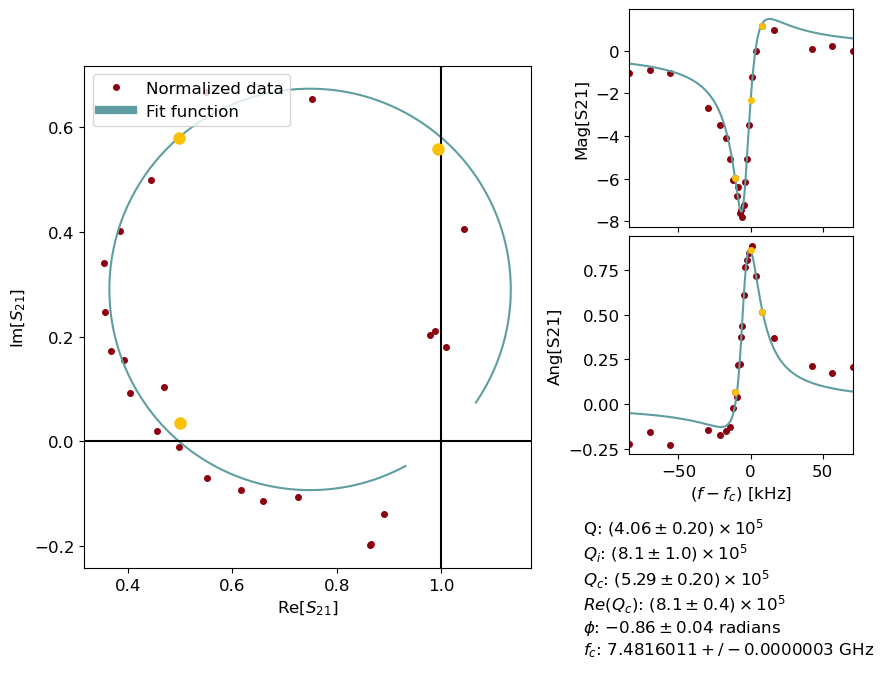

Saved fit results for frequency 7481.597000 MHz, power -44 dBm to CSV
Fit parameters: [880082.5216 819273.7626      0.          0.4338]
Averaging factor: 3.848
Pin -104.0, N photons: 6.96e+03, navg: 191
Next time: 0.80 min, q_adj: 1.003
7481595472.628589


Time elapsed: 0.89 min, expected time: 0.80 min
Qi err: -inf


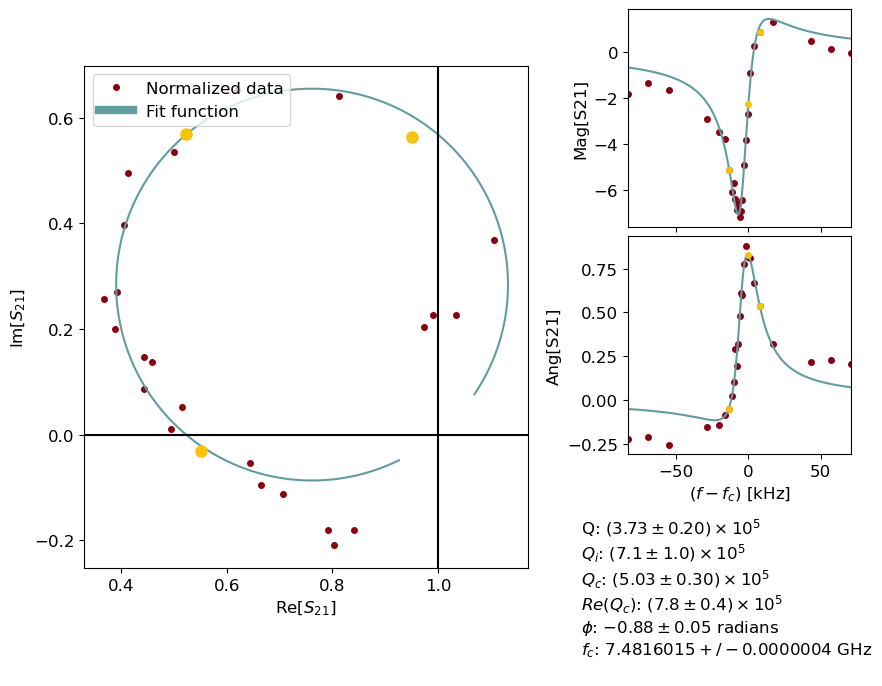

Saved fit results for frequency 7481.597000 MHz, power -48 dBm to CSV
Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Averaging factor: 9.667
Pin -108.0, N photons: 2.46e+03, navg: 572
Next time: 2.38 min, q_adj: 0.919
7481595472.628589
Time elapsed: 2.37 min, expected time: 2.38 min
Qi err: -inf


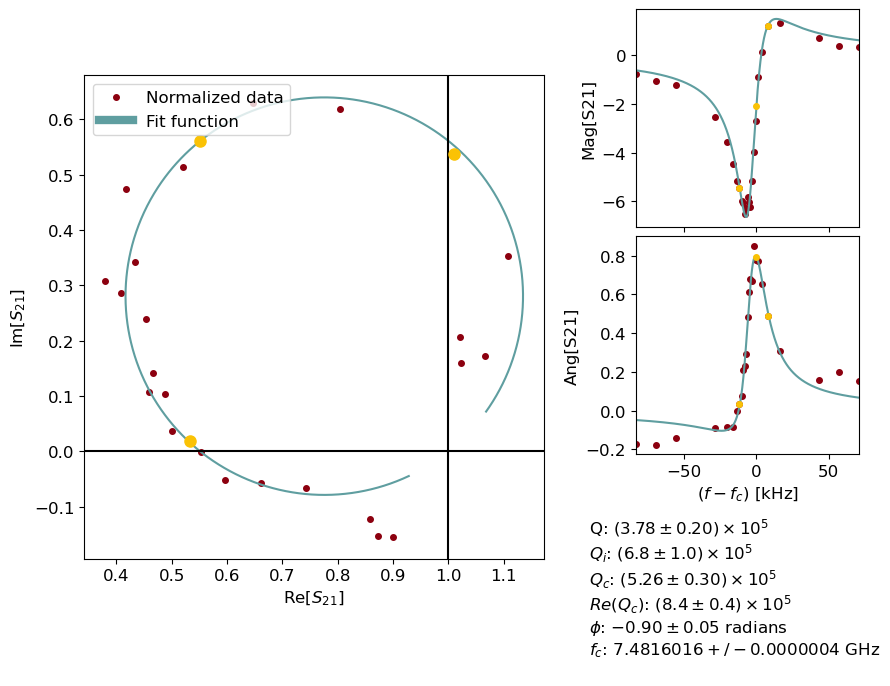

Saved fit results for frequency 7481.595000 MHz, power -52 dBm to CSV
Fit parameters: [  2976.5865 812794.4467      0.5652      1.9348]
Averaging factor: 24.282
Pin -112.0, N photons: 960, navg: 1184
Next time: 4.93 min, q_adj: 1.012
7481593577.08662


Time elapsed: 4.74 min, expected time: 4.93 min
Qi err: -inf


c:\Users\slab\anaconda3\lib\site-packages\lmfit\confidence.py:317: UserWarning: Bound reached with prob(Qc=498665.2909931106) = 0.858283924248701 < max(sigmas)
  warn(errmsg)
C:\_Lib\python\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in double_scalars
  Qc_Re_pos = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][2][1])


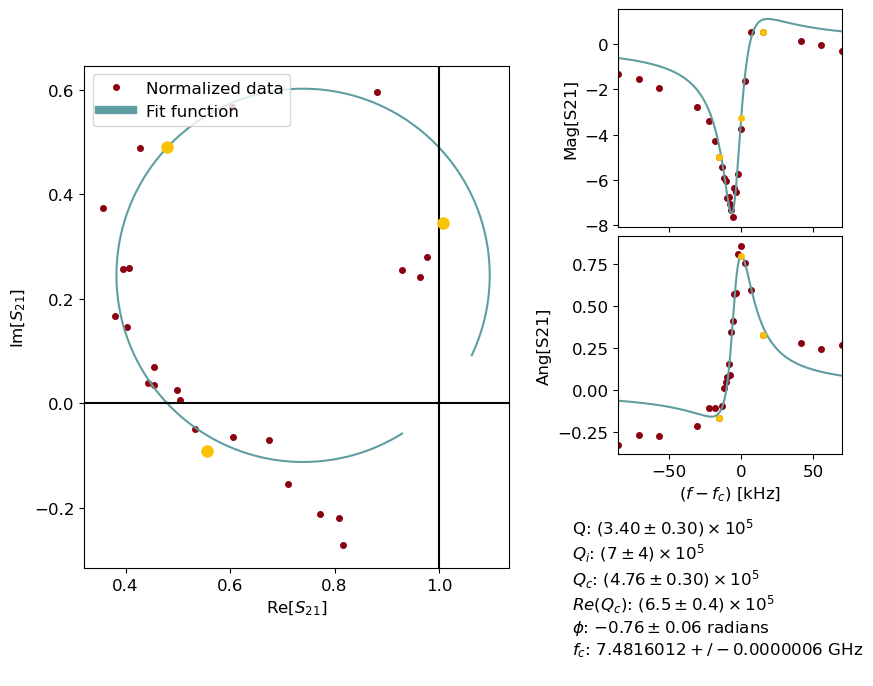

Saved fit results for frequency 7481.597000 MHz, power -56 dBm to CSV
Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Averaging factor: 60.993
Pin -116.0, N photons: 343, navg: 3754
Next time: 15.64 min, q_adj: 0.901
7481595472.628087
Time elapsed: 14.72 min, expected time: 15.64 min
Qi err: -inf


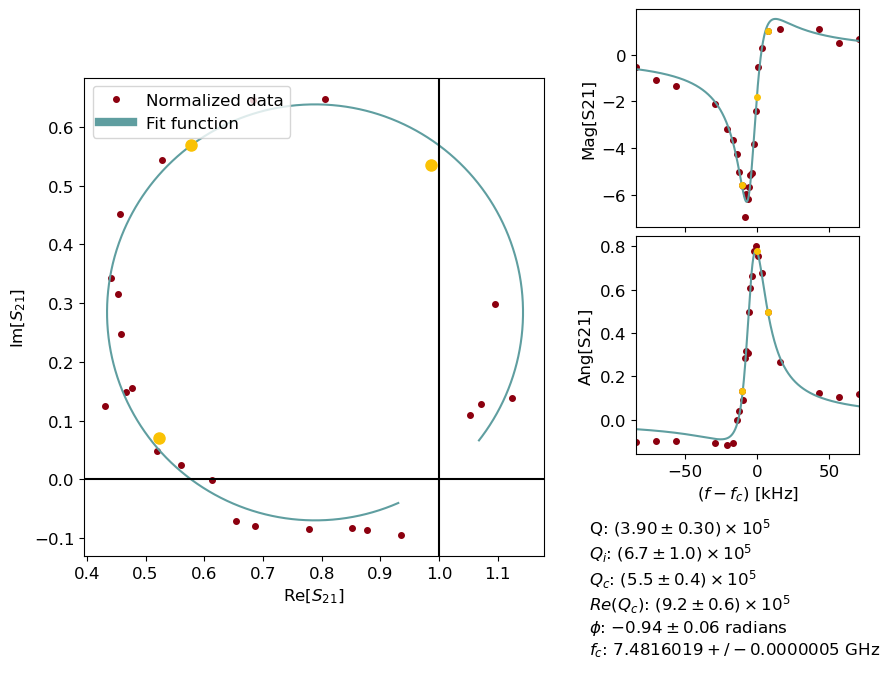

Saved fit results for frequency 7481.595000 MHz, power -60 dBm to CSV
Fit parameters: [4654254.227   811773.2479    2499.9785      31.0146]
Averaging factor: 153.206
Pin -120.0, N photons: 155, navg: 5828
Next time: 24.28 min, q_adj: 1.147
Stopping frequency 7.48159 GHz


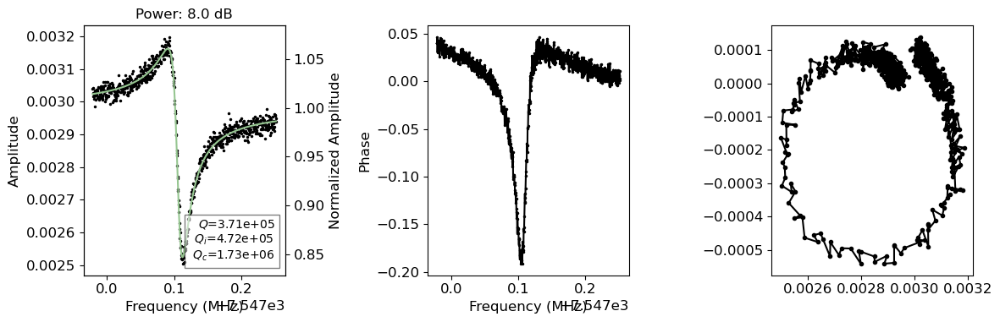

7547105715.021877
Time elapsed: 0.42 min, expected time: 0.20 min


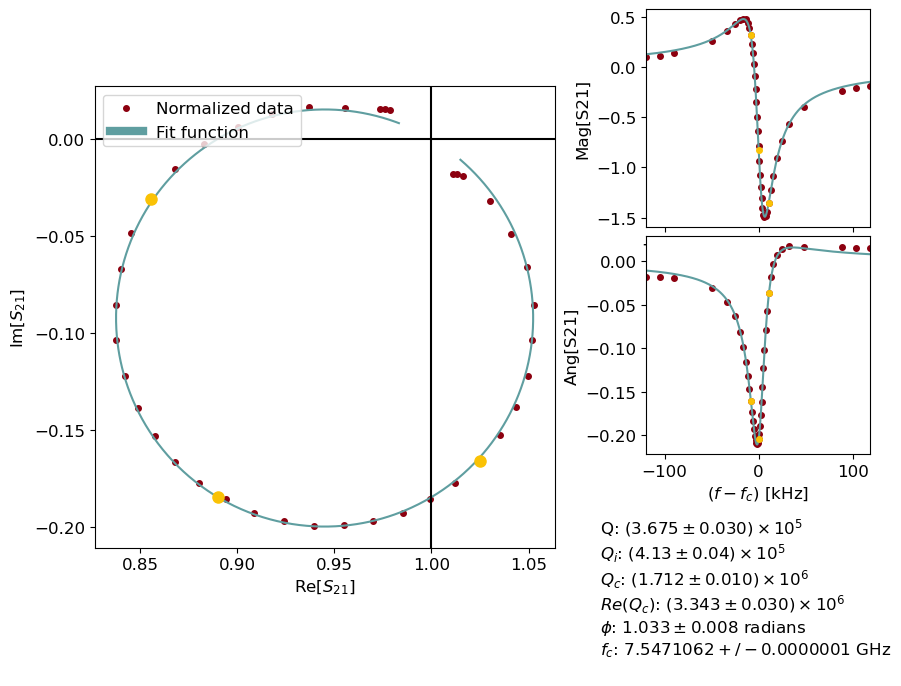

Saved fit results for frequency 7547.106000 MHz, power 8 dBm to CSV
Averaging factor: 0.001
Pin -52.0, N photons: 2.43e+08, navg: 0
Next time: 0.00 min, q_adj: 0.900
7547112443.943032
Time elapsed: 0.42 min, expected time: 0.20 min


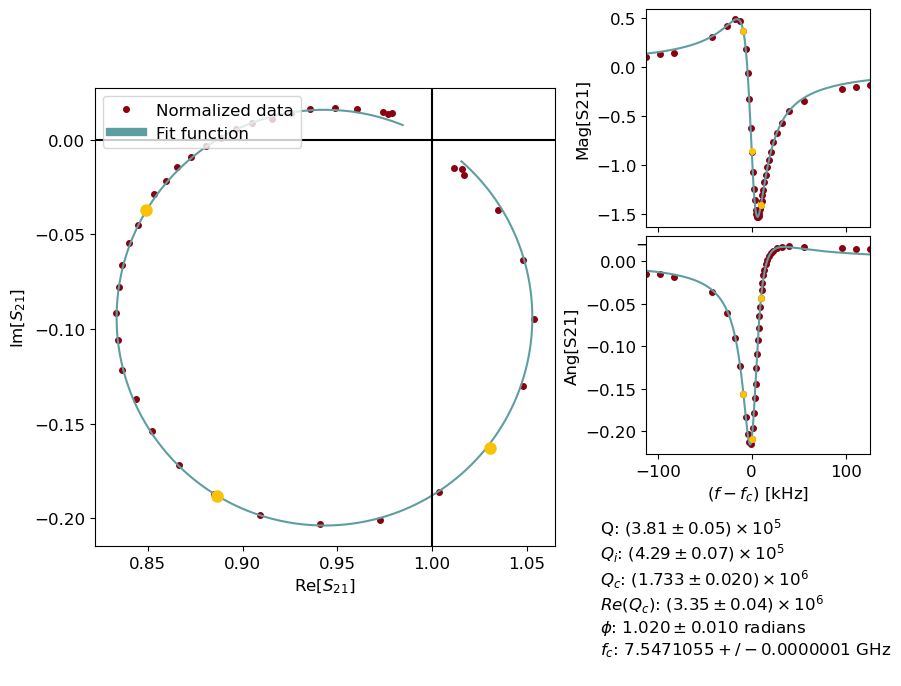

Saved fit results for frequency 7547.105000 MHz, power 4 dBm to CSV
Averaging factor: 0.001
Pin -56.0, N photons: 1.02e+08, navg: 0
Next time: 0.00 min, q_adj: 1.035
7547111272.821562
Time elapsed: 0.42 min, expected time: 0.20 min


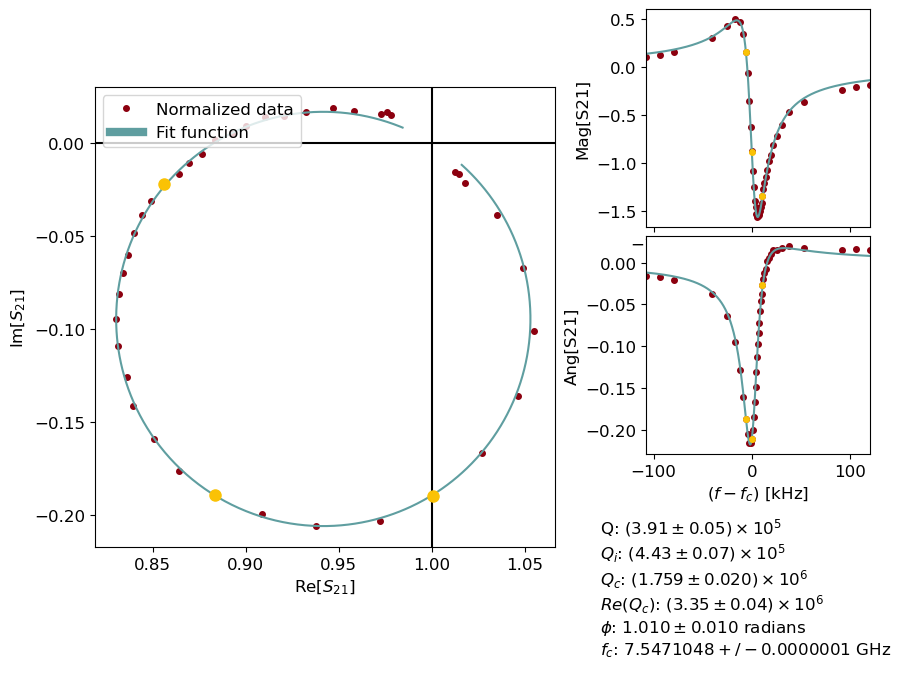

Saved fit results for frequency 7547.105000 MHz, power 0 dBm to CSV
Averaging factor: 0.004
Pin -60.0, N photons: 4.25e+07, navg: 0
Next time: 0.00 min, q_adj: 1.028
7547110151.711718
Time elapsed: 0.42 min, expected time: 0.20 min


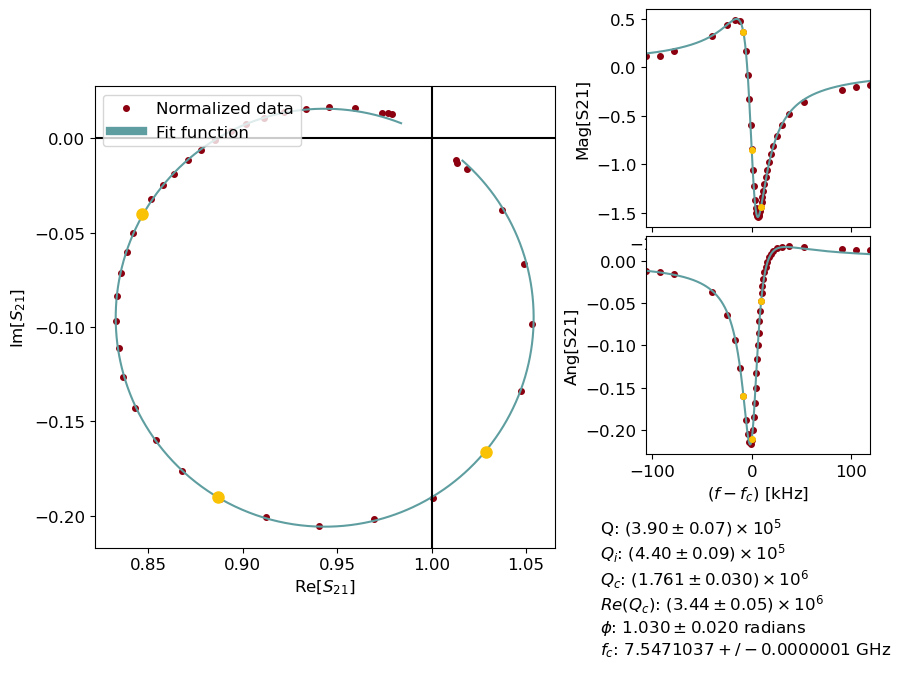

Saved fit results for frequency 7547.104000 MHz, power -4 dBm to CSV
Averaging factor: 0.009
Pin -64.0, N photons: 1.68e+07, navg: 0
Next time: 0.00 min, q_adj: 0.996
7547109785.572414
Time elapsed: 0.42 min, expected time: 0.20 min


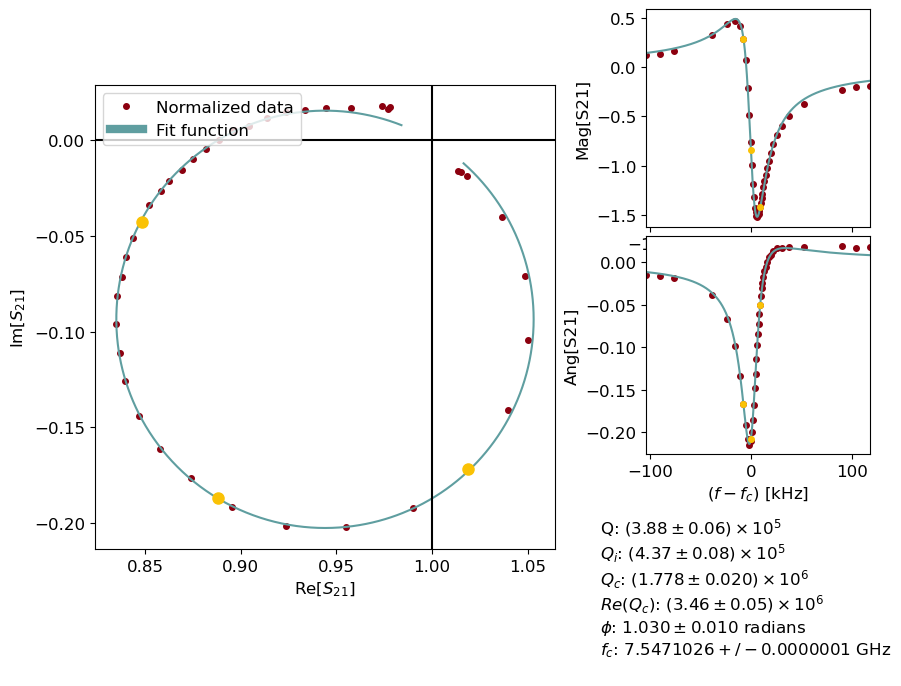

Saved fit results for frequency 7547.103000 MHz, power -8 dBm to CSV
Averaging factor: 0.024
Pin -68.0, N photons: 6.54e+06, navg: 1
Next time: 0.00 min, q_adj: 0.995
7547108693.089803
Time elapsed: 0.27 min, expected time: 0.12 min


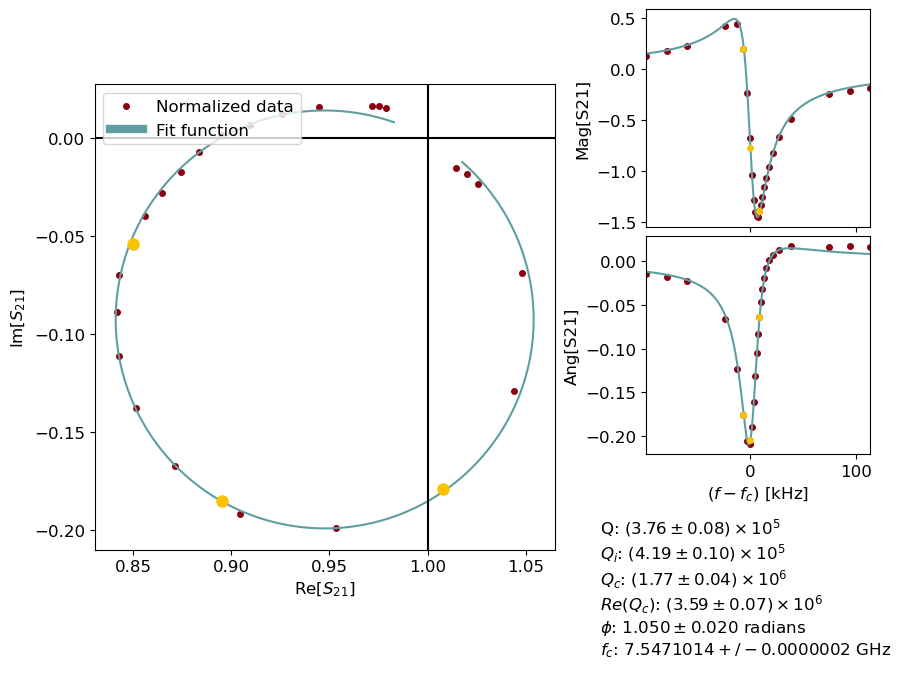

Saved fit results for frequency 7547.101000 MHz, power -12 dBm to CSV
Averaging factor: 0.063
Pin -72.0, N photons: 2.46e+06, navg: 3
Next time: 0.01 min, q_adj: 0.969
7547108693.089803
Time elapsed: 0.27 min, expected time: 0.12 min


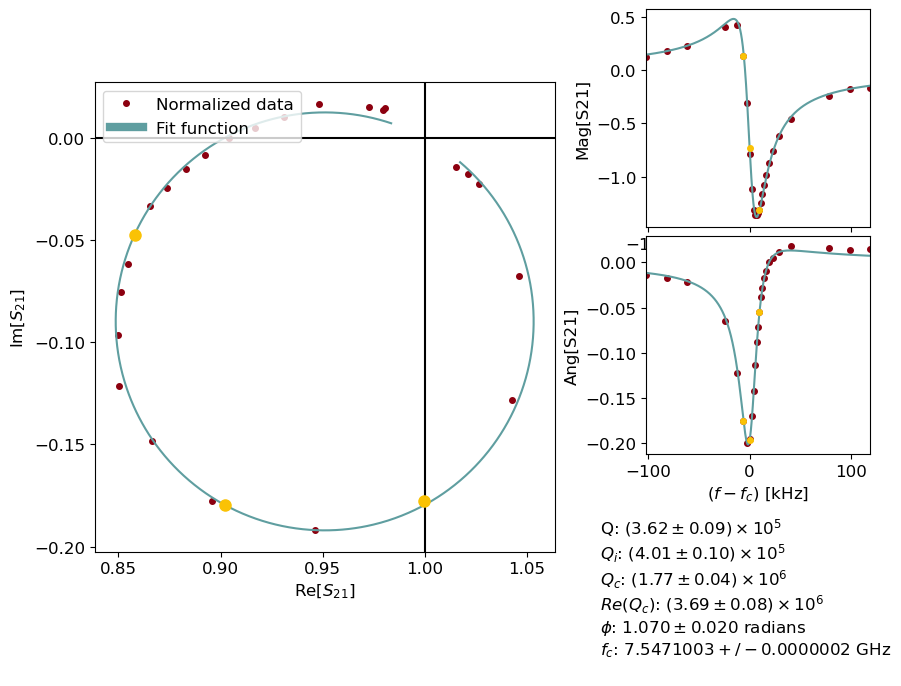

Saved fit results for frequency 7547.100000 MHz, power -16 dBm to CSV
Fit parameters: [     1.3176 432049.0291     40.6851      3.044 ]
Averaging factor: 0.171
Pin -76.0, N photons: 9.07e+05, navg: 9
Next time: 0.04 min, q_adj: 0.962
7547107376.077816
Time elapsed: 0.27 min, expected time: 0.12 min


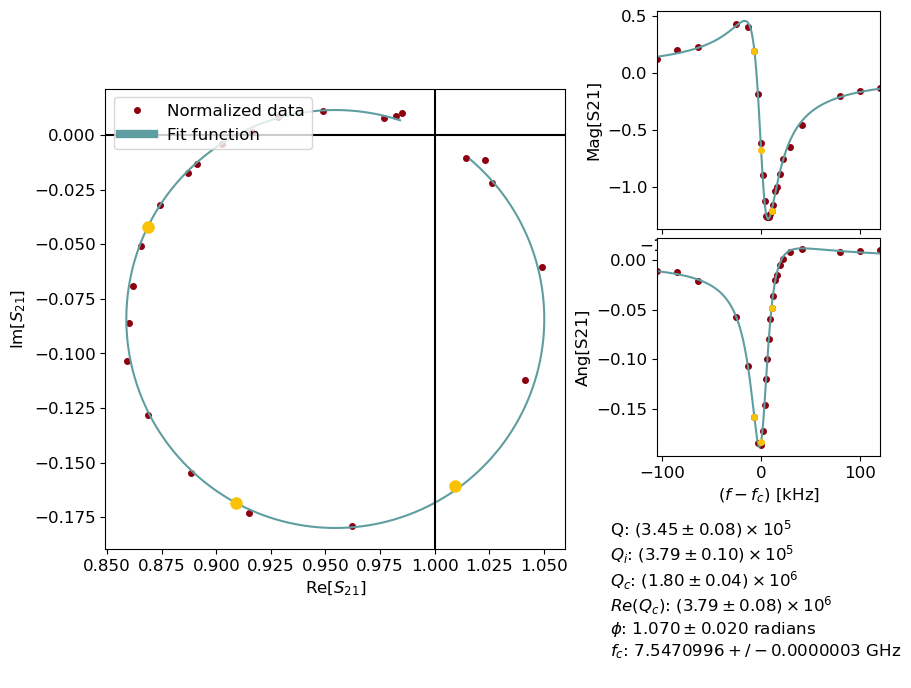

Saved fit results for frequency 7547.100000 MHz, power -20 dBm to CSV
Fit parameters: [   872.3089 432756.8688     28.1259      1.7363]
Averaging factor: 0.482
Pin -80.0, N photons: 3.22e+05, navg: 27
Next time: 0.11 min, q_adj: 0.953
7547106017.854883
Time elapsed: 0.26 min, expected time: 0.12 min
Qi err: 0.011261656150300016


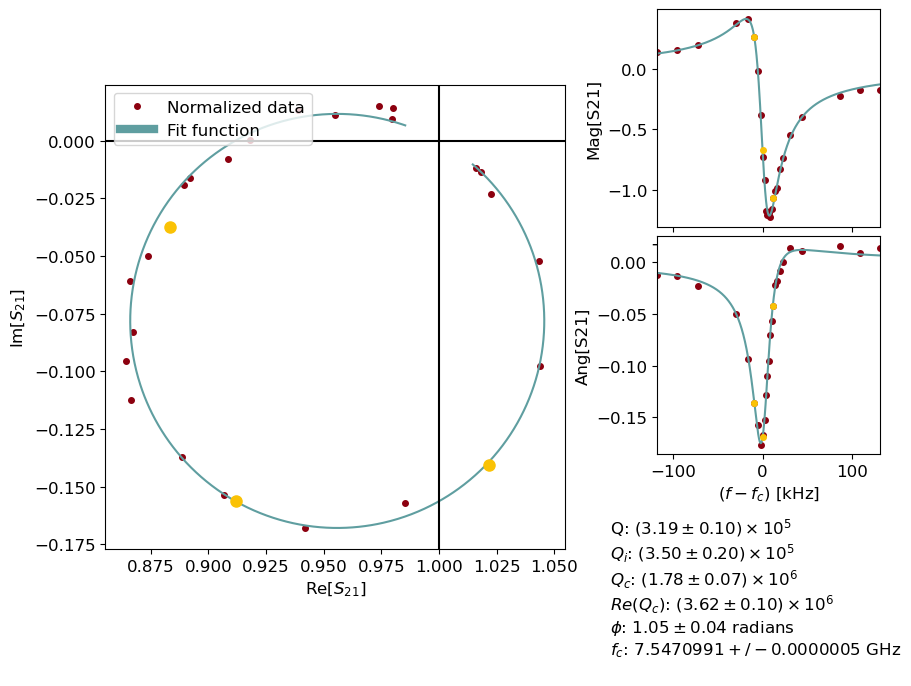

Saved fit results for frequency 7547.099000 MHz, power -24 dBm to CSV
Fit parameters: [1703840.648   432672.1466  238922.9152       2.0017]
Averaging factor: 1.341
Pin -84.0, N photons: 1.12e+05, navg: 78
Next time: 0.33 min, q_adj: 0.928
7547107510.858669
Time elapsed: 0.45 min, expected time: 0.33 min
Qi err: 0.01358409267861123


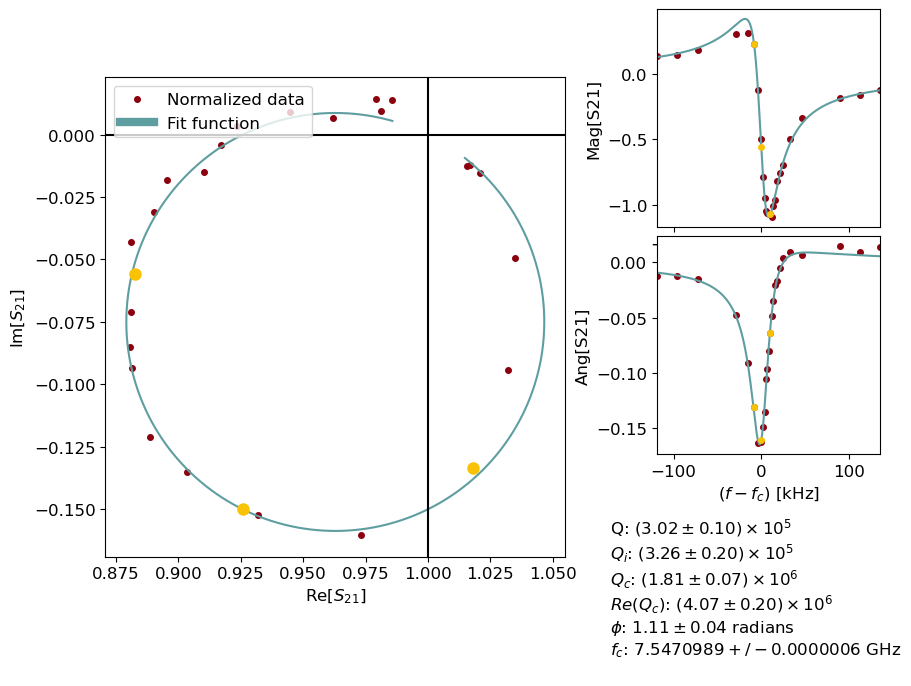

Saved fit results for frequency 7547.099000 MHz, power -28 dBm to CSV
Fit parameters: [1262525.1505  433344.6184  119569.6664       1.6269]
Averaging factor: 4.068
Pin -88.0, N photons: 3.92e+04, navg: 227
Next time: 0.95 min, q_adj: 0.946
7547110631.243249
Time elapsed: 1.03 min, expected time: 0.95 min
Qi err: 0.010913435011424142


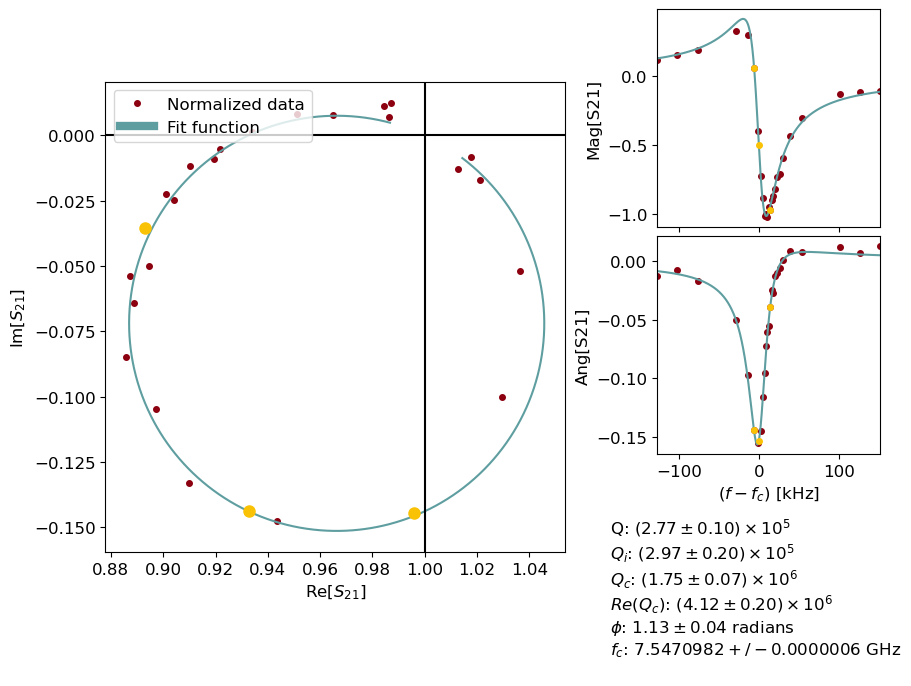

Saved fit results for frequency 7547.099000 MHz, power -32 dBm to CSV
Fit parameters: [887491.6316 434859.9591  44075.5354      1.2733]
Averaging factor: 11.773
Pin -92.0, N photons: 1.36e+04, navg: 699
Next time: 2.91 min, q_adj: 0.918
7547108952.614862
Time elapsed: 2.86 min, expected time: 2.91 min
Qi err: 0.012133876119830972


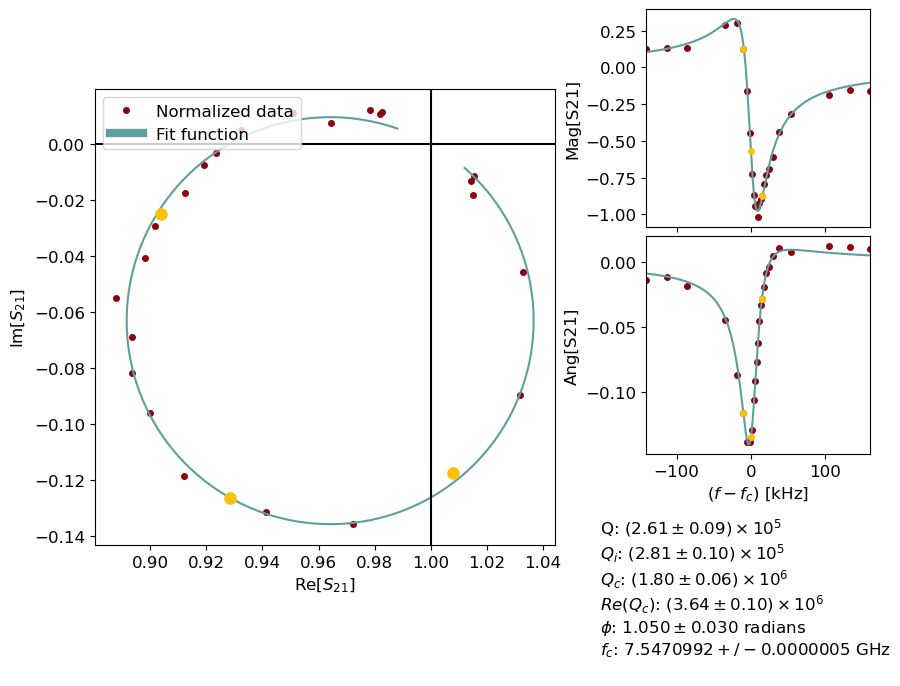

Saved fit results for frequency 7547.099000 MHz, power -36 dBm to CSV
Fit parameters: [769801.232  435798.624   27715.721       1.1552]
Averaging factor: 33.482
Pin -96.0, N photons: 4.64e+03, navg: 1892
Next time: 7.88 min, q_adj: 0.941
7547108952.614862
Time elapsed: 7.49 min, expected time: 7.88 min
Qi err: 0.013251506669790353


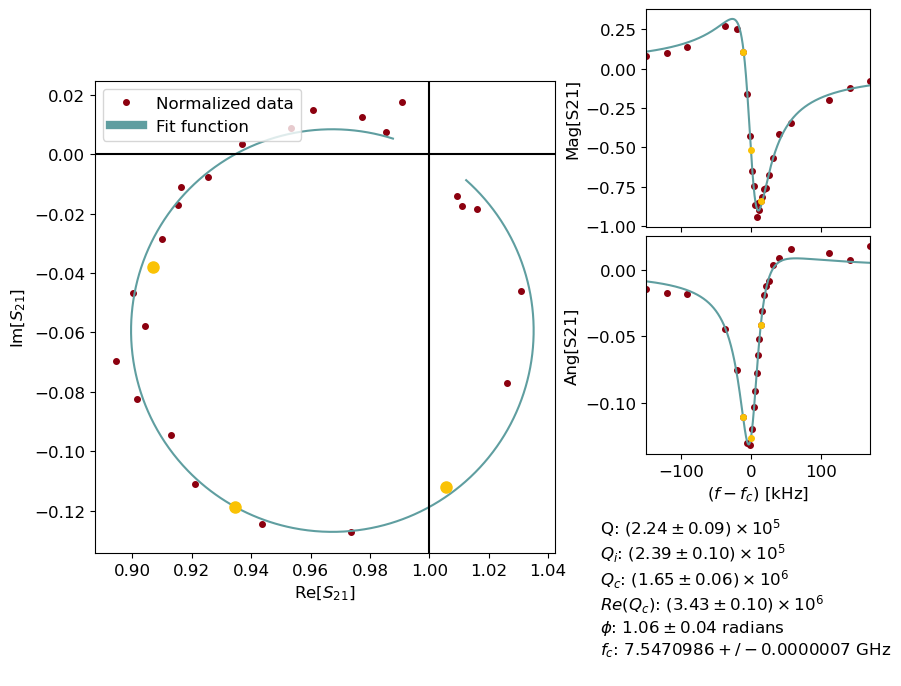

Saved fit results for frequency 7547.099000 MHz, power -40 dBm to CSV
Fit parameters: [488781.2034 440316.2164   4840.6852      0.8618]
Averaging factor: 100.378
Pin -100.0, N photons: 1.48e+03, navg: 6806
Next time: 28.36 min, q_adj: 0.859
7547107035.364796
Time elapsed: 26.56 min, expected time: 28.36 min
Qi err: 0.0113164619254466


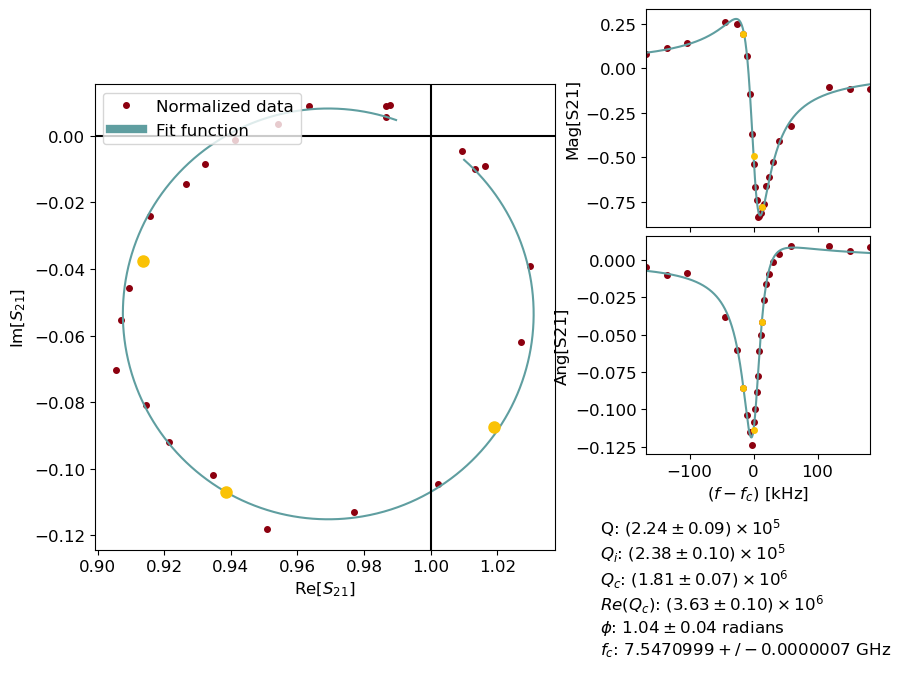

Saved fit results for frequency 7547.099000 MHz, power -44 dBm to CSV
Fit parameters: [483885.5258 440431.5498   4641.5175      0.857 ]
Averaging factor: 284.078
Pin -104.0, N photons: 536, navg: 14281
Next time: 59.50 min, q_adj: 0.997
Stopping frequency 7.54711 GHz


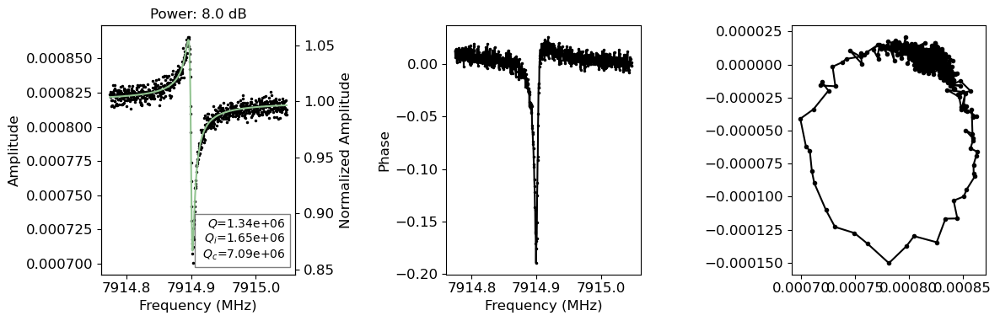

7914900078.45172
Time elapsed: 0.42 min, expected time: 0.20 min


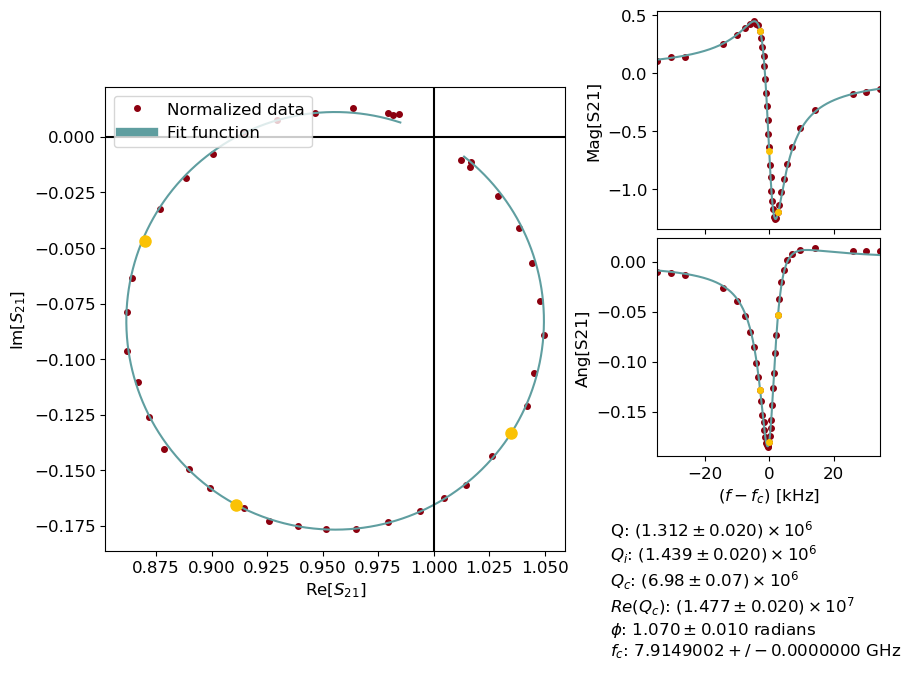

Saved fit results for frequency 7914.900000 MHz, power 8 dBm to CSV
Averaging factor: 0.002
Pin -52.0, N photons: 3.5e+08, navg: 0
Next time: 0.00 min, q_adj: 0.900
7914902037.186225
Time elapsed: 0.42 min, expected time: 0.20 min


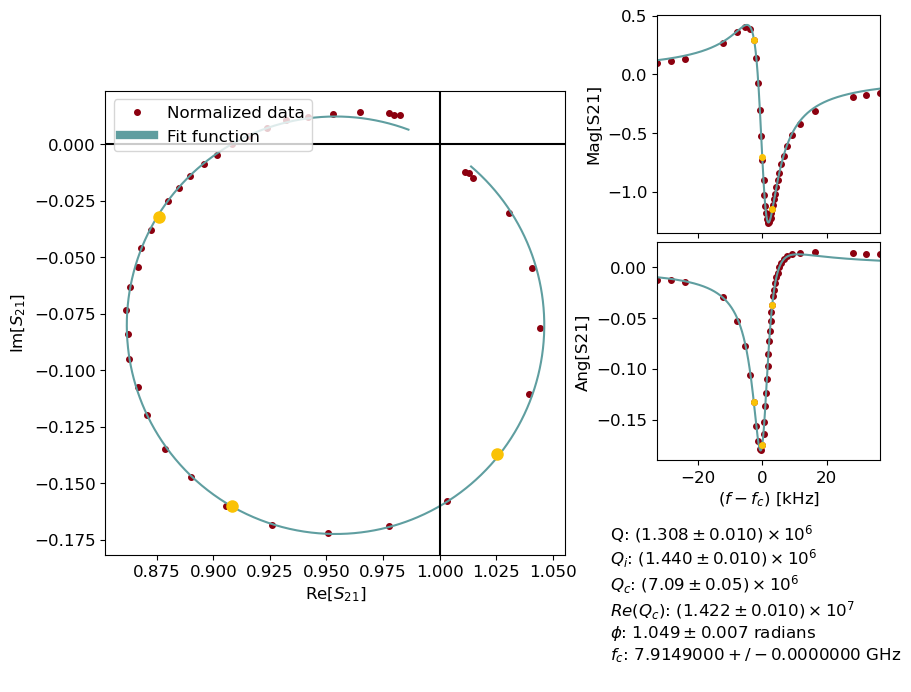

Saved fit results for frequency 7914.900000 MHz, power 4 dBm to CSV
Averaging factor: 0.004
Pin -56.0, N photons: 1.37e+08, navg: 0
Next time: 0.00 min, q_adj: 0.997
7914901924.0610895
Time elapsed: 0.42 min, expected time: 0.20 min


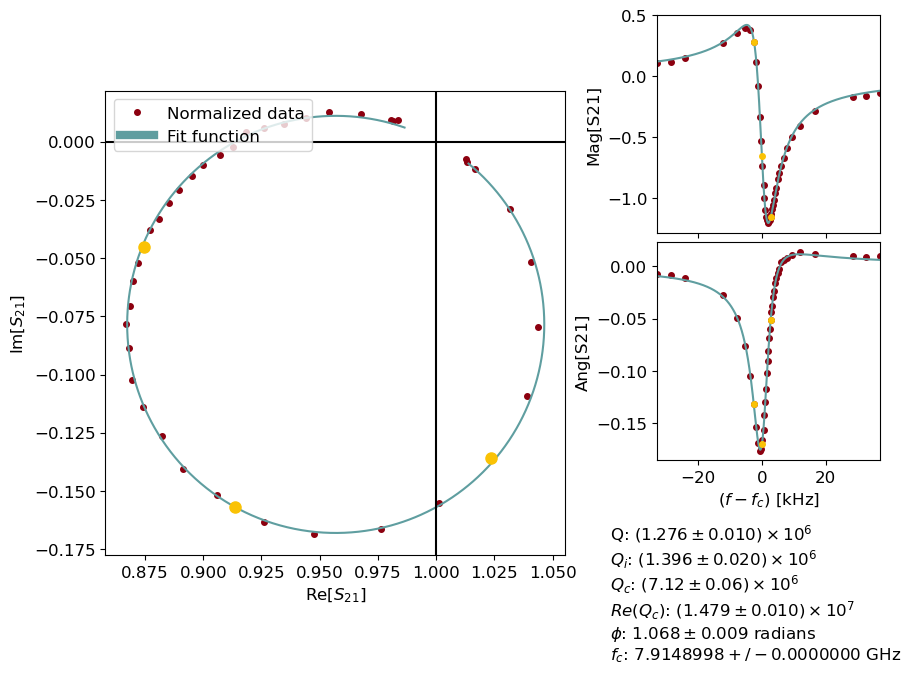

Saved fit results for frequency 7914.900000 MHz, power 0 dBm to CSV
Averaging factor: 0.011
Pin -60.0, N photons: 5.15e+07, navg: 1
Next time: 0.00 min, q_adj: 0.975
7914901578.508613
Time elapsed: 0.42 min, expected time: 0.20 min


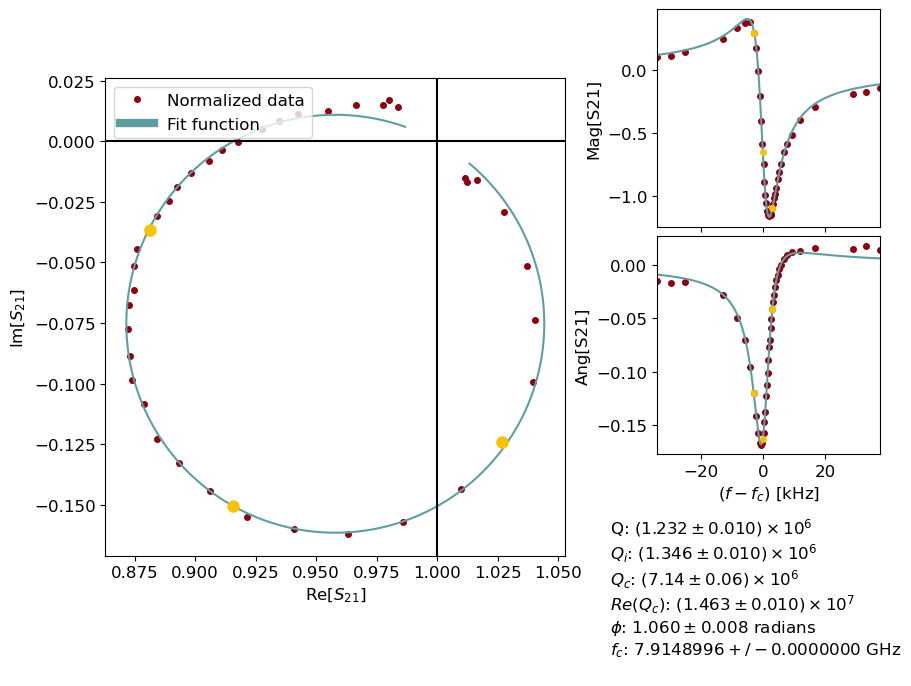

Saved fit results for frequency 7914.900000 MHz, power -4 dBm to CSV
Averaging factor: 0.030
Pin -64.0, N photons: 1.91e+07, navg: 2
Next time: 0.01 min, q_adj: 0.966
7914901696.017336
Time elapsed: 0.42 min, expected time: 0.20 min


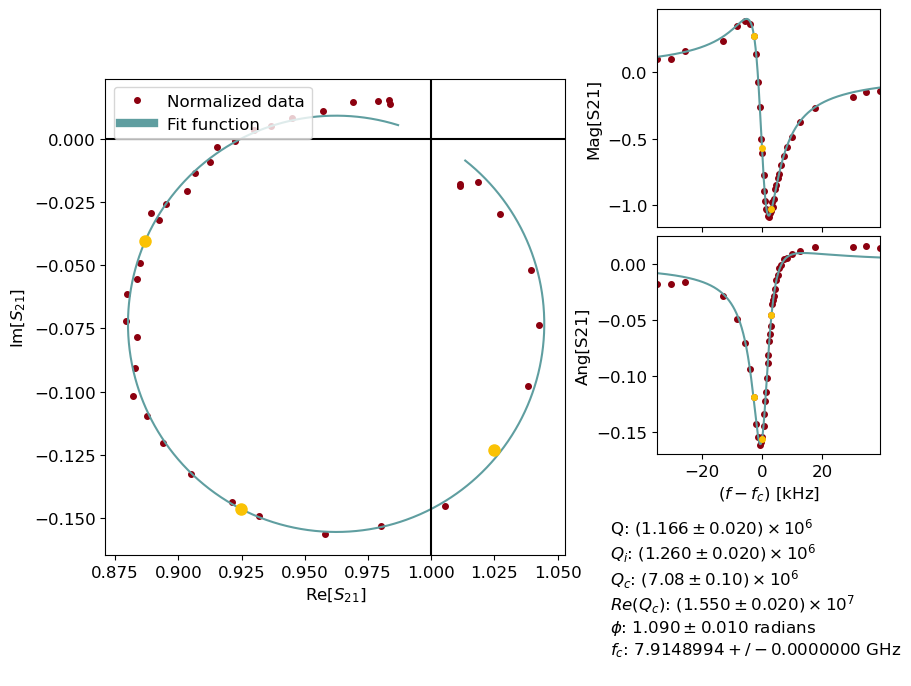

Saved fit results for frequency 7914.899000 MHz, power -8 dBm to CSV
Averaging factor: 0.081
Pin -68.0, N photons: 6.86e+06, navg: 5
Next time: 0.02 min, q_adj: 0.946
7914901817.115806
Time elapsed: 0.27 min, expected time: 0.12 min


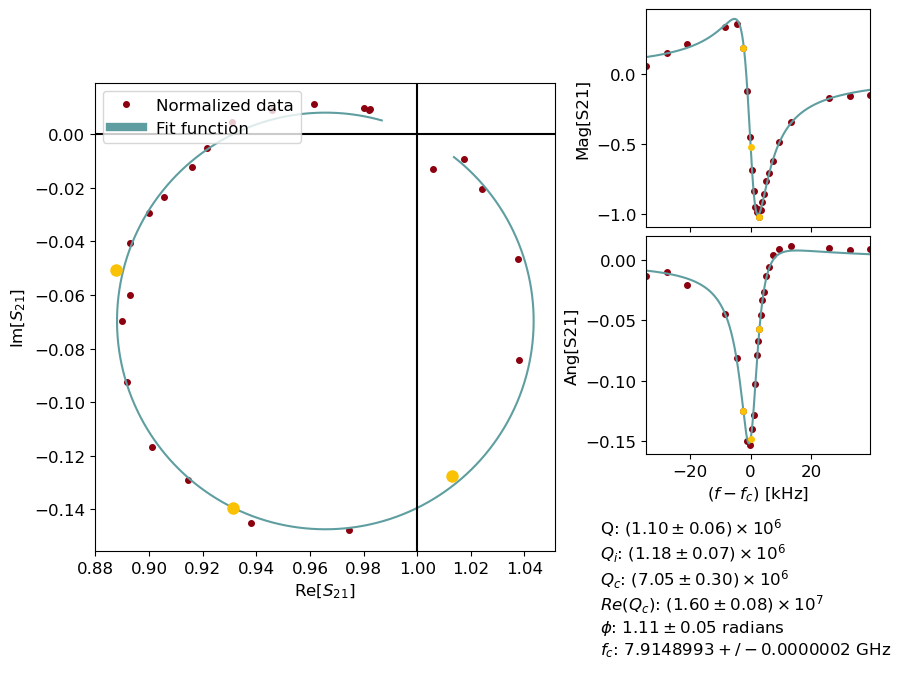

Saved fit results for frequency 7914.899000 MHz, power -12 dBm to CSV
Averaging factor: 0.236
Pin -72.0, N photons: 2.42e+06, navg: 13
Next time: 0.05 min, q_adj: 0.940
7914902260.672719
Time elapsed: 0.27 min, expected time: 0.12 min


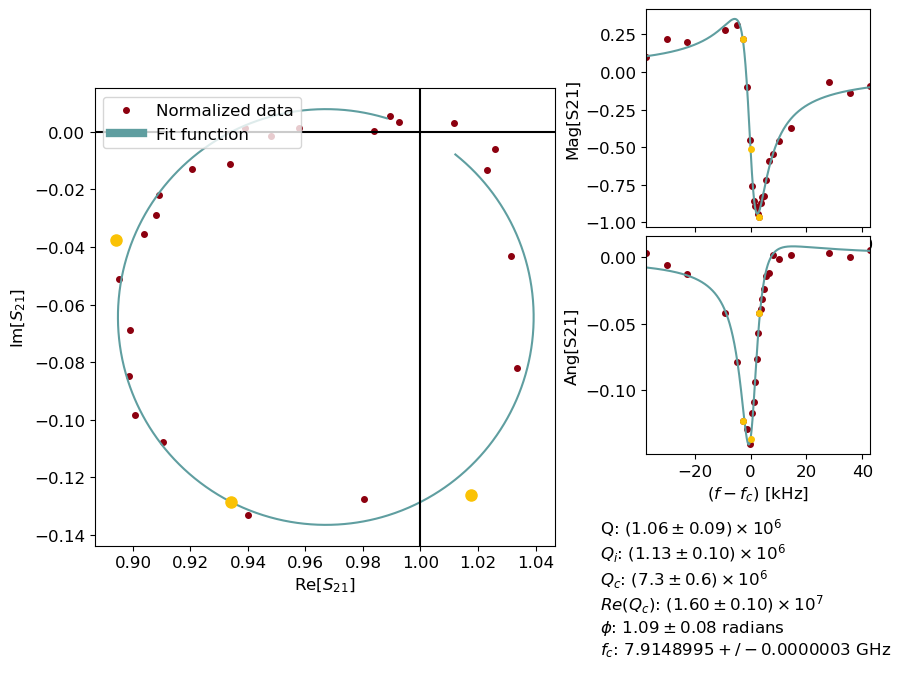

Saved fit results for frequency 7914.900000 MHz, power -16 dBm to CSV
Fit parameters: [4768690.7415 1461303.5242 3442158.6391       1.4459]
Averaging factor: 0.635
Pin -76.0, N photons: 8.67e+05, navg: 34
Next time: 0.14 min, q_adj: 0.967
7914902740.132054
Time elapsed: 0.28 min, expected time: 0.14 min


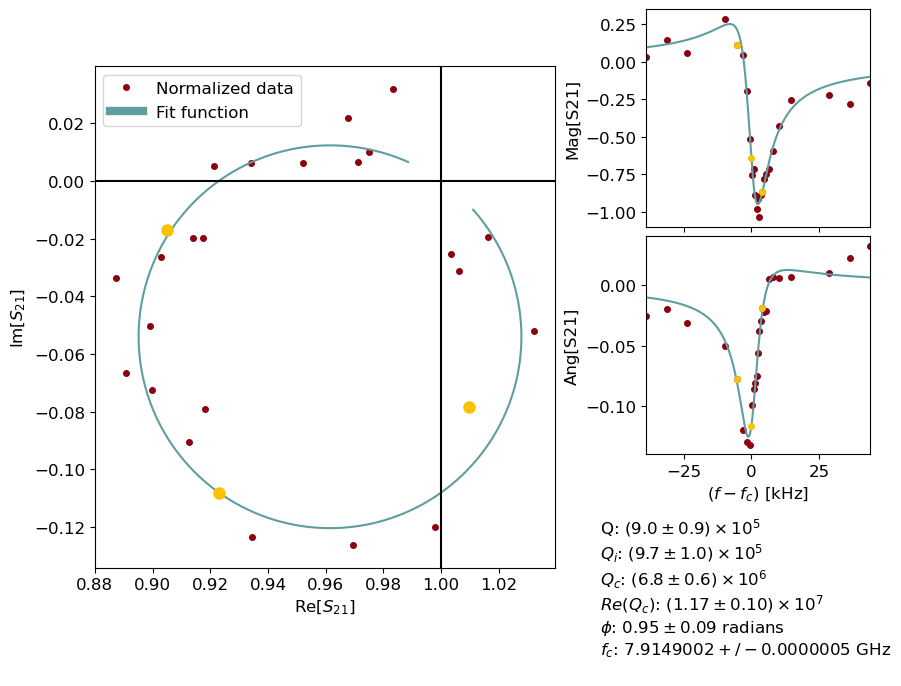

Saved fit results for frequency 7914.900000 MHz, power -20 dBm to CSV
Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Averaging factor: 2.054
Pin -80.0, N photons: 2.7e+05, navg: 141
Next time: 0.59 min, q_adj: 0.852
7914903234.545028
Time elapsed: 0.70 min, expected time: 0.59 min
Qi err: 0.02324127974522631


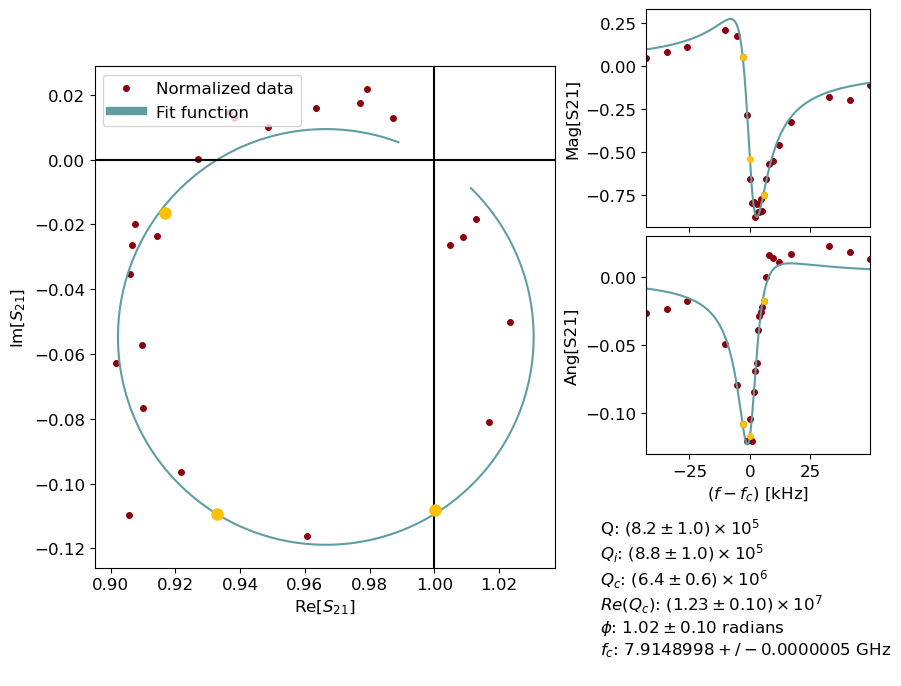

Saved fit results for frequency 7914.900000 MHz, power -24 dBm to CSV
Fit parameters: [ 791549.466  1544856.1604    5814.2451       0.6272]
Averaging factor: 5.531
Pin -84.0, N photons: 9.5e+04, navg: 331
Next time: 1.38 min, q_adj: 0.913
7914902102.517188
Time elapsed: 1.44 min, expected time: 1.38 min
Qi err: 0.034480151227955634


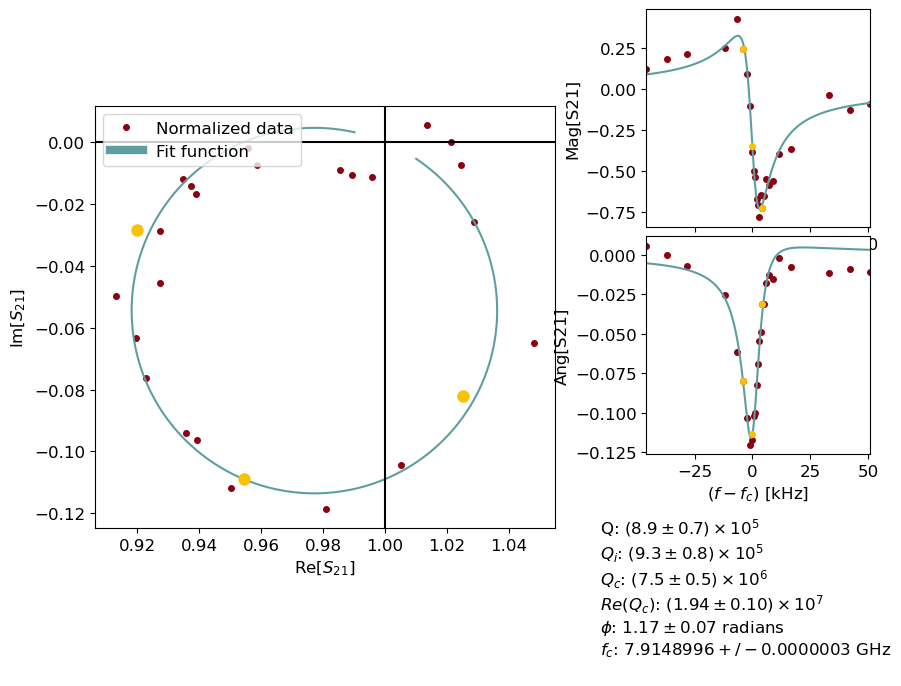

Saved fit results for frequency 7914.900000 MHz, power -28 dBm to CSV
Fit parameters: [2094227.9827 1488488.5693  276412.8058       0.8986]
Averaging factor: 15.773
Pin -88.0, N photons: 3.74e+04, navg: 681
Next time: 2.84 min, q_adj: 1.076
7914902681.876052
Time elapsed: 2.79 min, expected time: 2.84 min
Qi err: 0.03541857629184045


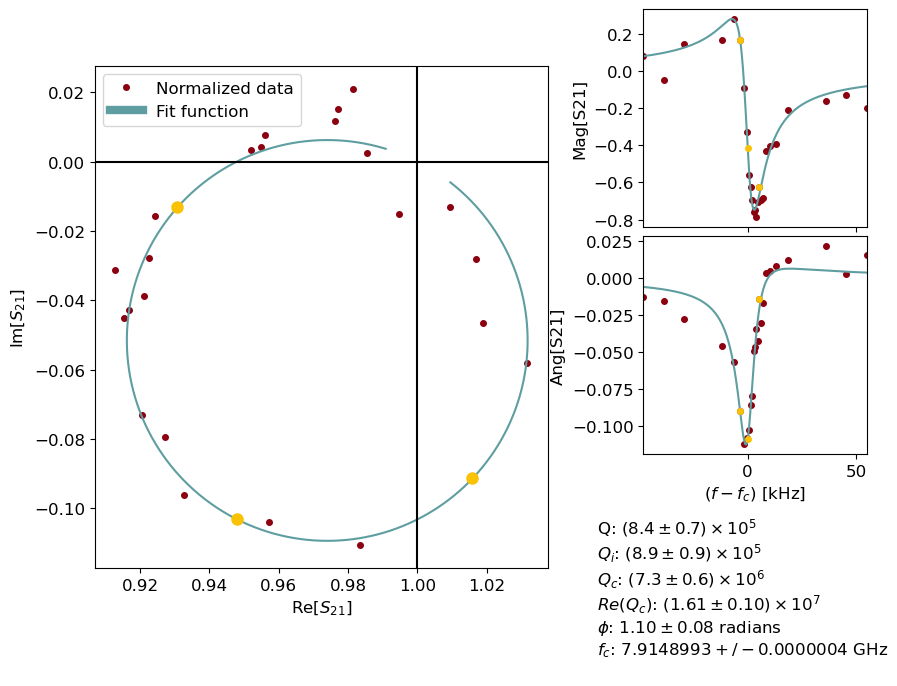

Saved fit results for frequency 7914.900000 MHz, power -32 dBm to CSV
Fit parameters: [2122615.6384 1486695.9866  291064.9561       0.9103]
Averaging factor: 42.444
Pin -92.0, N photons: 1.38e+04, navg: 2359
Next time: 9.83 min, q_adj: 0.949
7914903299.178559
Time elapsed: 9.30 min, expected time: 9.83 min
Qi err: 0.029696948491681394


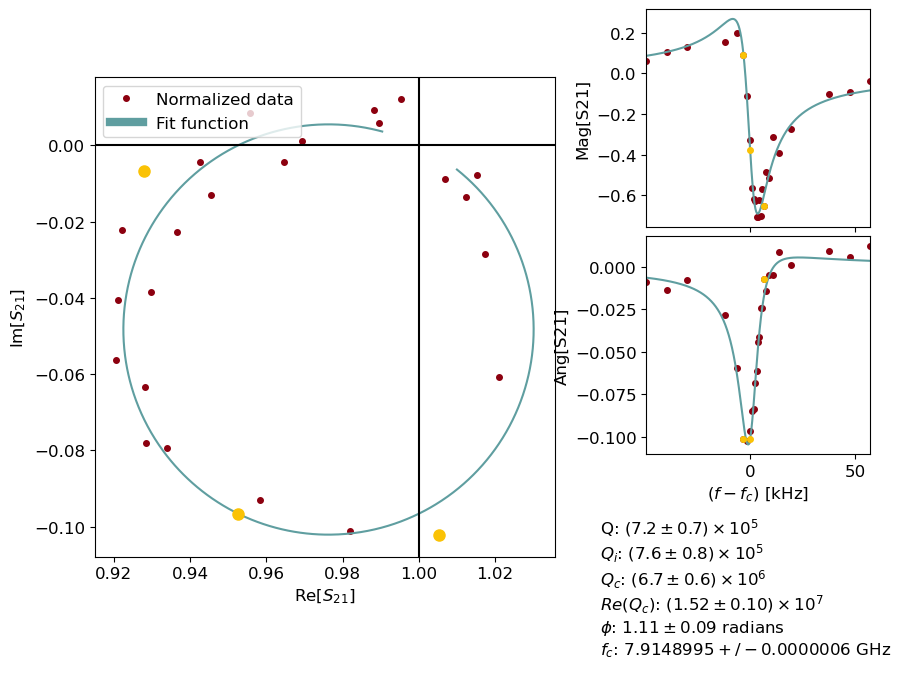

Saved fit results for frequency 7914.900000 MHz, power -36 dBm to CSV
Fit parameters: [1546733.2774 1560865.6281   68228.2804       0.6282]
Averaging factor: 126.578
Pin -96.0, N photons: 4.41e+03, navg: 8577
Next time: 35.74 min, q_adj: 0.859
7914903299.178559
Time elapsed: 33.44 min, expected time: 35.74 min
Qi err: 0.03449280892013952


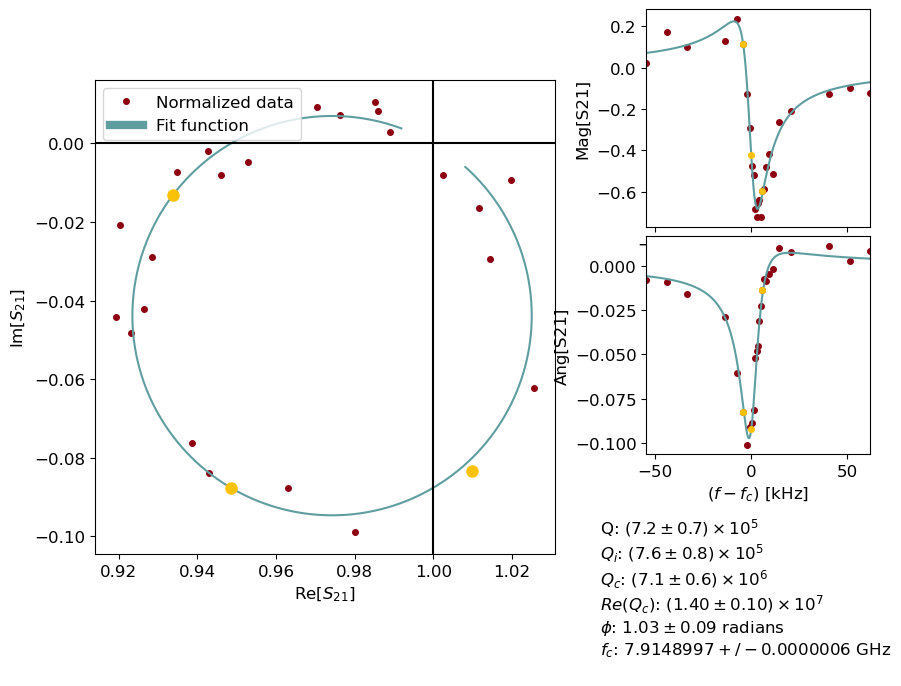

Saved fit results for frequency 7914.900000 MHz, power -40 dBm to CSV
Fit parameters: [1400465.4136 1590721.4041   39538.7793       0.5655]
Averaging factor: 335.014
Pin -100.0, N photons: 1.66e+03, navg: 16677
Next time: 69.49 min, q_adj: 1.002
Stopping frequency 7.91490 GHz


In [46]:
#freq_list = res_list[5:]
freq_list=res_freqs
freq_list = res_freqs[-1:]
#freq_list = [6004000869.385187]
slope=0

#JPA
freq_list = [6004145045.045045,
 6369915015.015015,
 6834455055.055055,
 7509234234.234234,
 7541984984.984985,
 7914015015.015015,
 7922753753.753754]

#slab
freq_list = [6005231131.131131,
 6368128228.228229,
 6833429029.029029,
 7481591591.591592,
 7547115115.115115,
 7914910910.910911]

att = 60 #102#-25.57
nvals = 18
for i in range(1):
    custom_config = {"freqs":np.array(freq_list), 
                 "att":att,
                 'type':'single',#'single , lin',
                 'base_path':base_path, 
                 'bandwidth':100,
                 "db_slope":8,
                 'slope':slope,
                 "span_inc":7,
                 'nvals':nvals,
                 "pow_start":8,
                 "avg_corr":50,#0.12,#12,
                 'spar':spar,
                 'npoints':25, 
                 'pow_inc':-4, 
                 'comment':'first try'}
#custom_config = {"freqs":np.array(freq_list), "att":50,'type':'lin','base_path':base_path, 'nvals':21,"pow_start":0}
    # Update default config with custom values
    config = vna_measurement.get_default_power_sweep_config(custom_config)
    results = vna_measurement.power_sweep_v2(config, VNA)
    vna_measurement.write_hp_csv(results, config)


## Fast version

Comment saved to G:/My Drive/Projects/Materials/Data/250602-ResSil6TaSQ/power_sweep_20250603_143249\comment.txt


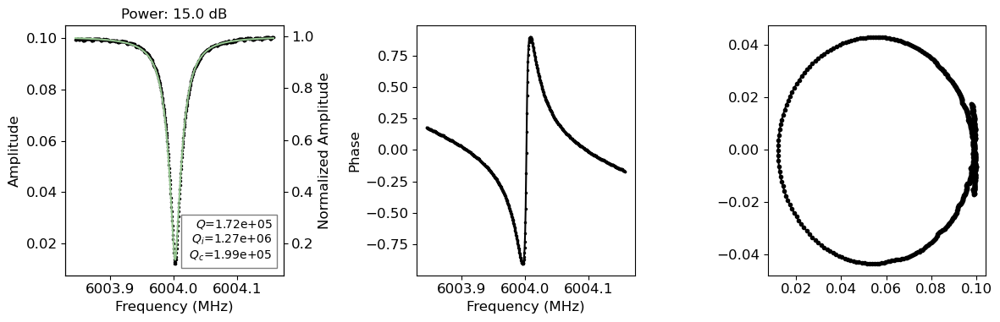

KeyboardInterrupt: 

In [42]:
freq_list = [6004000869.385187,
 6328492134.887255,
 6681207832.048611,
 7026329179.82658,
 7247004608.422264,
 7604966331.446795,
 8017990990.990991]

custom_config = {"freqs":np.array(freq_list), 
                "att":72,
                'type':'lin',#'single , lin',
                'base_path':base_path, 
                'bandwidth':100,
                "db_slope":5,
                'slope':slope,
                "span_inc":8,
                'nvals':8,
                "pow_start":15,
                "avg_corr":0.05,
                'spar':spar,
                'npoints':75, 
                'pow_inc':-4, 
                'comment':'125 mK'}
#custom_config = {"freqs":np.array(freq_list), "att":50,'type':'lin','base_path':base_path, 'nvals':21,"pow_start":0}
    # Update default config with custom values
config = vna_measurement.get_default_power_sweep_config(custom_config)
results = vna_measurement.power_sweep_v2(config, VNA)
vna_measurement.write_hp_csv(results)


In [29]:
vna_measurement.new_hp_csv(config['base_path'])

In [ ]:


qhp_list = []
for i in range(len(results.measurements)):
    q_int = [results.measurements[i][j].q_internal for j in range(len(results.measurements[i]))]
    qhp = np.max(q_int)
    qhp_list.append(qhp)

plt.figure(figsize=(8, 7))
plt.semilogy(qhp_list, 'o')
qhp_list
# Create an empty CSV file with headers if it doesn't exist
fname = os.path.join(config['base_path'], 'qhp.csv')
 # Adjust headers as needed
with open(fname, mode='a', newline='') as file:
    writer = csv.writer(file)
    now = datetime.now().strftime('%Y-%m-%d %H:%M:%S')
    writer.writerow([now] + qhp_list)


## Power sweep just 1

In [ ]:
# 1
freq_list = [7029727828.725843,]

 # 1
#freq_list = [
# 6876720085.042521]
slope = -4.1534052061318027e-07 # 1 
#slope=0
#freq_list = [8045895572.786393]
# 2
#freq_list = [6727757253.626813, 6923469659.829915, 7034221985.992996, 8068307578.789394] # 2 
#freq_list = [8068307578.789394]
#slope = -4.6912118164934637e-07
#freq_list= [7034221985.992996]

# 3
# freq_list = [6015457003.501751,
#  6355251900.950475,
#  6712772761.38069,
#  #6859872161.080541,
#  7028836743.371686,
#  7163106428.2141075,
#  7543248049.024512,
#  8041999124.562282]
 # single, linear 
 # 001
custom_config = {"freqs":np.array(freq_list), 
                 "att":65,
                 'type':'lin',#'single , lin',
                 'base_path':base_path, 
                 'bandwidth':100,
                 "db_slope":7,
                 'slope':slope,
                 "span_inc":8,
                 'nvals':10,
                 "pow_start":10,
                 "avg_corr":0.1,
                 'spar':spar,
                 'npoints':100, 
                 'pow_inc':-4, 
                 'comment':'365 mK, 10 data points, warming'}
#custom_config = {"freqs":np.array(freq_list), "att":50,'type':'lin','base_path':base_path, 'nvals':21,"pow_start":0}
    # Update default config with custom values
config = vna_measurement.get_default_power_sweep_config(custom_config)
print(config)
results = vna_measurement.power_sweep_v2(config, VNA)